# <span style="text-align: center;color:#2ECC71;">Mini Project - EDA</span>

*Team Members* : Pouria Zareparvar - Tannaz Hafezi - Mahan Rezaii - Niloufar Neinavayi - Ali ghasemipor

*Mentor* : Mostafa Mohammadi

# <span style="color:purple">Introduction</span>

A bank seeks to make smarter, safer lending decisions by analyzing customer data. This dataset offers valuable insights into customer characteristics and their loan repayment history. Identifying the traits that set apart a “good” customer from a “risky” one is crucial—not only to minimize losses but also to maximize the bank’s success and foster responsible borrowing. Unlocking these patterns empowers the bank to build stronger customer relationships and drive sustainable growth.


Note that in this file our focus is in EDA and have 7 parts; *Data Understanding* , *checking Data Quality*, *Univariate Analysis*, *Bivariate Analysis*, *Multivariate Analysis* , and *Hypothesis*.


#### Importing Library

In [ ]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from google.colab import files
from scipy import stats
from scipy.stats import chi2_contingency

#### Importing data

In [ ]:
uploaded = files.upload()
data = pd.read_csv('bank_loan.csv')

Saving bank_loan.csv to bank_loan (1).csv


# <span style="color:purple">Data Understanding</span>

In [ ]:
data.head(10)

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
0,2072-08-01,22,63052,631,Employed,Master,2,18271,12,Married,...,5254.333333,0.639338,3.0,1409,0.167771,0.156702,1654.893043,0.397366,51.0,0
1,2068-04-14,42,62117,522,Employed,Associate,20,29281,108,Divorced,...,5176.416667,0.835783,5.0,106328,0.313281,0.294022,774.117592,0.190888,50.0,0
2,2062-04-07,31,32448,544,Employed,Bachelor,5,33395,60,Divorced,...,2704.000000,0.879069,3.0,8626,0.266395,0.286945,1053.817922,0.531368,54.0,0
3,2031-05-29,19,32182,478,Unemployed,Master,0,49105,24,Single,...,2681.833333,0.868833,7.0,96744,0.285105,0.247245,2614.025710,1.125732,53.0,0
4,2024-04-04,45,77191,646,Employed,Master,21,99655,24,Married,...,6432.583333,0.982722,8.0,16312,0.251655,0.256010,5348.835792,0.924642,52.0,0
5,2047-04-28,33,65873,557,Employed,High School,7,19659,96,Single,...,5489.416667,0.915246,5.0,222388,0.276159,0.273136,505.756751,0.137311,49.0,0
6,2032-09-16,26,53062,541,Employed,High School,4,30742,48,Single,...,4421.833333,0.736825,5.0,6749,0.255242,0.208924,950.169902,0.317101,56.0,0
7,2037-07-26,47,99221,566,Employed,Associate,28,21627,60,Single,...,8268.416667,0.785927,3.0,154698,0.243627,0.223010,601.021712,0.135337,41.6,1
8,2066-03-18,21,15000,573,Employed,Bachelor,0,29320,96,Single,...,1250.000000,0.707809,4.0,41112,0.277820,0.275320,758.657448,1.026926,51.0,0
9,2064-04-02,28,46213,601,Employed,Associate,7,17255,84,Single,...,3851.083333,0.798075,7.0,72669,0.241755,0.210898,394.570618,0.204247,47.0,0


In [ ]:
print("Number of Obsevation", data.shape[0])
print("Number of variables", data.shape[1])

Number of Obsevation 2050
Number of variables 36


In [ ]:
data.info()
# In this dataset we have 2050 observation and 36 variable to analyze and some of variable have null values.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2050 entries, 0 to 2049
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ApplicationDate             2050 non-null   object 
 1   Age                         2050 non-null   int64  
 2   AnnualIncome                2050 non-null   int64  
 3   CreditScore                 2050 non-null   int64  
 4   EmploymentStatus            1976 non-null   object 
 5   EducationLevel              2050 non-null   object 
 6   Experience                  2050 non-null   int64  
 7   LoanAmount                  2050 non-null   object 
 8   LoanDuration                2050 non-null   int64  
 9   MaritalStatus               2050 non-null   object 
 10  NumberOfDependents          1963 non-null   float64
 11  HomeOwnershipStatus         1951 non-null   object 
 12  MonthlyDebtPayments         2009 non-null   float64
 13  CreditCardUtilizationRate   2050 

In [ ]:
# type of variables
numeric_cols = data.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()
datetime_cols = data.select_dtypes(include=['datetime64']).columns.tolist()


print('numeric variables:  ', numeric_cols)
print('categorical variables:  ', categorical_cols)
print('Date variables:  ' , datetime_cols)
# NOTE: Here, we understand the 'ApplicationDate' has the wrong variable type.

numeric variables:   ['Age', 'AnnualIncome', 'CreditScore', 'Experience', 'LoanDuration', 'NumberOfDependents', 'MonthlyDebtPayments', 'CreditCardUtilizationRate', 'NumberOfOpenCreditLines', 'NumberOfCreditInquiries', 'DebtToIncomeRatio', 'BankruptcyHistory', 'PreviousLoanDefaults', 'PaymentHistory', 'LengthOfCreditHistory', 'SavingsAccountBalance', 'CheckingAccountBalance', 'TotalAssets', 'TotalLiabilities', 'MonthlyIncome', 'UtilityBillsPaymentHistory', 'JobTenure', 'NetWorth', 'BaseInterestRate', 'InterestRate', 'MonthlyLoanPayment', 'TotalDebtToIncomeRatio', 'RiskScore', 'LoanApproved']
categorical variables:   ['ApplicationDate', 'EmploymentStatus', 'EducationLevel', 'LoanAmount', 'MaritalStatus', 'HomeOwnershipStatus', 'LoanPurpose']
Date variables:   []


In [ ]:
# change 'ApplicationDate' type to datetime64
data["ApplicationDate"] = pd.to_datetime(data["ApplicationDate"], errors="coerce")
#print(data["ApplicationDate"].dtypes)  ---> datetime64[ns]

In [ ]:
# LoanAmount column have Numeric Values and we need filter for convert this column to numeric and delete '$' and ','
list(data["LoanAmount"])[120:130]

['9684',
 '22659',
 '9260',
 '16005',
 '$13,015',
 '13757',
 '$42,423',
 '14018',
 '23205',
 '25159']

In [ ]:
def convert_loan_amount_to_numeric(row):
    row = str(row)
    if row[0] == '$':
        row = row.replace(row[0],'')
        if ',' in row:
            row = row.replace(',','')
        row = int(row)
        return row
    else:
        row = int(row)
        return row

In [ ]:
data["LoanAmount"] = data["LoanAmount"].apply(lambda x:convert_loan_amount_to_numeric(x))

In [ ]:
#Now we check columns datatypes again
numeric_cols = data.select_dtypes(include=[np.number]).columns.tolist()
categorical_cols = data.select_dtypes(include=['object']).columns.tolist()
datetime_cols = data.select_dtypes(include=['datetime64']).columns.tolist()


print('numeric variables:  ', numeric_cols)
print('categorical variables:  ', categorical_cols)
print('Date variables:  ' , datetime_cols)

numeric variables:   ['Age', 'AnnualIncome', 'CreditScore', 'Experience', 'LoanAmount', 'LoanDuration', 'NumberOfDependents', 'MonthlyDebtPayments', 'CreditCardUtilizationRate', 'NumberOfOpenCreditLines', 'NumberOfCreditInquiries', 'DebtToIncomeRatio', 'BankruptcyHistory', 'PreviousLoanDefaults', 'PaymentHistory', 'LengthOfCreditHistory', 'SavingsAccountBalance', 'CheckingAccountBalance', 'TotalAssets', 'TotalLiabilities', 'MonthlyIncome', 'UtilityBillsPaymentHistory', 'JobTenure', 'NetWorth', 'BaseInterestRate', 'InterestRate', 'MonthlyLoanPayment', 'TotalDebtToIncomeRatio', 'RiskScore', 'LoanApproved']
categorical variables:   ['EmploymentStatus', 'EducationLevel', 'MaritalStatus', 'HomeOwnershipStatus', 'LoanPurpose']
Date variables:   ['ApplicationDate']


LoanAmount Column Filtered ✅

In [ ]:
#describe numeric columns
data[numeric_cols].describe()

,Age,AnnualIncome,CreditScore,Experience,LoanAmount,LoanDuration,NumberOfDependents,MonthlyDebtPayments,CreditCardUtilizationRate,NumberOfOpenCreditLines,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
count,2050.000000,2.050000e+03,2050.000000,2050.000000,2050.000000,2050.000000,1963.000000,2009.000000,2050.000000,2050.000000,...,2050.000000,2050.000000,1936.000000,2.050000e+03,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000,2050.000000
mean,39.952195,1.558224e+05,572.662927,17.353659,25384.609756,54.058537,1.455425,457.295669,0.294761,2.848780,...,4759.490569,0.791977,5.076963,7.737341e+04,0.240882,0.240792,931.094014,0.405455,50.774927,0.239024
std,11.702246,9.780950e+05,63.820500,11.614698,14328.906869,24.404283,1.367463,239.521001,0.162348,1.899773,...,3156.760304,0.122874,2.229185,1.340863e+05,0.035993,0.042887,710.769016,0.334684,7.745501,0.426592
min,18.000000,1.500000e+04,384.000000,-4.000000,4188.000000,12.000000,0.000000,85.000000,0.004364,-4.000000,...,625.000000,0.276100,0.000000,1.018000e+03,0.130338,0.113310,118.491581,0.034436,30.400000,0.000000
25%,32.000000,3.274900e+04,538.000000,9.000000,16100.000000,36.000000,0.000000,289.000000,0.169033,2.000000,...,2586.062500,0.712901,3.000000,9.073750e+03,0.215449,0.210321,511.277136,0.180706,46.000000,0.000000
50%,40.000000,4.926900e+04,575.000000,17.000000,22112.500000,48.000000,1.000000,405.000000,0.278739,3.000000,...,3869.750000,0.809762,5.000000,3.569450e+04,0.238110,0.237375,735.522113,0.305972,51.000000,0.000000
75%,48.000000,7.434200e+04,608.000000,25.000000,30876.250000,72.000000,2.000000,568.000000,0.401770,4.000000,...,5931.875000,0.887293,6.000000,9.202675e+04,0.264231,0.268571,1118.015055,0.518579,56.000000,0.000000
max,80.000000,1.000000e+07,950.000000,60.000000,158686.000000,120.000000,5.000000,2375.000000,0.835776,10.000000,...,21606.500000,0.996563,12.000000,1.645402e+06,0.384555,0.395984,7859.855080,4.143180,76.000000,1.000000


In [ ]:
numerical_cols = ['NumberOfDependents', 'MonthlyDebtPayments', 'JobTenure']
categorical_cols = ['EmploymentStatus', 'HomeOwnershipStatus']
cols = numerical_cols + categorical_cols
data[cols].head()

,NumberOfDependents,MonthlyDebtPayments,JobTenure,EmploymentStatus,HomeOwnershipStatus
0,1.0,433.0,3.0,Employed,Other
1,1.0,214.0,5.0,Employed,Rent
2,1.0,383.0,3.0,Employed,Other
3,1.0,405.0,7.0,Unemployed,Mortgage
4,0.0,599.0,8.0,Employed,Mortgage


In [ ]:
row_nulls = data[data.isna().any(axis=1)].index

In [ ]:
# also  maybe we have some binary variable:
binary_cols = [col for col in data.columns if data[col].nunique() == 2]
# print(binary_cols) ---> ['BankruptcyHistory', 'PreviousLoanDefaults', 'LoanApproved']

for col in binary_cols:
    data[col] = pd.Categorical(data[col]).codes

print(data[binary_cols].dtypes)

BankruptcyHistory       int8
PreviousLoanDefaults    int8
LoanApproved            int8
dtype: object


#### at last we show improtant info about general form of data:

In [ ]:
column_descriptions = {
    'ApplicationDate': 'Date of loan application',
    'Age': "Applicant's age",
    'AnnualIncome': "Applicant's annual income",
    'CreditScore': "Credit score (measure of credit risk)",
    'EmploymentStatus': "Employment status (Unemployed, Employed, Retired, etc.)",
    'EducationLevel': "Education level (High school, Bachelor, Master, etc.)",
    'Experience': "Work experience",
    'LoanAmount': "Loan amount requested",
    'LoanDuration': "Loan repayment period",
    'MaritalStatus': "Marital status (Single, Married, etc.)",
    'NumberOfDependents': "Number of dependents",
    'HomeOwnershipStatus': "Home ownership status (Owner, Renter, etc.)",
    'MonthlyDebtPayments': "Amount of monthly debt payments",
    'CreditCardUtilizationRate': "Credit card utilization rate",
    'NumberOfOpenCreditLines': "Number of open credit accounts",
    'NumberOfCreditInquiries': "Number of recent credit inquiries",
    'DebtToIncomeRatio': "Debt-to-income ratio",
    'BankruptcyHistory': "Bankruptcy history",
    'LoanPurpose': "Purpose of the loan (Home purchase, Education, Medical, etc.)",
    'PreviousLoanDefaults': "Number of previous loan defaults",
    'PaymentHistory': "Payment history (score or count of late payments)",
    'LengthOfCreditHistory': "Length of credit history (in years)",
    'SavingsAccountBalance': "Savings account balance",
    'CheckingAccountBalance': "Checking account balance",
    'TotalAssets': "Total assets value",
    'TotalLiabilities': "Total liabilities value",
    'MonthlyIncome': "Monthly income",
    'UtilityBillsPaymentHistory': "Utility bills payment history",
    'JobTenure': "Job tenure in current employment",
    'NetWorth': "Net worth (assets minus liabilities)",
    'BaseInterestRate': "Base interest rate (before risk adjustments)",
    'InterestRate': "Final loan interest rate applied",
    'MonthlyLoanPayment': "Monthly loan repayment amount",
    'TotalDebtToIncomeRatio': "Total debt-to-income ratio",
    'RiskScore': "Calculated risk score",
    'LoanApproved': "Loan approval status"
}

In [ ]:
Summary = pd.DataFrame({
    "Variables": data.columns,
    "Data Type": data.dtypes.values,
    "Number of unique observation": [data[col].nunique() for col in data.columns],
    "Number of missing": [data[col].isna().sum() for col in data.columns],
    #"Sample": [data[col].dropna().unique()[:2] for col in data.columns] ,
    "Description": [column_descriptions.get(col, "—") for col in data.columns]
})

display(Summary.head(36))

,Variables,Data Type,Number of unique observation,Number of missing,Description
0,ApplicationDate,datetime64[ns],2050,0,Date of loan application
1,Age,int64,59,0,Applicant's age
2,AnnualIncome,int64,1966,0,Applicant's annual income
3,CreditScore,int64,255,0,Credit score (measure of credit risk)
4,EmploymentStatus,object,3,74,"Employment status (Unemployed, Employed, Retir..."
5,EducationLevel,object,5,0,"Education level (High school, Bachelor, Master..."
6,Experience,int64,59,0,Work experience
7,LoanAmount,int64,2002,0,Loan amount requested
8,LoanDuration,int64,10,0,Loan repayment period
9,MaritalStatus,object,4,0,"Marital status (Single, Married, etc.)"


We Have Some rows people insert Wrong Information ☣

In [ ]:
duplicate_indices = data[numeric_cols].index[data[numeric_cols].duplicated(keep=False)]
print(data[numeric_cols].loc[duplicate_indices])

Empty DataFrame
Columns: [Age, AnnualIncome, CreditScore, Experience, LoanAmount, LoanDuration, NumberOfDependents, MonthlyDebtPayments, CreditCardUtilizationRate, NumberOfOpenCreditLines, NumberOfCreditInquiries, DebtToIncomeRatio, BankruptcyHistory, PreviousLoanDefaults, PaymentHistory, LengthOfCreditHistory, SavingsAccountBalance, CheckingAccountBalance, TotalAssets, TotalLiabilities, MonthlyIncome, UtilityBillsPaymentHistory, JobTenure, NetWorth, BaseInterestRate, InterestRate, MonthlyLoanPayment, TotalDebtToIncomeRatio, RiskScore, LoanApproved]
Index: []

[0 rows x 30 columns]


# preprocessing

#### <span style="color: purple">Missing values, Outliers, Inconsistencies, Imbalanced Target</span>

###### Missing values :
From previous part we understand which variable have missing :\
EmploymentStatus , NumberOfDependents , HomeOwnershipStatus , MonthlyDebtPayments and JobTenure

In [ ]:
data.loc[row_nulls].head(10)[['NumberOfDependents', 'MonthlyDebtPayments', 'JobTenure','EmploymentStatus', 'HomeOwnershipStatus']]

,NumberOfDependents,MonthlyDebtPayments,JobTenure,EmploymentStatus,HomeOwnershipStatus
12,0.0,580.0,6.0,Self-Employed,NaN
14,2.0,1042.0,NaN,Employed,Rent
18,0.0,556.0,NaN,Employed,Mortgage
34,0.0,NaN,6.0,Unemployed,Own
45,NaN,585.0,5.0,Employed,Own
61,NaN,468.0,5.0,Employed,Other
67,NaN,603.0,5.0,Employed,Rent
75,3.0,432.0,3.0,Employed,NaN
78,2.0,493.0,8.0,Employed,NaN
80,3.0,437.0,NaN,Self-Employed,Rent


In [ ]:
missing_report = data.isnull().sum().to_frame("MissingCount")
missing_report["MissingPercent"] = (data.isnull().mean() * 100).round(2)
missing_report = missing_report[missing_report["MissingCount"] > 0].sort_values("MissingPercent", ascending=False)

print('Missing Report',missing_report)

Missing Report                      MissingCount  MissingPercent
JobTenure                     114            5.56
HomeOwnershipStatus            99            4.83
NumberOfDependents             87            4.24
EmploymentStatus               74            3.61
MonthlyDebtPayments            41            2.00


how we can deal with missing values :

1. Deleting Rows or Columns :

Deletion of Rows (Listwise Deletion):
If only a few values are missing, you can remove entire rows with missing data. This is easy but may reduce the statistical power of your analysis and can introduce bias.
Deletion of Columns:
If a column has a large percentage of missing values and is not crucial for your analysis, you can remove the entire column.

2. Imputation Techniques : Imputation involves filling in missing values with estimated values.

* **Simple Imputation**: Mean/Median/Mode: Replace missing numerical values with the mean (average), median (middle value), or mode (most frequent value) of the column. For categorical data, the mode can be used.

* **Forward Fill (ffill)/Backward Fill (bfill)**: Ffill uses the last observed non-missing value to fill subsequent missing values, while bfill uses the next non-missing value.

* **Arbitrary Value**: Fill missing values with a pre-selected arbitrary number, such as 999 or -1.


* **Advanced Imputation**:
Regression Imputation: Uses a regression model to predict the missing values based on the relationships with other variables in the dataset.

* **k-Nearest Neighbors (KNN) Imputation**: Fills missing values by considering the values of the "k" closest neighbors in the dataset, providing more precise estimates.

* **Multiple Imputation**: Generates several complete datasets by imputing missing values multiple times using different plausible values. You then run your analysis on each imputed dataset and pool the results, providing a more robust estimate.


* **Maximum Likelihood Techniques**: These methods use the full dataset, including observations with missing values, to compute parameter estimates without discarding any data.

In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler

np.random.seed(42)

# Ensure consistent DataFrame order
data = data.sort_index()

# Identify numerical and categorical columns with missing values
numeric_cols_with_missing = ['NumberOfDependents', 'MonthlyDebtPayments', 'JobTenure']
categoric_cols_with_missing = ['EmploymentStatus', 'HomeOwnershipStatus']

# All columns to be used in imputation (excluding datetime for KNN)
all_numeric_cols = ['Age', 'AnnualIncome', 'CreditScore', 'Experience', 'LoanAmount',
                    'LoanDuration', 'NumberOfDependents', 'MonthlyDebtPayments',
                    'CreditCardUtilizationRate', 'NumberOfOpenCreditLines',
                    'NumberOfCreditInquiries', 'DebtToIncomeRatio', 'BankruptcyHistory',
                    'PreviousLoanDefaults', 'PaymentHistory', 'LengthOfCreditHistory',
                    'SavingsAccountBalance', 'CheckingAccountBalance', 'TotalAssets',
                    'TotalLiabilities', 'MonthlyIncome', 'UtilityBillsPaymentHistory',
                    'JobTenure', 'NetWorth', 'BaseInterestRate', 'InterestRate',
                    'MonthlyLoanPayment', 'TotalDebtToIncomeRatio', 'RiskScore']
categoric_cols = ['EmploymentStatus', 'EducationLevel', 'MaritalStatus',
                  'HomeOwnershipStatus', 'LoanPurpose']

#dataFrame for imputation
imputation_df = data.copy()

#encode categorical columns
label_encoders = {}
for col in categoric_cols:
    non_null_values = imputation_df[col][imputation_df[col].notna()].unique()
    le = LabelEncoder()
    le.fit(non_null_values)
    label_encoders[col] = le
    imputation_df[col + '_encoded'] = imputation_df[col].apply(
        lambda x: le.transform([x])[0] if pd.notna(x) else np.nan)

# Prepare data for imputation (numerical + encoded categorical)
encoded_cols = [col + '_encoded' for col in categoric_cols]
all_cols_for_imputation = all_numeric_cols + encoded_cols
imputation_data = imputation_df[all_cols_for_imputation]

#scale numerical
scaler = StandardScaler()
numerical_scaled = scaler.fit_transform(imputation_data[all_numeric_cols])
numerical_scaled_df = pd.DataFrame(numerical_scaled, columns=all_numeric_cols, index=imputation_data.index)

imputation_data_combined = pd.concat([numerical_scaled_df, imputation_data[encoded_cols]], axis=1)

#KNNImputer
imputer = KNNImputer(n_neighbors=5, weights='distance', metric='nan_euclidean')
imputed_data = imputer.fit_transform(imputation_data_combined)

imputed_data_df = pd.DataFrame(imputed_data, columns=all_cols_for_imputation, index=imputation_data.index)

imputed_numeric = scaler.inverse_transform(imputed_data_df[all_numeric_cols])
imputed_numeric_df = pd.DataFrame(imputed_numeric, columns=all_numeric_cols, index=imputation_data.index)

data[all_numeric_cols] = imputed_numeric_df

# Round and convert NumberOfDependents to float
data['NumberOfDependents'] = data['NumberOfDependents'].round().astype(int)
data['NumberOfDependents'] = data['NumberOfDependents'].round().astype(float)
data['JobTenure'] = data['JobTenure'].round().astype(int)
data['JobTenure'] = data['JobTenure'].round().astype(float)

#Decode categorical
for col in categoric_cols:
    encoded_col = col + '_encoded'
    imputed_values = np.round(imputed_data_df[encoded_col]).astype(int)
    data[col] = [label_encoders[col].inverse_transform([val])[0] for val in imputed_values]
    imputation_df.drop(encoded_col, axis=1, inplace=True)

data.drop([col + '_encoded' for col in categoric_cols], axis=1, inplace=True, errors='ignore')

print(data[numeric_cols_with_missing + categoric_cols_with_missing].isna().sum())

NumberOfDependents     0
MonthlyDebtPayments    0
JobTenure              0
EmploymentStatus       0
HomeOwnershipStatus    0
dtype: int64


In [ ]:
data.loc[row_nulls].head(10)[['NumberOfDependents', 'MonthlyDebtPayments', 'JobTenure','EmploymentStatus', 'HomeOwnershipStatus']]

,NumberOfDependents,MonthlyDebtPayments,JobTenure,EmploymentStatus,HomeOwnershipStatus
12,0.0,580.000000,6.0,Self-Employed,Other
14,2.0,1042.000000,7.0,Employed,Rent
18,0.0,556.000000,5.0,Employed,Mortgage
34,0.0,443.654092,6.0,Unemployed,Own
45,2.0,585.000000,5.0,Employed,Own
61,2.0,468.000000,5.0,Employed,Other
67,0.0,603.000000,5.0,Employed,Rent
75,3.0,432.000000,3.0,Employed,Other
78,2.0,493.000000,8.0,Employed,Other
80,3.0,437.000000,4.0,Self-Employed,Rent


In [ ]:
# Here we should choice which technique we want to use ?

###### Outliers

NOTE : **Outliers can provide important insights beyond just “noise.”**

Here we use IQR to detect outliers.


In [ ]:
outlier_report = {}

for col in data.select_dtypes(include=[np.number]).columns:
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    outliers = ((data[col] < lower) | (data[col] > upper)).sum()
    if outliers > 0:
        outlier_report[col] = outliers

print(outlier_report)

{'Age': np.int64(8), 'AnnualIncome': np.int64(131), 'CreditScore': np.int64(45), 'Experience': np.int64(7), 'LoanAmount': np.int64(93), 'MonthlyDebtPayments': np.int64(77), 'CreditCardUtilizationRate': np.int64(13), 'NumberOfOpenCreditLines': np.int64(62), 'DebtToIncomeRatio': np.int64(17), 'BankruptcyHistory': np.int64(108), 'PreviousLoanDefaults': np.int64(204), 'PaymentHistory': np.int64(22), 'SavingsAccountBalance': np.int64(164), 'CheckingAccountBalance': np.int64(158), 'TotalAssets': np.int64(142), 'TotalLiabilities': np.int64(150), 'MonthlyIncome': np.int64(114), 'UtilityBillsPaymentHistory': np.int64(15), 'JobTenure': np.int64(80), 'NetWorth': np.int64(159), 'BaseInterestRate': np.int64(21), 'InterestRate': np.int64(15), 'MonthlyLoanPayment': np.int64(133), 'TotalDebtToIncomeRatio': np.int64(117), 'RiskScore': np.int64(15), 'LoanApproved': np.int64(490)}


###### Inconsistencies

Here we should know about the rules of company or bank but we don't have enough information.

In [ ]:
#First Of All we want to show All inconsistency possible in dataset then we have strategies for drop or smooth them.

In [ ]:
data[data["Experience"] < 0]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
56,2056-01-16,45.0,59034.0,540.0,Employed,Associate,-2.0,19464.0,36.0,Divorced,...,4919.500000,0.773133,5.0,3795.0,0.234464,0.281357,806.528287,0.295666,53.0,0
65,2031-01-16,44.0,40553.0,608.0,Employed,Associate,-1.0,17104.0,96.0,Single,...,3379.416667,0.908839,11.0,8869.0,0.248104,0.250036,413.490475,0.216751,48.0,0
193,2040-12-22,38.0,28546.0,519.0,Employed,High School,-1.0,10110.0,24.0,Married,...,2378.833333,0.970847,6.0,247929.0,0.225610,0.252102,540.652909,0.428215,54.0,0
196,2072-03-13,49.0,101448.0,950.0,Employed,Master,-2.0,56491.0,72.0,Married,...,8454.000000,0.898191,2.0,49853.0,0.266991,0.241891,1493.721100,0.203421,56.0,0
255,2041-02-11,37.0,145081.0,554.0,Employed,Associate,-2.0,17719.0,36.0,Married,...,6045.041667,0.738353,3.0,161672.0,0.225719,0.228147,684.187888,0.118460,34.4,1
307,2061-06-05,57.0,29693.0,539.0,Employed,High School,-3.0,12553.0,60.0,Married,...,2474.416667,0.818717,6.0,37019.0,0.248053,0.230926,354.543105,0.344947,59.0,0
326,2054-07-02,30.0,44535.0,544.0,Employed,Associate,-3.0,23458.0,60.0,Single,...,3711.250000,0.881039,6.0,18917.0,0.256458,0.256895,698.038401,0.339519,51.0,0
406,2051-09-15,59.0,57294.0,654.0,Unemployed,Bachelor,-3.0,22965.0,24.0,Single,...,4774.500000,0.843968,6.0,29582.0,0.170965,0.154507,1118.420010,0.327243,39.2,1
561,2027-04-03,31.0,63188.0,615.0,Employed,Master,-4.0,10611.0,72.0,Married,...,5265.666667,0.890054,3.0,215699.0,0.218111,0.213114,262.293566,0.093871,58.0,0
650,2034-05-06,32.0,125042.0,507.0,Employed,Bachelor,-3.0,11010.0,12.0,Single,...,10420.166667,0.853461,4.0,75166.0,0.222510,0.249261,1046.041698,0.145107,42.4,1


In [ ]:
data[data["NumberOfOpenCreditLines"] < 0]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
10,2058-01-13,37.0,52495.0,608.0,Employed,Master,16.0,23743.0,84.0,Single,...,4374.583333,0.790129,2.0,6120.0,0.244743,0.258276,613.594426,0.203355,53.0,0
44,2040-11-17,39.0,35967.0,563.0,Self-Employed,Master,16.0,5594.0,24.0,Widowed,...,2997.250000,0.941502,3.0,77658.0,0.199094,0.218704,289.848388,0.164100,42.4,1
50,2042-09-04,18.0,75579.0,621.0,Employed,Master,0.0,31782.0,12.0,Single,...,6298.250000,0.854809,5.0,1954.0,0.186282,0.177537,2910.049981,0.642409,53.0,0
200,2059-04-22,18.0,27777.0,574.0,Employed,High School,0.0,46288.0,36.0,Single,...,2314.750000,0.846654,3.0,14721.0,0.244288,0.224772,1779.207267,1.023526,53.0,0
222,2069-06-14,58.0,34181.0,592.0,Employed,Bachelor,40.0,38377.0,36.0,Married,...,2848.416667,0.553704,5.0,120965.0,0.227377,0.240367,1506.379771,0.721236,49.0,0
226,2024-12-26,18.0,92711.0,610.0,Employed,Bachelor,0.0,13293.0,84.0,Married,...,7725.916667,0.799677,5.0,43098.0,0.233293,0.188924,286.385737,0.076934,61.0,0
297,2019-03-28,51.0,65457.0,555.0,Employed,Associate,28.0,34179.0,36.0,Divorced,...,5454.750000,0.825252,5.0,5065.0,0.241679,0.209337,1286.532569,0.262071,49.0,0
304,2024-06-16,18.0,23064.0,590.0,Employed,Associate,0.0,31442.0,36.0,Widowed,...,1922.000000,0.984676,5.0,3740.0,0.221442,0.230309,1217.617769,0.815618,55.0,0
309,2039-11-25,59.0,64763.0,608.0,Employed,High School,40.0,32898.0,48.0,Married,...,5396.916667,0.821067,6.0,37443.0,0.223898,0.247845,1086.852676,0.275500,54.0,0
321,2071-09-26,20.0,37041.0,426.0,Employed,High School,0.0,13455.0,36.0,Single,...,3086.750000,0.654074,6.0,16967.0,0.285455,0.319149,585.389326,0.345149,59.0,0


In [ ]:
data[(data["NumberOfOpenCreditLines"] < 0) & (data["Experience"] < 0)]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
917,2035-10-21,45.0,35413.0,611.0,Employed,Associate,-1.0,69464.0,96.0,Divorced,...,2951.083333,0.875314,7.0,84482.0,0.298964,0.317084,1998.964662,0.74751,52.0,0


In [ ]:
data[(data["Experience"] <= 0) & (data["JobTenure"] > 0)]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
3,2031-05-29,19.0,32182.0,478.0,Unemployed,Master,0.0,49105.0,24.0,Single,...,2681.833333,0.868833,7.0,96744.0,0.285105,0.247245,2614.025710,1.125732,53.0,0
8,2066-03-18,21.0,15000.0,573.0,Employed,Bachelor,0.0,29320.0,96.0,Single,...,1250.000000,0.707809,4.0,41112.0,0.277820,0.275320,758.657448,1.026926,51.0,0
23,2060-10-19,18.0,45060.0,473.0,Employed,Master,0.0,13740.0,60.0,Married,...,3755.000000,0.801828,8.0,66716.0,0.282240,0.307876,451.205744,0.233876,53.0,0
45,2072-07-31,25.0,10000000.0,590.0,Employed,Bachelor,0.0,32537.0,72.0,Divorced,...,9835.666667,0.534643,5.0,10650.0,0.252537,0.273780,924.522897,0.153474,50.0,0
50,2042-09-04,18.0,75579.0,621.0,Employed,Master,0.0,31782.0,12.0,Single,...,6298.250000,0.854809,5.0,1954.0,0.186282,0.177537,2910.049981,0.642409,53.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010,2031-03-13,36.0,30207.0,621.0,Employed,Associate,-1.0,22147.0,72.0,Married,...,2517.250000,0.890317,2.0,47824.0,0.226647,0.234411,575.569551,0.341074,54.0,0
2022,2050-09-23,18.0,55592.0,552.0,Employed,Bachelor,0.0,23352.0,60.0,Widowed,...,4632.666667,0.984426,4.0,76048.0,0.252352,0.257380,695.551771,0.189643,51.0,0
2023,2029-06-29,21.0,51483.0,569.0,Employed,Master,-4.0,10715.0,36.0,Divorced,...,4290.250000,0.765375,5.0,6479.0,0.211215,0.247799,424.779935,0.158914,56.0,0
2039,2019-04-18,21.0,147047.0,580.0,Self-Employed,Doctorate,0.0,13389.0,72.0,Married,...,12253.916667,0.884083,3.0,128683.0,0.238389,0.248651,359.554272,0.057333,48.0,1


In [ ]:
data[(data["Experience"] >= data["Age"] - 17 )]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
70,2053-07-23,22.0,15000.0,467.0,Employed,Master,15.0,26295.0,60.0,Single,...,1250.000000,0.922857,7.0,4028.0,0.297795,0.303414,856.255625,0.843404,55.0,0
177,2030-04-30,20.0,15000.0,546.0,Employed,High School,15.0,33784.0,72.0,Married,...,1250.000000,0.898102,1.0,57841.0,0.275784,0.258147,927.006356,1.080005,60.0,0
795,2024-03-02,22.0,34789.0,514.0,Employed,Associate,15.0,24825.0,48.0,Divorced,...,2899.083333,0.565357,6.0,46910.0,0.262825,0.284464,871.557879,0.383762,56.0,0
890,2033-09-05,18.0,57358.0,570.0,Employed,Doctorate,15.0,17374.0,36.0,Single,...,4779.833333,0.604801,5.0,3023.0,0.217374,0.219963,663.487281,0.176677,39.2,1
1998,2020-01-22,23.0,50306.0,570.0,Employed,Bachelor,15.0,31777.0,96.0,Married,...,4192.166667,0.860836,5.0,7617.0,0.281777,0.332571,949.501284,0.416372,51.0,0


In [ ]:
data[(data["Experience"] < data["JobTenure"])]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
0,2072-08-01,22.0,63052.0,631.0,Employed,Master,2.0,18271.0,12.0,Married,...,5254.333333,0.639338,3.0,1409.0,0.167771,0.156702,1654.893043,0.397366,51.0,0
3,2031-05-29,19.0,32182.0,478.0,Unemployed,Master,0.0,49105.0,24.0,Single,...,2681.833333,0.868833,7.0,96744.0,0.285105,0.247245,2614.025710,1.125732,53.0,0
6,2032-09-16,26.0,53062.0,541.0,Employed,High School,4.0,30742.0,48.0,Single,...,4421.833333,0.736825,5.0,6749.0,0.255242,0.208924,950.169902,0.317101,56.0,0
8,2066-03-18,21.0,15000.0,573.0,Employed,Bachelor,0.0,29320.0,96.0,Single,...,1250.000000,0.707809,4.0,41112.0,0.277820,0.275320,758.657448,1.026926,51.0,0
13,2039-06-15,30.0,56686.0,618.0,Employed,Bachelor,4.0,21691.0,48.0,Single,...,2361.916667,0.994754,5.0,62129.0,0.207691,0.220268,683.713503,0.311974,51.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2010,2031-03-13,36.0,30207.0,621.0,Employed,Associate,-1.0,22147.0,72.0,Married,...,2517.250000,0.890317,2.0,47824.0,0.226647,0.234411,575.569551,0.341074,54.0,0
2022,2050-09-23,18.0,55592.0,552.0,Employed,Bachelor,0.0,23352.0,60.0,Widowed,...,4632.666667,0.984426,4.0,76048.0,0.252352,0.257380,695.551771,0.189643,51.0,0
2023,2029-06-29,21.0,51483.0,569.0,Employed,Master,-4.0,10715.0,36.0,Divorced,...,4290.250000,0.765375,5.0,6479.0,0.211215,0.247799,424.779935,0.158914,56.0,0
2039,2019-04-18,21.0,147047.0,580.0,Self-Employed,Doctorate,0.0,13389.0,72.0,Married,...,12253.916667,0.884083,3.0,128683.0,0.238389,0.248651,359.554272,0.057333,48.0,1


In [ ]:
data[(data["Age"] <= 24) & (data["EducationLevel"] == "Master")]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
0,2072-08-01,22.0,63052.0,631.0,Employed,Master,2.0,18271.0,12.0,Married,...,5254.333333,0.639338,3.0,1409.0,0.167771,0.156702,1654.893043,0.397366,51.0,0
3,2031-05-29,19.0,32182.0,478.0,Unemployed,Master,0.0,49105.0,24.0,Single,...,2681.833333,0.868833,7.0,96744.0,0.285105,0.247245,2614.025710,1.125732,53.0,0
23,2060-10-19,18.0,45060.0,473.0,Employed,Master,0.0,13740.0,60.0,Married,...,3755.000000,0.801828,8.0,66716.0,0.282240,0.307876,451.205744,0.233876,53.0,0
50,2042-09-04,18.0,75579.0,621.0,Employed,Master,0.0,31782.0,12.0,Single,...,6298.250000,0.854809,5.0,1954.0,0.186282,0.177537,2910.049981,0.642409,53.0,0
70,2053-07-23,22.0,15000.0,467.0,Employed,Master,15.0,26295.0,60.0,Single,...,1250.000000,0.922857,7.0,4028.0,0.297795,0.303414,856.255625,0.843404,55.0,0
169,2051-12-01,23.0,94769.0,607.0,Employed,Master,5.0,32620.0,96.0,Married,...,7897.416667,0.945571,4.0,556141.0,0.264120,0.269607,831.386795,0.135536,32.8,1
187,2030-03-17,21.0,24263.0,599.0,Employed,Master,0.0,30444.0,36.0,Married,...,2021.916667,0.911935,6.0,30897.0,0.215944,0.247056,1205.713062,0.849052,57.0,0
253,2020-02-15,21.0,45106.0,455.0,Employed,Master,1.0,30684.0,96.0,Married,...,3758.833333,0.859014,8.0,23457.0,0.338184,0.290232,825.351089,0.309764,58.0,0
342,2024-06-11,23.0,60195.0,585.0,Employed,Master,0.0,29848.0,36.0,Married,...,5016.250000,0.707939,2.0,4391.0,0.222348,0.236363,1165.329287,0.347337,49.0,0
344,2064-01-18,18.0,37098.0,485.0,Employed,Master,0.0,16153.0,48.0,Married,...,3091.500000,0.735775,6.0,416175.0,0.268653,0.256260,541.242562,0.271791,49.0,0


In [ ]:
data[(data["Age"] <= 26) & (data["EducationLevel"] == "Doctorate")]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
183,2065-08-03,18.0,77327.0,623.0,Employed,Doctorate,0.0,65357.0,48.0,Divorced,...,6443.916667,0.654105,7.0,108053.0,0.248857,0.258269,2197.300689,0.397165,44.0,0
556,2018-04-28,25.0,41402.0,572.0,Employed,Doctorate,4.0,25900.0,36.0,Married,...,3450.166667,0.729441,6.0,4623.0,0.224900,0.237735,1013.053306,0.415068,50.0,0
571,2036-07-09,18.0,75457.0,562.0,Employed,Doctorate,0.0,28432.0,48.0,Divorced,...,6288.083333,0.740988,3.0,36255.0,0.242432,0.268983,973.075456,0.245874,58.0,0
890,2033-09-05,18.0,57358.0,570.0,Employed,Doctorate,15.0,17374.0,36.0,Single,...,4779.833333,0.604801,5.0,3023.0,0.217374,0.219963,663.487281,0.176677,39.2,1
995,2029-08-06,25.0,18259.0,619.0,Employed,Doctorate,1.0,22297.0,48.0,Divorced,...,1521.583333,0.860341,5.0,6809.0,0.207797,0.195681,673.385421,0.708726,60.0,0
1064,2019-11-13,26.0,28744.0,544.0,Employed,Doctorate,3.0,12170.0,84.0,Single,...,2395.333333,0.918216,7.0,41444.0,0.265170,0.249998,308.040695,0.349864,60.0,0
1419,2058-05-06,20.0,115239.0,590.0,Employed,Doctorate,0.0,81408.0,12.0,Married,...,9603.250000,0.848553,7.0,11160.0,0.251408,0.280878,7859.855080,0.872190,57.0,0
1596,2063-04-14,22.0,41483.0,623.0,Employed,Doctorate,0.0,30569.0,84.0,Widowed,...,3456.916667,0.972845,10.0,2057.0,0.244069,0.223509,722.746489,0.345610,48.0,0
1710,2039-05-10,18.0,23934.0,550.0,Employed,Doctorate,0.0,15248.0,24.0,Widowed,...,1994.500000,0.654837,1.0,35898.0,0.215248,0.223771,793.880392,0.585550,57.0,0
1806,2054-10-15,18.0,31612.0,533.0,Employed,Doctorate,0.0,35808.0,48.0,Married,...,2634.333333,0.850795,6.0,145961.0,0.264308,0.272633,1232.937892,0.670355,47.0,0


In [ ]:
data[(data["Age"] <= 19) & (data["EducationLevel"] == "Associate")]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
59,2066-08-04,18.0,98980.0,523.0,Employed,Associate,0.0,40539.0,36.0,Married,...,8248.333333,0.677166,7.0,6523.0,0.264039,0.270031,1655.080380,0.252546,51.0,0
237,2056-09-23,18.0,40087.0,525.0,Employed,Associate,0.0,22864.0,48.0,Married,...,3340.583333,0.787782,3.0,21221.0,0.255364,0.236631,741.156070,0.446675,50.0,0
304,2024-06-16,18.0,23064.0,590.0,Employed,Associate,0.0,31442.0,36.0,Widowed,...,1922.000000,0.984676,5.0,3740.0,0.221442,0.230309,1217.617769,0.815618,55.0,0
505,2044-02-23,18.0,29398.0,584.0,Employed,Associate,0.0,27380.0,84.0,Single,...,2449.833333,0.876191,4.0,9651.0,0.260380,0.281190,748.548629,0.477399,56.0,0
555,2040-02-09,18.0,26363.0,601.0,Employed,Associate,0.0,24873.0,48.0,Married,...,1098.458333,0.847741,6.0,5861.0,0.219373,0.200289,757.277716,0.488083,51.0,0
624,2034-12-05,19.0,49636.0,441.0,Employed,Associate,0.0,33608.0,72.0,Widowed,...,4136.333333,0.910610,5.0,88272.0,0.328108,0.347318,1115.736171,0.356532,60.0,0
633,2066-08-12,19.0,18769.0,489.0,Employed,Associate,0.0,25968.0,24.0,Married,...,1564.083333,0.901733,3.0,5068.0,0.256468,0.267591,1408.976737,1.329198,62.0,0
1084,2019-04-17,18.0,33339.0,578.0,Employed,Associate,0.0,12762.0,72.0,Single,...,2778.250000,0.825732,4.0,25085.0,0.238762,0.226247,325.408929,0.316173,60.0,0
1125,2065-09-09,18.0,148057.0,543.0,Employed,Associate,0.0,42654.0,60.0,Married,...,12338.083333,0.794427,2.0,97296.0,0.276154,0.282176,1333.672966,0.137677,39.2,1
1209,2068-05-19,19.0,38673.0,562.0,Employed,Associate,0.0,21621.0,84.0,Married,...,3222.750000,0.811321,5.0,40299.0,0.265621,0.266071,569.672632,0.426242,58.0,0


In [ ]:
data_layout = data.copy()

In [ ]:
def Detect_Inconsistencies(row):
    detector = 0
    if row["Experience"] < 0:
        detector += 1
    elif row["Experience"] < row["JobTenure"]:
        detector += 1
    if row["NumberOfOpenCreditLines"] < 0:
        detector += 1
    if row["Experience"] >= row["Age"] - 17:
        detector += 1
    if row["JobTenure"] >= row["Age"] - 17:
        detector += 1
    if (row["Age"] <= 24) & (row["EducationLevel"] == "Master"):
        detector +=1
    if (row["Age"] <= 26) & (row["EducationLevel"] == "Doctorate"):
        detector +=1
    if (row["Age"] <= 19) & (row["EducationLevel"] == "Associate"):
        detector +=1
    if (row["CreditCardUtilizationRate"] > 0) & (row["NumberOfOpenCreditLines"] == 0):
        detector += 1
    if ((row["SavingsAccountBalance"] + row["CheckingAccountBalance"]) > row["TotalAssets"]):
        detector += 1
    if abs(row["MonthlyIncome"] - row["AnnualIncome"] / 12) > (row["AnnualIncome"] / 12) + 0.1:
        detector += 1
    if (row["LengthOfCreditHistory"] > row["Age"] - 18):
        detector += 1
    if abs(row["NetWorth"] - (row["TotalAssets"] - row["TotalLiabilities"])) >= 1:
        detector += 2
    if abs(row["DebtToIncomeRatio"] - row["MonthlyDebtPayments"] / row["MonthlyIncome"]) > 1:
        detector += 1
    if abs(row["TotalDebtToIncomeRatio"] - (row["MonthlyDebtPayments"] + row["MonthlyLoanPayment"]) / row["MonthlyIncome"]) > 1:
        detector += 2
    return detector

In [ ]:
data_layout["Inconsistencies"] = data_layout.apply(Detect_Inconsistencies,axis = 1)

In [ ]:
data_layout.drop(data_layout[data_layout["Inconsistencies"] > 1].index, inplace=True)

In [ ]:
def Detect_Inconsistencies_Type(row):
    detector = 0
    if row["Experience"] < 0:
        return "Experience < 0"
    elif row["Experience"] < row["JobTenure"]:
        return "Experience < JobTenure"
    if row["NumberOfOpenCreditLines"] < 0:
        return "NumberOfOpenCreditLines < 0"
    if row["Experience"] >= row["Age"] - 17:
        return "Experience >= Age - 17"
    if row["JobTenure"] >= row["Age"] - 17:
        return "JobTenure >= Age - 17"
    if (row["Age"] <= 24) & (row["EducationLevel"] == "Master"):
        return "Master-Age"
    if (row["Age"] <= 26) & (row["EducationLevel"] == "Doctorate"):
        return "Doctorate-Age"
    if (row["Age"] <= 19) & (row["EducationLevel"] == "Associate"):
        return "Associate-Age"
    if (row["CreditCardUtilizationRate"] > 0) & (row["NumberOfOpenCreditLines"] == 0):
        return "NumberOfOpenCreditLines = 0 but use CreditCard"
    if ((row["SavingsAccountBalance"] + row["CheckingAccountBalance"]) > row["TotalAssets"]):
        return "TotalAssets and Balance Mismatch"
    if abs(row["MonthlyIncome"] - row["AnnualIncome"] / 12) > (row["AnnualIncome"] / 12) + 0.1:
        return "AnnualIncome And MonthlyIncome Mismatch"
    if (row["LengthOfCreditHistory"] > row["Age"] - 18):
        return "LengthOfCreditHistory > Age - 18"
    if abs(row["NetWorth"] - (row["TotalAssets"] - row["TotalLiabilities"])) >= 1:
        return "Networth Mismatch"
    if abs(row["DebtToIncomeRatio"] - row["MonthlyDebtPayments"] / row["MonthlyIncome"]) > 1:
        return "DebtToIncomeRatio Mismatch"
    if abs(row["TotalDebtToIncomeRatio"] - (row["MonthlyDebtPayments"] + row["MonthlyLoanPayment"]) / row["MonthlyIncome"]) > 0.5:
        return "TotalDebtToIncomeRatio Mismatch"


    return detector

In [ ]:
data_layout["Inconsistencies_Type"] = data_layout.apply(Detect_Inconsistencies_Type,axis = 1)

In [ ]:
data_layout[data_layout["Inconsistencies"] ==1]["Inconsistencies_Type"].value_counts()

,count
Inconsistencies_Type,
LengthOfCreditHistory > Age - 18,248
NumberOfOpenCreditLines = 0 but use CreditCard,53
Experience < JobTenure,29
Experience < 0,19
NumberOfOpenCreditLines < 0,18
TotalAssets and Balance Mismatch,1


In [ ]:
data_layout.loc[data_layout["Inconsistencies_Type"] == "Experience < 0", "Experience"] = np.nan

In [ ]:
data_layout[data_layout["Inconsistencies_Type"] == "Experience < 0"]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved,Inconsistencies,Inconsistencies_Type
193,2040-12-22,38.0,28546.0,519.0,Employed,High School,NaN,10110.0,24.0,Married,...,6.0,247929.0,0.225610,0.252102,540.652909,0.428215,54.0,0,1,Experience < 0
196,2072-03-13,49.0,101448.0,950.0,Employed,Master,NaN,56491.0,72.0,Married,...,2.0,49853.0,0.266991,0.241891,1493.721100,0.203421,56.0,0,1,Experience < 0
255,2041-02-11,37.0,145081.0,554.0,Employed,Associate,NaN,17719.0,36.0,Married,...,3.0,161672.0,0.225719,0.228147,684.187888,0.118460,34.4,1,1,Experience < 0
307,2061-06-05,57.0,29693.0,539.0,Employed,High School,NaN,12553.0,60.0,Married,...,6.0,37019.0,0.248053,0.230926,354.543105,0.344947,59.0,0,1,Experience < 0
326,2054-07-02,30.0,44535.0,544.0,Employed,Associate,NaN,23458.0,60.0,Single,...,6.0,18917.0,0.256458,0.256895,698.038401,0.339519,51.0,0,1,Experience < 0
406,2051-09-15,59.0,57294.0,654.0,Unemployed,Bachelor,NaN,22965.0,24.0,Single,...,6.0,29582.0,0.170965,0.154507,1118.420010,0.327243,39.2,1,1,Experience < 0
561,2027-04-03,31.0,63188.0,615.0,Employed,Master,NaN,10611.0,72.0,Married,...,3.0,215699.0,0.218111,0.213114,262.293566,0.093871,58.0,0,1,Experience < 0
650,2034-05-06,32.0,125042.0,507.0,Employed,Bachelor,NaN,11010.0,12.0,Single,...,4.0,75166.0,0.222510,0.249261,1046.041698,0.145107,42.4,1,1,Experience < 0
898,2068-03-19,41.0,24142.0,552.0,Employed,Associate,NaN,36578.0,72.0,Single,...,2.0,7402.0,0.275578,0.232968,947.429366,1.073364,56.0,0,1,Experience < 0
1142,2060-02-20,32.0,50378.0,590.0,Employed,Bachelor,NaN,26258.0,60.0,Single,...,4.0,119174.0,0.236258,0.233554,745.596620,0.224049,50.0,0,1,Experience < 0


In [ ]:
data_layout.loc[data_layout["Inconsistencies_Type"] == "NumberOfOpenCreditLines < 0", "NumberOfOpenCreditLines"] = np.nan

In [ ]:
#fill Experience using JobTenure
data_layout.loc[data_layout["Inconsistencies_Type"] == "Experience < JobTenure", "Experience"] = data_layout["JobTenure"]
data_layout.loc[data_layout["Inconsistencies_Type"] == "LengthOfCreditHistory", "LengthOfCreditHistory"] = data_layout["Age"] - 18
data_layout.loc[data_layout["Inconsistencies_Type"] == "NumberOfOpenCreditLines = 0 but use CreditCard", "NumberOfOpenCreditLines"] = np.nan
data_layout.loc[data_layout["Inconsistencies_Type"] == "TotalAssets and Balance Mismatch", "TotalAssets"] = data_layout["SavingsAccountBalance"] + data_layout["CheckingAccountBalance"]

In [ ]:
data_layout[data_layout["Inconsistencies_Type"] == "Experience >= Age - 17"]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved,Inconsistencies,Inconsistencies_Type


In [ ]:
data_layout.loc[data_layout["Inconsistencies_Type"] == "Experience >= Age - 17", "Experience"] = np.nan

In [ ]:
data_layout.loc[data_layout["Inconsistencies_Type"] == "Master-Age", "EducationLevel"] = np.nan

In [ ]:
data_layout[data_layout["Inconsistencies_Type"] == "Master-Age"]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved,Inconsistencies,Inconsistencies_Type


In [ ]:
data_layout[(abs(data_layout["DebtToIncomeRatio"] - data_layout["MonthlyDebtPayments"] / data_layout["MonthlyIncome"]) > 1)]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved,Inconsistencies,Inconsistencies_Type


In [ ]:
data_layout[abs(data_layout["TotalDebtToIncomeRatio"] - (data_layout["MonthlyDebtPayments"] + data_layout["MonthlyLoanPayment"]) / data_layout["MonthlyIncome"]) > 1]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved,Inconsistencies,Inconsistencies_Type


In [ ]:
missing_report = data_layout.isnull().sum().to_frame("MissingCount")
missing_report["MissingPercent"] = (data_layout.isnull().mean() * 100).round(2)
missing_report = missing_report[missing_report["MissingCount"] > 0].sort_values("MissingPercent", ascending=False)

missing_report

,MissingCount,MissingPercent
NumberOfOpenCreditLines,71,5.38
Experience,19,1.44


In [ ]:
import numpy as np
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.preprocessing import LabelEncoder, StandardScaler

np.random.seed(42)

# Ensure consistent DataFrame order
data_layout = data_layout.sort_index()

# Numerical columns with missing values
numeric_cols_with_missing = ['Experience', 'NumberOfOpenCreditLines']

# All columns to be used in imputation
all_numeric_cols = ['Age', 'AnnualIncome', 'CreditScore', 'Experience', 'LoanAmount',
                    'LoanDuration', 'NumberOfDependents', 'MonthlyDebtPayments',
                    'CreditCardUtilizationRate', 'NumberOfOpenCreditLines',
                    'NumberOfCreditInquiries', 'DebtToIncomeRatio', 'BankruptcyHistory',
                    'PreviousLoanDefaults', 'PaymentHistory', 'LengthOfCreditHistory',
                    'SavingsAccountBalance', 'CheckingAccountBalance', 'TotalAssets',
                    'TotalLiabilities', 'MonthlyIncome', 'UtilityBillsPaymentHistory',
                    'JobTenure', 'NetWorth', 'BaseInterestRate', 'InterestRate',
                    'MonthlyLoanPayment', 'TotalDebtToIncomeRatio', 'RiskScore']
categoric_cols = ['EmploymentStatus', 'EducationLevel', 'MaritalStatus',
                  'HomeOwnershipStatus', 'LoanPurpose']

# DataFrame for imputation
imputation_df = data_layout.copy()

# Encode categorical columns
label_encoders = {}
for col in categoric_cols:
    non_null_values = imputation_df[col][imputation_df[col].notna()].unique()
    le = LabelEncoder()
    le.fit(non_null_values)
    label_encoders[col] = le
    imputation_df[col + '_encoded'] = imputation_df[col].apply(
        lambda x: le.transform([x])[0] if pd.notna(x) else np.nan)

# Prepare data for imputation (numerical + encoded categorical)
encoded_cols = [col + '_encoded' for col in categoric_cols]
all_cols_for_imputation = all_numeric_cols + encoded_cols
imputation_data = imputation_df[all_cols_for_imputation]

# Scale numerical columns
scaler = StandardScaler()
numerical_scaled = scaler.fit_transform(imputation_data[all_numeric_cols])
numerical_scaled_df = pd.DataFrame(numerical_scaled, columns=all_numeric_cols, index=imputation_data.index)

# Combine scaled numerical and encoded categorical data
imputation_data_combined = pd.concat([numerical_scaled_df, imputation_data[encoded_cols]], axis=1)

# KNNImputer
imputer = KNNImputer(n_neighbors=5, weights='distance', metric='nan_euclidean')
imputed_data = imputer.fit_transform(imputation_data_combined)

# Convert back to DataFrame
imputed_data_df = pd.DataFrame(imputed_data, columns=all_cols_for_imputation, index=imputation_data.index)

# Inverse transform numerical columns
imputed_numeric = scaler.inverse_transform(imputed_data_df[all_numeric_cols])
imputed_numeric_df = pd.DataFrame(imputed_numeric, columns=all_numeric_cols, index=imputation_data.index)

# Update original DataFrame with imputed numerical values
data_layout[numeric_cols_with_missing] = imputed_numeric_df[numeric_cols_with_missing]

# Round and convert to appropriate types
data_layout['Experience'] = data_layout['Experience'].round().astype(int)
data_layout['NumberOfOpenCreditLines'] = data_layout['NumberOfOpenCreditLines'].round().astype(int)

# Drop encoded categorical columns
data_layout.drop([col + '_encoded' for col in categoric_cols], axis=1, inplace=True, errors='ignore')

# Verify no missing values in numerical columns
print(data_layout[numeric_cols_with_missing].isna().sum())

Experience                 0
NumberOfOpenCreditLines    0
dtype: int64


In [ ]:
data_layout[data_layout["Experience"] < 0]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved,Inconsistencies,Inconsistencies_Type


In [ ]:
data_layout[data_layout["NumberOfOpenCreditLines"] == 0]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved,Inconsistencies,Inconsistencies_Type


In [ ]:
data_layout[(data_layout["Experience"] < data_layout["JobTenure"])]

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved,Inconsistencies,Inconsistencies_Type


In [ ]:
missing_report = data_layout.isnull().sum().to_frame("MissingCount")
missing_report["MissingPercent"] = (data_layout.isnull().mean() * 100).round(2)
missing_report = missing_report[missing_report["MissingCount"] > 0].sort_values("MissingPercent", ascending=False)

missing_report

,MissingCount,MissingPercent


In [ ]:
data_layout.shape

(1319, 38)

In [ ]:
data_layout = data_layout.drop(['Inconsistencies', 'Inconsistencies_Type'], axis=1)

In [ ]:
data_layout

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
1,2068-04-14,42.0,62117.0,522.0,Employed,Associate,20,29281.0,108.0,Divorced,...,5176.416667,0.835783,5.0,106328.0,0.313281,0.294022,774.117592,0.190888,50.0,0
4,2024-04-04,45.0,77191.0,646.0,Employed,Master,21,99655.0,24.0,Married,...,6432.583333,0.982722,8.0,16312.0,0.251655,0.256010,5348.835792,0.924642,52.0,0
5,2047-04-28,33.0,65873.0,557.0,Employed,High School,7,19659.0,96.0,Single,...,5489.416667,0.915246,5.0,222388.0,0.276159,0.273136,505.756751,0.137311,49.0,0
7,2037-07-26,47.0,99221.0,566.0,Employed,Associate,28,21627.0,60.0,Single,...,8268.416667,0.785927,3.0,154698.0,0.243627,0.223010,601.021712,0.135337,41.6,1
9,2064-04-02,28.0,46213.0,601.0,Employed,Associate,7,17255.0,84.0,Single,...,3851.083333,0.798075,7.0,72669.0,0.241755,0.210898,394.570618,0.204247,47.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2042,2045-04-24,33.0,49458.0,556.0,Self-Employed,Associate,15,23534.0,84.0,Married,...,4121.500000,0.921925,8.0,5094.0,0.270534,0.245689,589.212000,0.232491,57.0,0
2043,2024-12-07,46.0,52593.0,603.0,Employed,Doctorate,26,18548.0,60.0,Married,...,4382.750000,0.906359,2.0,37488.0,0.222048,0.205900,497.517814,0.196798,43.2,1
2044,2064-10-25,40.0,30345.0,593.0,Employed,Associate,15,23315.0,48.0,Divorced,...,2528.750000,0.872923,8.0,16766.0,0.221815,0.238542,758.234032,0.425204,50.0,0
2046,2033-10-27,40.0,10000000.0,477.0,Employed,High School,13,6863.0,36.0,Married,...,5511.583333,0.922298,7.0,12188.0,0.253363,0.253173,274.024840,0.119571,40.0,1


In [ ]:
data.shape

(2050, 36)

In [ ]:
data = data_layout.copy()

In [ ]:
data

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
1,2068-04-14,42.0,62117.0,522.0,Employed,Associate,20,29281.0,108.0,Divorced,...,5176.416667,0.835783,5.0,106328.0,0.313281,0.294022,774.117592,0.190888,50.0,0
4,2024-04-04,45.0,77191.0,646.0,Employed,Master,21,99655.0,24.0,Married,...,6432.583333,0.982722,8.0,16312.0,0.251655,0.256010,5348.835792,0.924642,52.0,0
5,2047-04-28,33.0,65873.0,557.0,Employed,High School,7,19659.0,96.0,Single,...,5489.416667,0.915246,5.0,222388.0,0.276159,0.273136,505.756751,0.137311,49.0,0
7,2037-07-26,47.0,99221.0,566.0,Employed,Associate,28,21627.0,60.0,Single,...,8268.416667,0.785927,3.0,154698.0,0.243627,0.223010,601.021712,0.135337,41.6,1
9,2064-04-02,28.0,46213.0,601.0,Employed,Associate,7,17255.0,84.0,Single,...,3851.083333,0.798075,7.0,72669.0,0.241755,0.210898,394.570618,0.204247,47.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2042,2045-04-24,33.0,49458.0,556.0,Self-Employed,Associate,15,23534.0,84.0,Married,...,4121.500000,0.921925,8.0,5094.0,0.270534,0.245689,589.212000,0.232491,57.0,0
2043,2024-12-07,46.0,52593.0,603.0,Employed,Doctorate,26,18548.0,60.0,Married,...,4382.750000,0.906359,2.0,37488.0,0.222048,0.205900,497.517814,0.196798,43.2,1
2044,2064-10-25,40.0,30345.0,593.0,Employed,Associate,15,23315.0,48.0,Divorced,...,2528.750000,0.872923,8.0,16766.0,0.221815,0.238542,758.234032,0.425204,50.0,0
2046,2033-10-27,40.0,10000000.0,477.0,Employed,High School,13,6863.0,36.0,Married,...,5511.583333,0.922298,7.0,12188.0,0.253363,0.253173,274.024840,0.119571,40.0,1


##### Options for Handling Outliers:
1. **Keep Them** : If outliers are real and meaningful, keep them.
2. **Remove Them** : Remove points that are clearly errors or irrelevant for your analysis.
3. **Transform Them** : Apply transformations to reduce the impact of extreme values. Common methods: log transform, square root, winsorization.
4. **Cap or Clip Them** : Replace extreme values with a threshold (percentiles(Q1 or Q3)).

In [ ]:
data_med = data.copy()

In [ ]:
def quantailee(column):
    Q1 = column.quantile(0.25)
    Q3 = column.quantile(0.75)
    iqr = Q3 - Q1
    lower = Q1 - 1.5*iqr
    upper = Q3 + 1.5*iqr
    return pd.Series([Q1, Q3, iqr,lower,upper], index=['Q1', 'Q3', 'IQR','lower','upper'])

def append_quantiles(df):
    stats = df.apply(quantailee)
    df_new = pd.concat([df, stats], axis=0)
    return df_new

In [ ]:
numeric_data = data.select_dtypes(include=['int64', 'float64']).copy()

In [ ]:
#numeric_data = numeric_data.drop(columns=["BankruptcyHistory","PreviousLoanDefaults","LoanAmount","TotalAssets","TotalLiabilities","MonthlyIncome","AnnualIncome","TotalDebtToIncomeRatio","MonthlyLoanPayment","NetWorth","MonthlyDebtPayments","RiskScore","CreditScore","LoanDuration","SavingsAccountBalance","CheckingAccountBalance"])

In [ ]:
numeric_data = numeric_data.drop(columns=["BankruptcyHistory","PreviousLoanDefaults"])

In [ ]:
numeric_data = append_quantiles(numeric_data)

In [ ]:
for col in list(numeric_data.columns):
    data.loc[data[col] > numeric_data[col]['upper'],col] = np.nan
    data.loc[data[col] < numeric_data[col]['lower'],col] = np.nan

In [ ]:
#for col in list(numeric_data.columns):
    #data.loc[data[col] > numeric_data[col]['upper'],col] = numeric_data[col]['upper']
    #data.loc[data[col] < numeric_data[col]['lower'],col] = numeric_data[col]['lower']

In [ ]:
for col in list(numeric_data.columns):
    data_med.loc[data_med[col] > numeric_data[col]['upper'],col] = numeric_data[col].median()
    data_med.loc[data_med[col] < numeric_data[col]['lower'],col] = numeric_data[col].median()

In [ ]:
def iqr_outlier_analysis(df):
    df_out = df.copy()

    # Select numeric columns
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    # Drop only if the columns exist in numeric_cols
    numeric_cols = numeric_cols.drop([col for col in ["BankruptcyHistory", "PreviousLoanDefaults"] if col in numeric_cols])

    for col in numeric_cols:
        Q1 = df_out[col].quantile(0.25)
        Q3 = df_out[col].quantile(0.75)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR

        # Create new column indicating outliers (0 or 1 instead of boolean)
        outlier_col = f"{col}_is_outlier"
        df_out[outlier_col] = ((df_out[col] < lower_bound) | (df_out[col] > upper_bound)).astype(int)

    return df_out

In [ ]:
outlier_df_detected = iqr_outlier_analysis(data)

In [ ]:
outlier_df_detected

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,TotalLiabilities_is_outlier,MonthlyIncome_is_outlier,UtilityBillsPaymentHistory_is_outlier,JobTenure_is_outlier,NetWorth_is_outlier,BaseInterestRate_is_outlier,InterestRate_is_outlier,MonthlyLoanPayment_is_outlier,TotalDebtToIncomeRatio_is_outlier,RiskScore_is_outlier
1,2068-04-14,42.0,62117.0,522.0,Employed,Associate,20.0,29281.0,108.0,Divorced,...,0,0,0,0,0,0,0,0,0,0
4,2024-04-04,45.0,77191.0,646.0,Employed,Master,21.0,NaN,24.0,Married,...,0,0,0,0,0,0,0,0,1,0
5,2047-04-28,33.0,65873.0,557.0,Employed,High School,7.0,19659.0,96.0,Single,...,0,0,0,0,1,0,0,0,0,0
7,2037-07-26,47.0,99221.0,566.0,Employed,Associate,28.0,21627.0,60.0,Single,...,0,0,0,0,0,0,0,0,0,0
9,2064-04-02,28.0,46213.0,601.0,Employed,Associate,7.0,17255.0,84.0,Single,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2042,2045-04-24,33.0,49458.0,556.0,Self-Employed,Associate,15.0,23534.0,84.0,Married,...,0,0,0,0,0,0,0,0,0,0
2043,2024-12-07,46.0,52593.0,603.0,Employed,Doctorate,26.0,18548.0,60.0,Married,...,0,0,0,0,0,0,0,0,0,0
2044,2064-10-25,40.0,30345.0,593.0,Employed,Associate,15.0,23315.0,48.0,Divorced,...,0,0,0,0,0,0,0,0,0,0
2046,2033-10-27,40.0,NaN,477.0,Employed,High School,13.0,6863.0,36.0,Married,...,0,0,0,0,0,0,0,0,0,0


In [ ]:
data

,ApplicationDate,Age,AnnualIncome,CreditScore,EmploymentStatus,EducationLevel,Experience,LoanAmount,LoanDuration,MaritalStatus,...,MonthlyIncome,UtilityBillsPaymentHistory,JobTenure,NetWorth,BaseInterestRate,InterestRate,MonthlyLoanPayment,TotalDebtToIncomeRatio,RiskScore,LoanApproved
1,2068-04-14,42.0,62117.0,522.0,Employed,Associate,20.0,29281.0,108.0,Divorced,...,5176.416667,0.835783,5.0,106328.0,0.313281,0.294022,774.117592,0.190888,50.0,0
4,2024-04-04,45.0,77191.0,646.0,Employed,Master,21.0,NaN,24.0,Married,...,6432.583333,0.982722,8.0,16312.0,0.251655,0.256010,NaN,0.924642,52.0,0
5,2047-04-28,33.0,65873.0,557.0,Employed,High School,7.0,19659.0,96.0,Single,...,5489.416667,0.915246,5.0,222388.0,0.276159,0.273136,505.756751,0.137311,49.0,0
7,2037-07-26,47.0,99221.0,566.0,Employed,Associate,28.0,21627.0,60.0,Single,...,8268.416667,0.785927,3.0,154698.0,0.243627,0.223010,601.021712,0.135337,41.6,1
9,2064-04-02,28.0,46213.0,601.0,Employed,Associate,7.0,17255.0,84.0,Single,...,3851.083333,0.798075,7.0,72669.0,0.241755,0.210898,394.570618,0.204247,47.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2042,2045-04-24,33.0,49458.0,556.0,Self-Employed,Associate,15.0,23534.0,84.0,Married,...,4121.500000,0.921925,8.0,5094.0,0.270534,0.245689,589.212000,0.232491,57.0,0
2043,2024-12-07,46.0,52593.0,603.0,Employed,Doctorate,26.0,18548.0,60.0,Married,...,4382.750000,0.906359,2.0,37488.0,0.222048,0.205900,497.517814,0.196798,43.2,1
2044,2064-10-25,40.0,30345.0,593.0,Employed,Associate,15.0,23315.0,48.0,Divorced,...,2528.750000,0.872923,8.0,16766.0,0.221815,0.238542,758.234032,0.425204,50.0,0
2046,2033-10-27,40.0,NaN,477.0,Employed,High School,13.0,6863.0,36.0,Married,...,5511.583333,0.922298,7.0,12188.0,0.253363,0.253173,274.024840,0.119571,40.0,1


###### Imbalanced Target

Distribution of Target
              Count  Percent
LoanApproved                
0               958    72.63
1               361    27.37


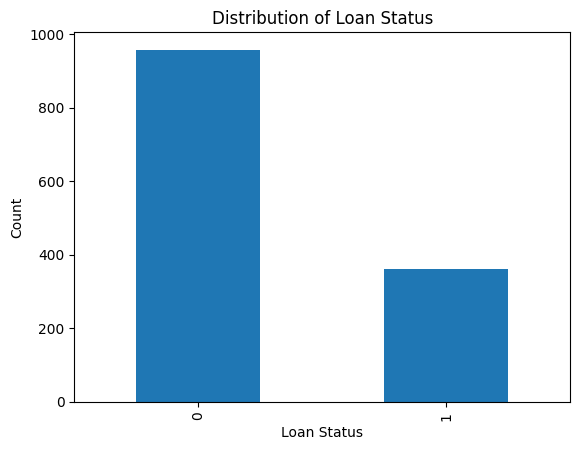

In [ ]:
class_counts = data["LoanApproved"].value_counts()
class_percent = data["LoanApproved"].value_counts(normalize=True) * 100

print('Distribution of Target')
print(pd.concat([class_counts, class_percent.round(2)], axis=1, keys=["Count", "Percent"]))

class_counts.plot(kind="bar", title="Distribution of Loan Status")
plt.xlabel("Loan Status")
plt.ylabel("Count")
plt.show()
# probably (LoanApproved = 0) means YES and (LoanApproved = 1) means YES

# Correlation Matrix

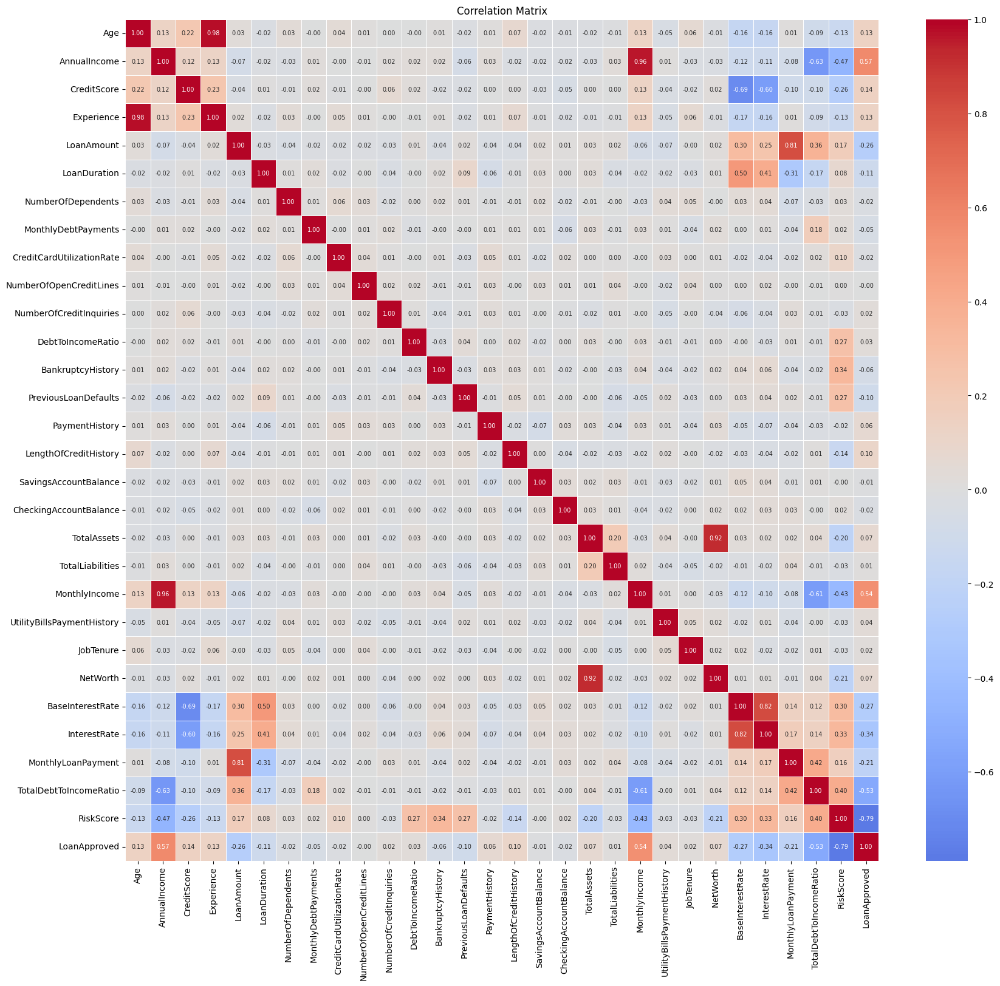

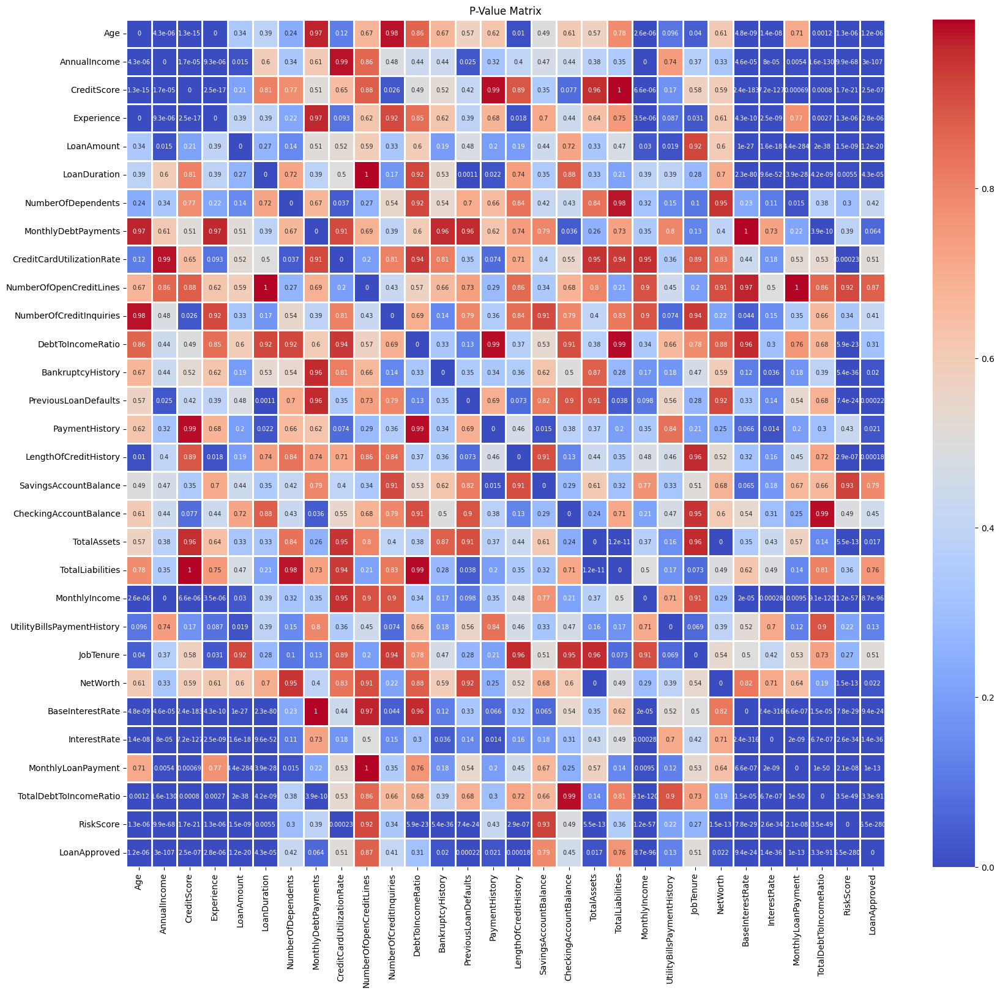

In [ ]:
from scipy.stats import pearsonr, ConstantInputWarning
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

df = data.copy()

# Select only numeric columns for correlation analysis
numeric_cols = df.select_dtypes(include=[np.number]).columns.tolist()

# Calculate the correlation matrix using pandas
corr_matrix = df[numeric_cols].corr()

# Create an empty p-value matrix with zeros
pval_matrix = pd.DataFrame(
    np.zeros((len(numeric_cols), len(numeric_cols))),
    index=numeric_cols,
    columns=numeric_cols
)

# Fill the p-value matrix using pearsonr
for i, col1 in enumerate(numeric_cols):
    for j, col2 in enumerate(numeric_cols):
        if i == j:
            # diagonal entries (self-correlation) have p-value zero
            pval_matrix.iloc[i, j] = 0.0
        else:
            pair_data = df[[col1, col2]].dropna()
            if len(pair_data) > 1:
                with warnings.catch_warnings():
                    warnings.filterwarnings('ignore', category=ConstantInputWarning)
                    r_value, p_value = pearsonr(pair_data[col1], pair_data[col2])
                pval_matrix.iloc[i, j] = p_value
            else:
                pval_matrix.iloc[i, j] = np.nan  # Not enough data points

# Plot the correlation matrix with numbers
plt.figure(figsize=(20, 18))
sns.heatmap(
    corr_matrix,
    annot=True,      # show correlation coefficients
    fmt='.2f',       # format numbers with two decimals
    cmap='coolwarm',
    center=0,
    annot_kws={'size': 7},
    linewidths=.5
)
plt.title('Correlation Matrix')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

# Plot the p-value matrix with numbers
plt.figure(figsize=(20, 18))
sns.heatmap(
    pval_matrix,
    annot=True,      # show p-values in each cell
    fmt='.2g',       # scientific notation for small numbers
    cmap='coolwarm',
    annot_kws={'size': 7},
    linewidths=.8
)
plt.title('P-Value Matrix')
plt.xticks(rotation=90)
plt.yticks(rotation=0)
plt.show()

# <span style="color: purple">Univariate Analysis</span>

For date variable:

In [ ]:
# exrtact year , monthb and season
data['Year'] = data['ApplicationDate'].dt.year
data['Month'] = data['ApplicationDate'].dt.month
data['Quarter'] = data['ApplicationDate'].dt.quarter

In [ ]:
Year_Month_counts = data.groupby(['Year', 'Month']).size().reset_index(name='LoanApplications')
Year_Month_counts

,Year,Month,LoanApplications
0,2018,1,3
1,2018,2,3
2,2018,3,3
3,2018,4,2
4,2018,5,3
...,...,...,...
582,2072,6,2
583,2072,7,3
584,2072,8,2
585,2072,9,4


In [ ]:
Year_counts = data.groupby(['Year']).size().reset_index(name='LoanApplications')
Year_counts

,Year,LoanApplications
0,2018,23
1,2019,20
2,2020,17
3,2021,27
4,2022,23
5,2023,23
6,2024,24
7,2025,18
8,2026,28
9,2027,24


In [ ]:
Month_counts = data.groupby(['Year']).size().reset_index(name='LoanApplications')
Month_counts

,Year,LoanApplications
0,2018,23
1,2019,20
2,2020,17
3,2021,27
4,2022,23
5,2023,23
6,2024,24
7,2025,18
8,2026,28
9,2027,24


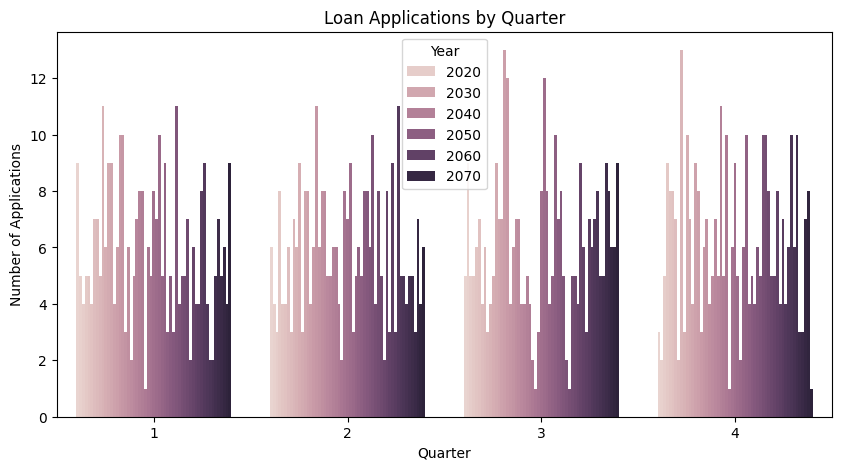

In [ ]:
seasonal_counts = data.groupby(['Year', 'Quarter']).size().reset_index(name='LoanApplications')
plt.figure(figsize=(10,5))
sns.barplot(x='Quarter', y='LoanApplications', hue='Year', data=seasonal_counts)
plt.title("Loan Applications by Quarter")
plt.xlabel("Quarter")
plt.ylabel("Number of Applications")
plt.show()


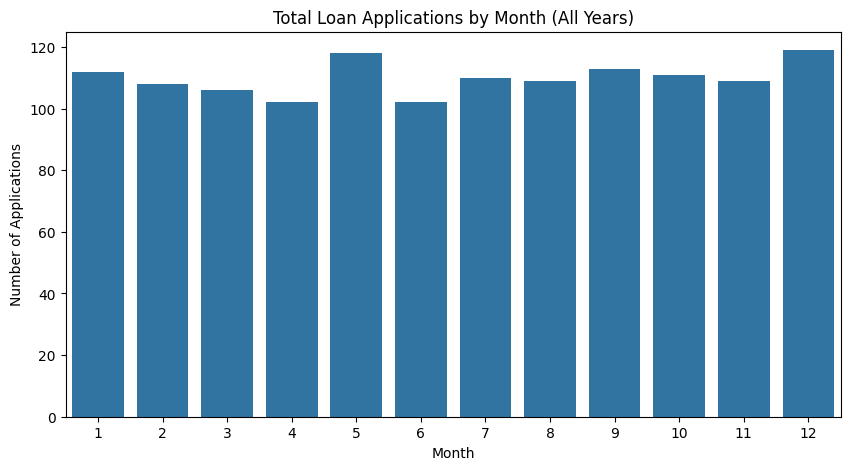

In [ ]:
plt.figure(figsize=(10,5))
sns.countplot(x=data['Month'])
plt.title("Total Loan Applications by Month (All Years)")
plt.xlabel("Month")
plt.ylabel("Number of Applications")
plt.show()

=== Analysis for Age ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1310.000000,42.718321,9.544839,23.000000,35.000000,42.000000,49.000000,70.000000,0.350092,-0.473938,9,0,0.000000,Not Normal (p <= 0.05)


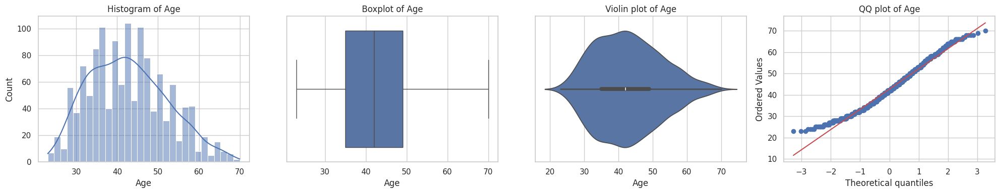

=== Analysis for AnnualIncome ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1235.000000,54156.595951,27901.997559,15000.000000,33383.500000,48802.000000,69389.500000,139145.000000,0.917049,0.274811,84,30,0.000000,Not Normal (p <= 0.05)


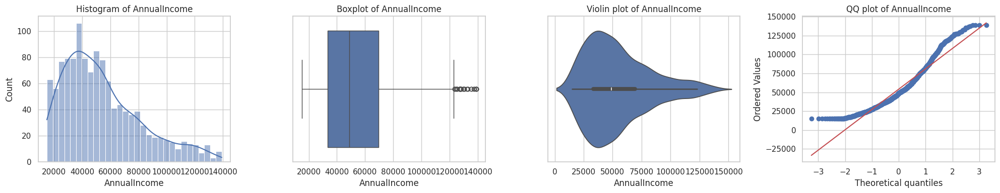

=== Analysis for CreditScore ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1287.000000,574.138306,49.061292,436.000000,542.000000,578.000000,611.000000,696.000000,-0.410849,-0.289316,32,1,0.000000,Not Normal (p <= 0.05)


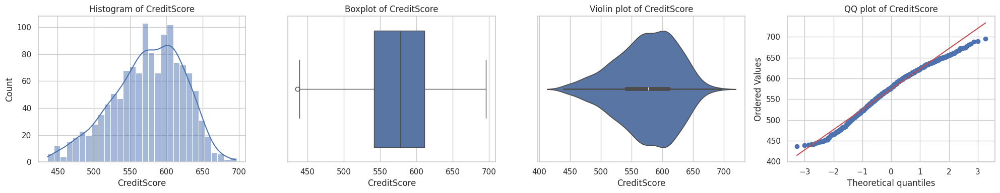

=== Analysis for Experience ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1311.000000,20.323417,9.519080,1.000000,13.000000,20.000000,27.000000,48.000000,0.391547,-0.458014,8,0,0.000000,Not Normal (p <= 0.05)


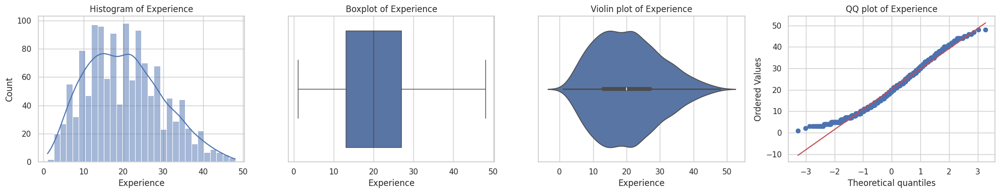

=== Analysis for LoanAmount ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1256.000000,22888.203025,9840.722857,4571.000000,15650.750000,21006.500000,28940.500000,51333.000000,0.698716,-0.029172,63,13,0.000000,Not Normal (p <= 0.05)


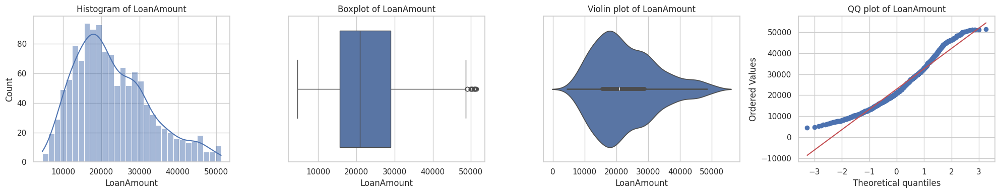

=== Analysis for LoanDuration ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1291.000000,52.219985,22.527735,12.000000,36.000000,48.000000,60.000000,108.000000,0.480830,-0.085236,28,40,0.000000,Not Normal (p <= 0.05)


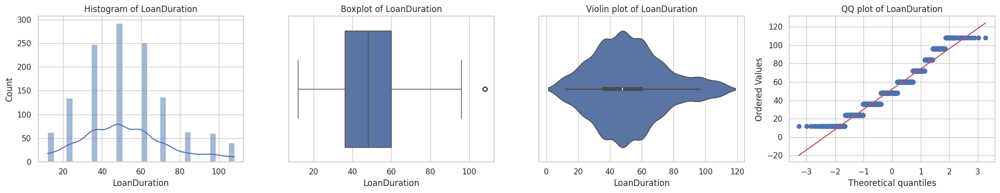

=== Analysis for NumberOfDependents ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1319.000000,1.445034,1.358882,0.000000,0.000000,1.000000,2.000000,5.000000,0.699360,-0.328047,0,0,0.000000,Not Normal (p <= 0.05)


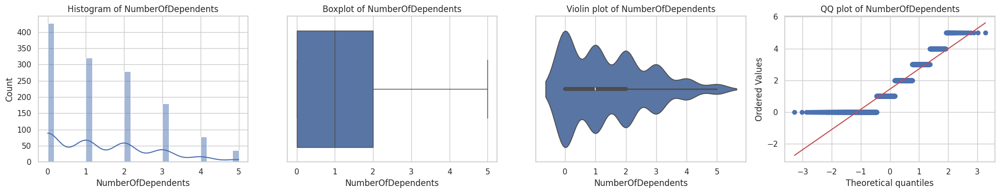

=== Analysis for MonthlyDebtPayments ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1270.000000,433.099483,191.038361,85.000000,287.000000,396.000000,550.750000,995.000000,0.718205,-0.022137,49,14,0.000000,Not Normal (p <= 0.05)


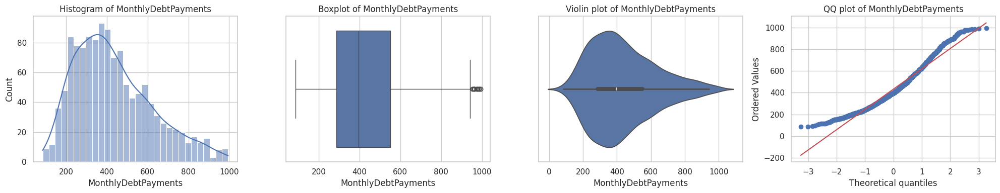

=== Analysis for CreditCardUtilizationRate ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1310.000000,0.292768,0.157797,0.004364,0.169561,0.276076,0.401495,0.757964,0.471455,-0.446422,9,1,0.000000,Not Normal (p <= 0.05)


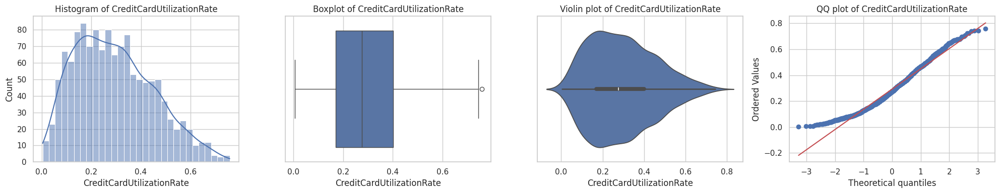

=== Analysis for NumberOfOpenCreditLines ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1310.000000,3.067176,1.531959,1.000000,2.000000,3.000000,4.000000,7.000000,0.621072,-0.179124,9,0,0.000000,Not Normal (p <= 0.05)


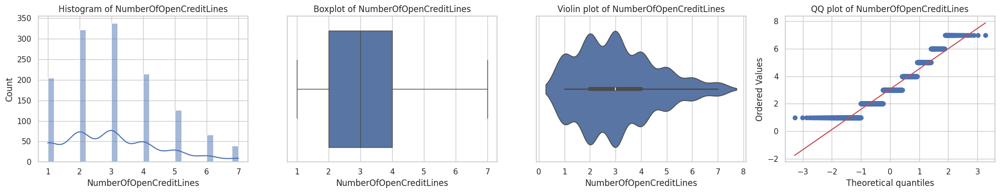

=== Analysis for NumberOfCreditInquiries ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1319.000000,0.967400,0.965882,0.000000,0.000000,1.000000,2.000000,5.000000,0.940512,0.682220,0,0,0.000000,Not Normal (p <= 0.05)


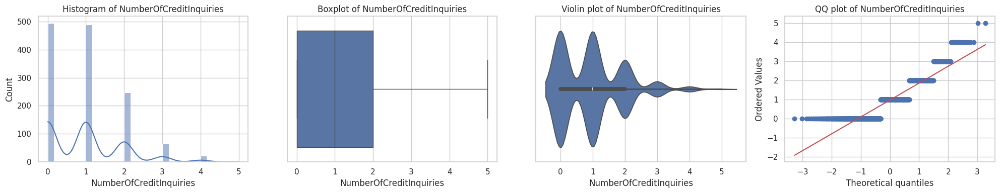

=== Analysis for DebtToIncomeRatio ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1309.000000,0.287032,0.150411,0.016844,0.169422,0.271296,0.390913,0.719524,0.392742,-0.495714,10,0,0.000000,Not Normal (p <= 0.05)


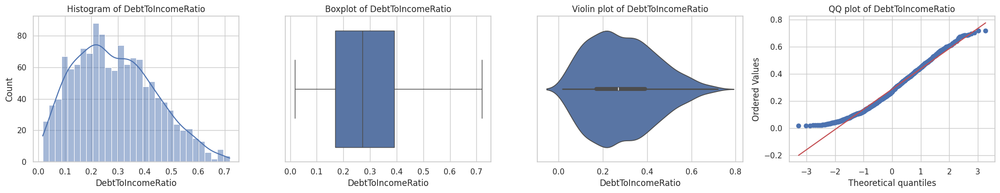

=== Analysis for BankruptcyHistory ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1319.000000,0.047005,0.211730,0.000000,0.000000,0.000000,0.000000,1.000000,4.285473,16.390128,0,62,0.000000,Not Normal (p <= 0.05)


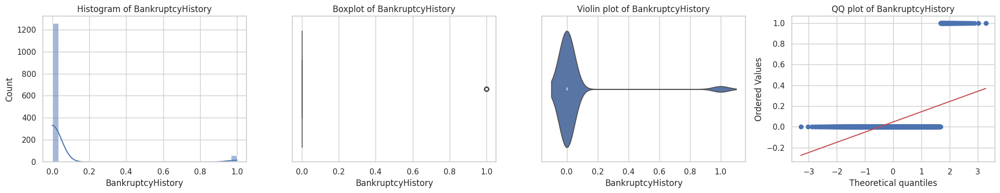

=== Analysis for PreviousLoanDefaults ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1319.000000,0.099318,0.299201,0.000000,0.000000,0.000000,0.000000,1.000000,2.682412,5.203220,0,131,0.000000,Not Normal (p <= 0.05)


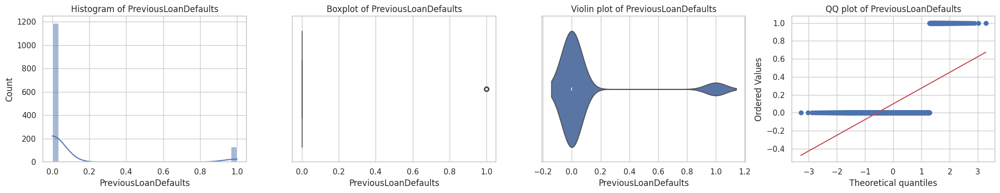

=== Analysis for PaymentHistory ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1304.000000,24.235429,4.544039,12.000000,21.000000,24.000000,27.000000,36.000000,0.038450,-0.396644,15,0,0.000005,Not Normal (p <= 0.05)


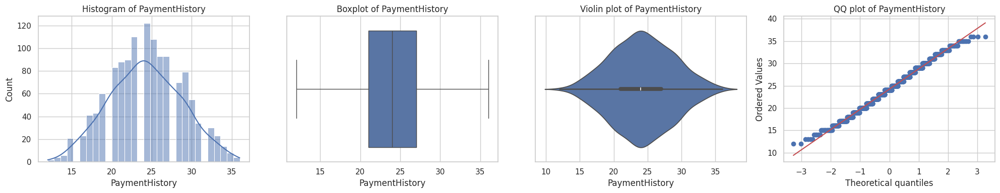

=== Analysis for LengthOfCreditHistory ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1319.000000,14.489007,8.372655,1.000000,7.000000,14.000000,22.000000,29.000000,0.089721,-1.214735,0,0,0.000000,Not Normal (p <= 0.05)


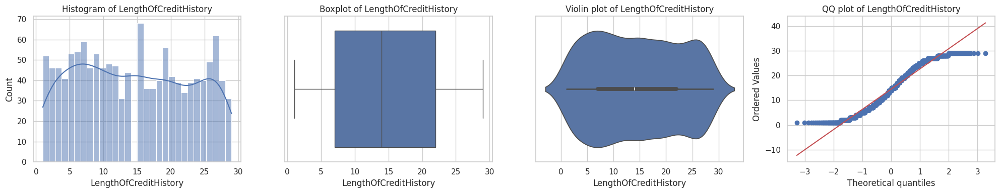

=== Analysis for SavingsAccountBalance ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1221.000000,3563.896806,2784.422138,124.000000,1386.000000,2745.000000,4936.000000,12655.000000,1.162933,0.748301,98,42,0.000000,Not Normal (p <= 0.05)


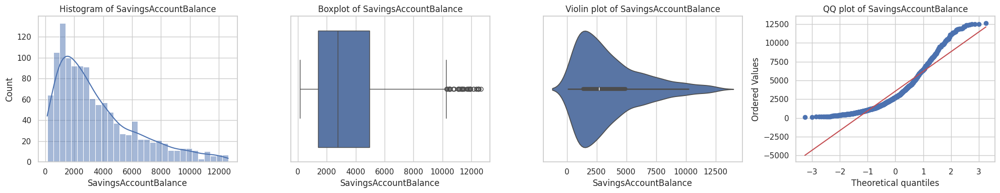

=== Analysis for CheckingAccountBalance ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1217.000000,1317.036154,1046.192658,45.000000,507.000000,990.000000,1845.000000,4605.000000,1.149366,0.674392,102,47,0.000000,Not Normal (p <= 0.05)


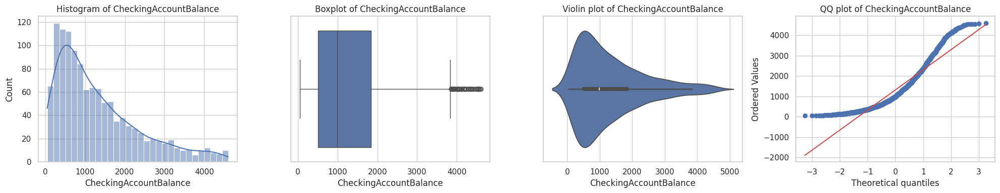

=== Analysis for TotalAssets ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1226.000000,91272.716150,62213.777418,5596.000000,42854.500000,74579.000000,124148.500000,281965.000000,1.039210,0.398213,93,25,0.000000,Not Normal (p <= 0.05)


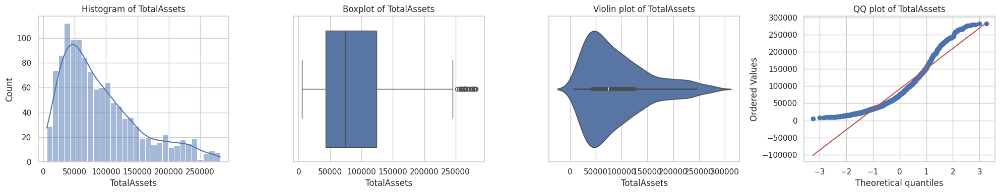

=== Analysis for TotalLiabilities ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1243.000000,19914.683829,14280.586139,1076.000000,8785.500000,16279.000000,27217.000000,62604.000000,1.025928,0.328020,76,35,0.000000,Not Normal (p <= 0.05)


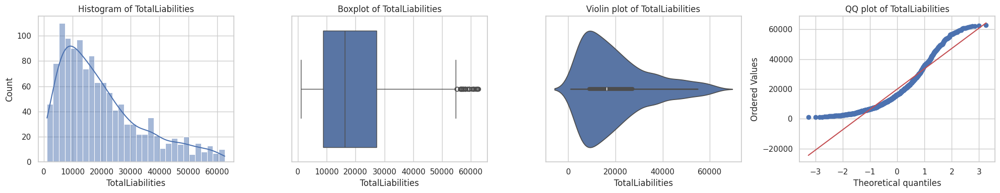

=== Analysis for MonthlyIncome ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1244.000000,4358.811763,2248.868743,625.000000,2683.958333,3854.416667,5576.395833,11085.083333,0.881851,0.196744,75,28,0.000000,Not Normal (p <= 0.05)


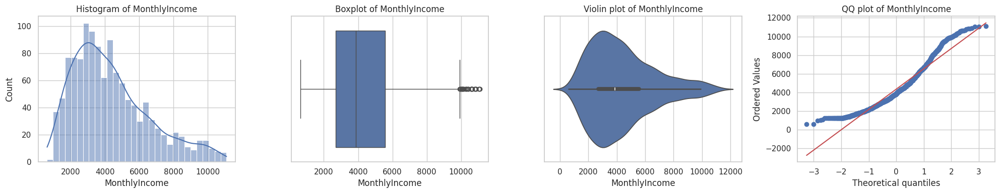

=== Analysis for UtilityBillsPaymentHistory ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1310.000000,0.797721,0.118636,0.445970,0.715333,0.816479,0.892962,0.996563,-0.563247,-0.369353,9,1,0.000000,Not Normal (p <= 0.05)


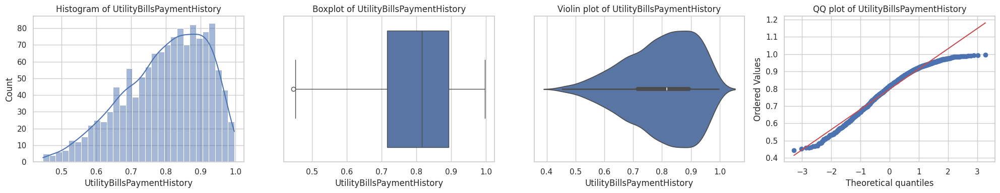

=== Analysis for JobTenure ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1284.000000,4.880062,1.904077,1.000000,4.000000,5.000000,6.000000,9.000000,0.214167,-0.541037,35,0,0.000000,Not Normal (p <= 0.05)


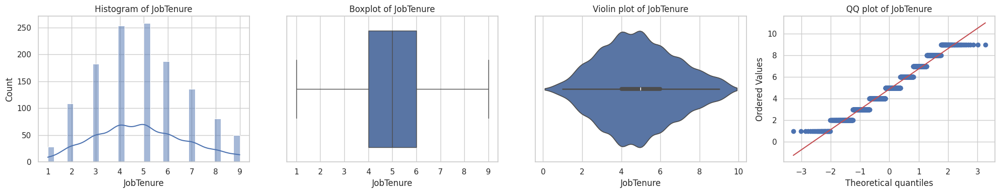

=== Analysis for NetWorth ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1214.000000,65351.364086,55395.664360,1018.000000,22447.250000,48467.000000,93947.500000,237646.000000,1.148862,0.684722,105,44,0.000000,Not Normal (p <= 0.05)


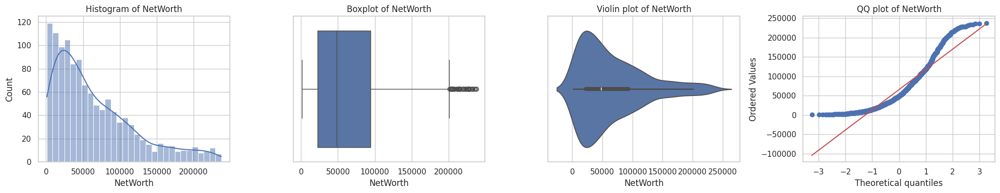

=== Analysis for BaseInterestRate ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1298.000000,0.236969,0.032994,0.145969,0.213741,0.235067,0.259645,0.329511,0.238165,-0.352507,21,1,0.000006,Not Normal (p <= 0.05)


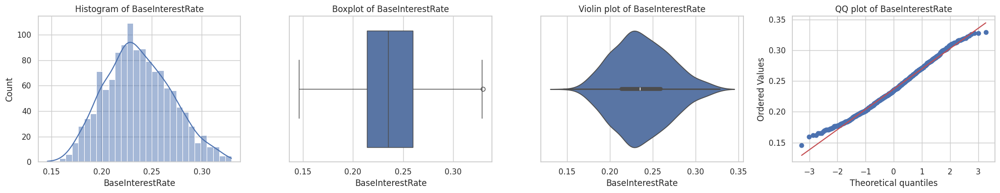

=== Analysis for InterestRate ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1304.000000,0.237000,0.040297,0.123412,0.206712,0.234520,0.263837,0.348521,0.260004,-0.307826,15,0,0.000002,Not Normal (p <= 0.05)


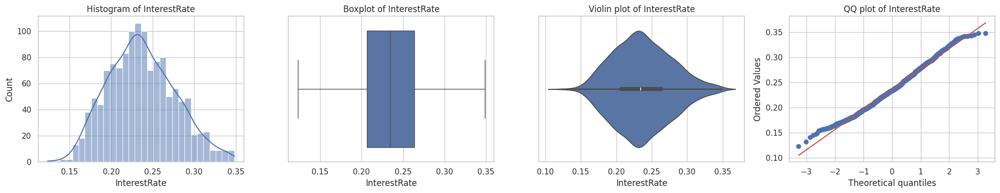

=== Analysis for MonthlyLoanPayment ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1228.000000,775.696487,393.450690,119.224371,477.728164,687.312254,997.611404,1994.726474,0.898976,0.233222,91,26,0.000000,Not Normal (p <= 0.05)


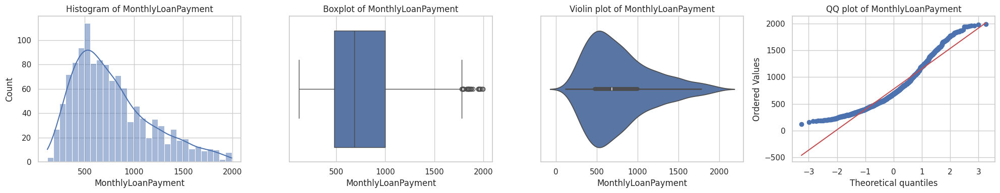

=== Analysis for TotalDebtToIncomeRatio ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1237.000000,0.326942,0.204876,0.034436,0.172139,0.276389,0.438614,0.951462,0.956978,0.273071,82,28,0.000000,Not Normal (p <= 0.05)


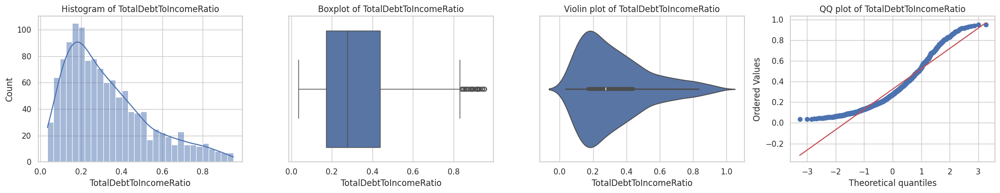

=== Analysis for RiskScore ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1315.000000,49.912091,7.692325,30.400000,44.000000,51.000000,55.000000,70.000000,-0.193336,-0.451424,4,0,0.000000,Not Normal (p <= 0.05)


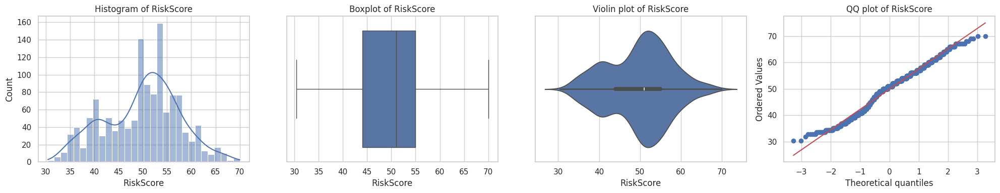

=== Analysis for LoanApproved ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1319.000000,0.273692,0.446022,0.000000,0.000000,0.000000,1.000000,1.000000,1.016324,-0.968556,0,0,0.000000,Not Normal (p <= 0.05)


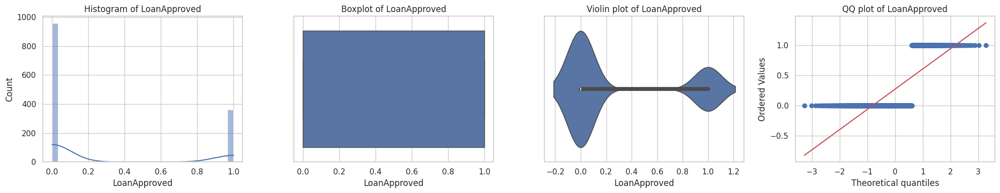

=== Analysis for Year ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1319.000000,2044.696740,15.726819,2018.000000,2031.000000,2045.000000,2058.000000,2072.000000,0.055504,-1.198289,0,0,0.000000,Not Normal (p <= 0.05)


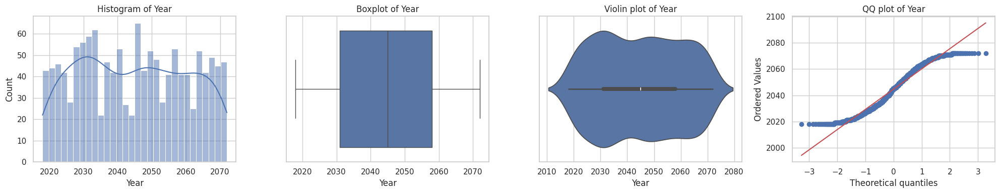

=== Analysis for Month ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1319.000000,6.559515,3.477990,1.000000,4.000000,7.000000,10.000000,12.000000,-0.022292,-1.223084,0,0,0.000000,Not Normal (p <= 0.05)


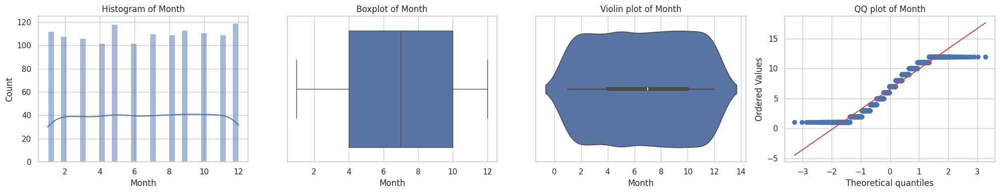

=== Analysis for Quarter ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1319.000000,2.518575,1.122029,1.000000,2.000000,3.000000,4.000000,4.000000,-0.025469,-1.368200,0,0,0.000000,Not Normal (p <= 0.05)


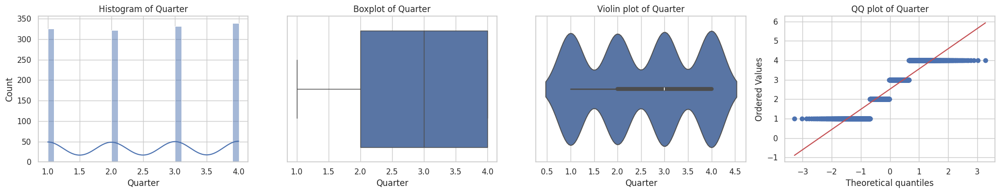

=== Analysis for EmploymentStatus ===


,Unique Categories,Most Frequent,Frequency,Missing
0,3,Employed,1125,0


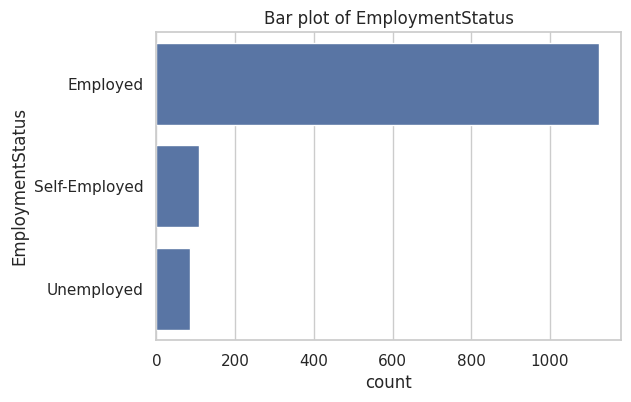

=== Analysis for EducationLevel ===


,Unique Categories,Most Frequent,Frequency,Missing
0,5,Bachelor,435,0


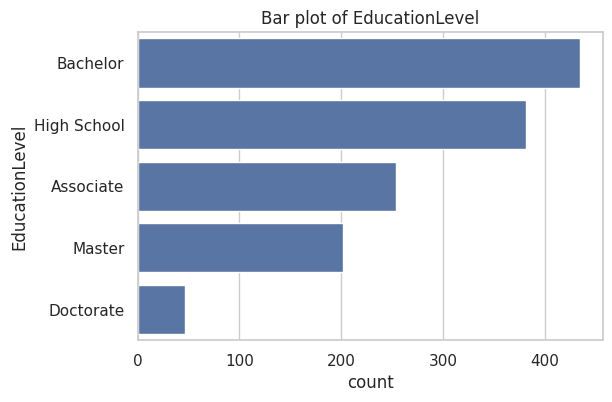

=== Analysis for MaritalStatus ===


,Unique Categories,Most Frequent,Frequency,Missing
0,4,Married,676,0


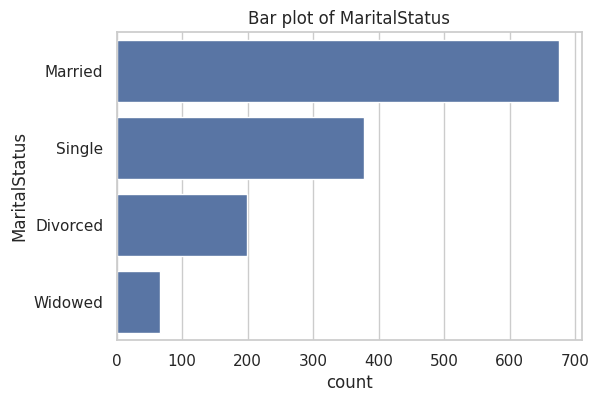

=== Analysis for HomeOwnershipStatus ===


,Unique Categories,Most Frequent,Frequency,Missing
0,4,Mortgage,503,0


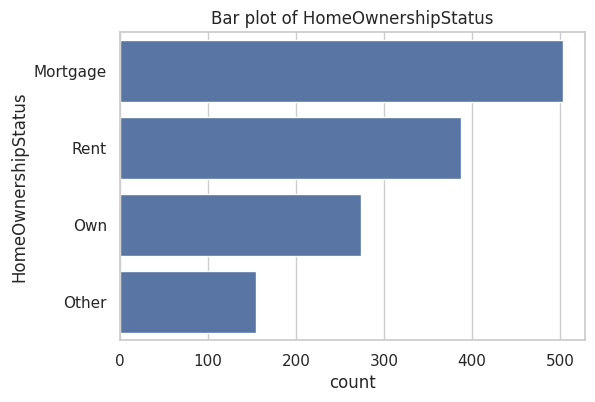

=== Analysis for LoanPurpose ===


,Unique Categories,Most Frequent,Frequency,Missing
0,5,Home,411,0


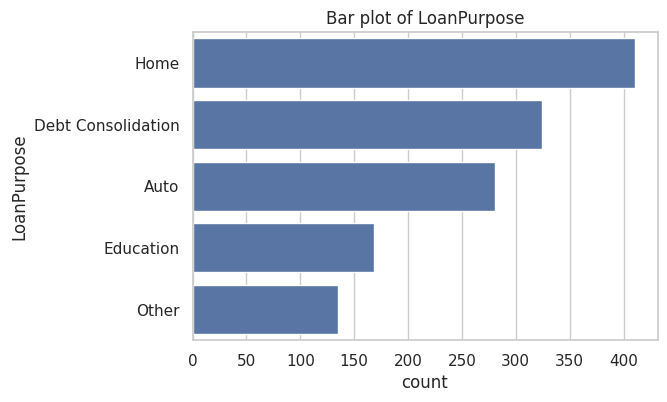

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# Set plot style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (16,5)

# Separate numeric and categorical columns
numeric_cols = data.select_dtypes(include=np.number).columns.tolist()
categorical_cols = data.select_dtypes(include='object').columns.tolist()

# Function for univariate analysis of numeric columns
def analyze_numeric(data,col):
    print(f"=== Analysis for {col} ===")

    # Basic stats
    desc = data[col].describe()
    skewness = data[col].skew()
    kurtosis = data[col].kurt()
    missing = data[col].isnull().sum()

    # Outliers
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    outliers = data[(data[col] < (Q1 - 1.5 * IQR)) | (data[col] > (Q3 + 1.5 * IQR))]

    # Normality Test (Shapiro-Wilk)
    stat, p = stats.shapiro(data[col].dropna())
    normality_result = " Normal (p > 0.05)" if p > 0.05 else "Not Normal (p <= 0.05)"

    # Create summary table
    summary_df = pd.DataFrame({
        "count": [desc["count"]],
        "mean": [desc["mean"]],
        "std": [desc["std"]],
        "min": [desc["min"]],
        "25%": [desc["25%"]],
        "50%": [desc["50%"]],
        "75%": [desc["75%"]],
        "max": [desc["max"]],
        "skewness": [skewness],
        "kurtosis": [kurtosis],
        "missing": [missing],
        "outliers": [outliers.shape[0]],
        "Shapiro-Wilk p-value": [p],
        "Normality Result": [normality_result]
    })

    # Display summary table
    display(summary_df.style.background_gradient(cmap="Blues").set_caption(f"Summary of {col}"))

    # Plots: histogram, boxplot, violinplot, QQ plot
    fig, axes = plt.subplots(1, 4, figsize=(20, 4))

    sns.histplot(data[col], kde=True, bins=30, ax=axes[0])
    axes[0].set_title(f"Histogram of {col}")

    sns.boxplot(x=data[col], ax=axes[1])
    axes[1].set_title(f"Boxplot of {col}")

    sns.violinplot(x=data[col], ax=axes[2])
    axes[2].set_title(f"Violin plot of {col}")

    stats.probplot(data[col].dropna(), dist="norm", plot=axes[3])
    axes[3].set_title(f"QQ plot of {col}")

    plt.tight_layout()
    plt.show()

# Function for univariate analysis of categorical columns
def analyze_categorical(data,col):
    print(f"=== Analysis for {col} ===")
    counts = data[col].value_counts()
    missing = data[col].isnull().sum()

    # Summary table
    summary_df = pd.DataFrame({
        "Unique Categories": [data[col].nunique()],
        "Most Frequent": [counts.index[0]],
        "Frequency": [counts.iloc[0]],
        "Missing": [missing]
    })

    display(summary_df.style.background_gradient(cmap="Oranges").set_caption(f"Summary of {col}"))

    # Bar plot
    plt.figure(figsize=(6,4))
    sns.countplot(y=data[col], order=data[col].value_counts().index)
    plt.title(f"Bar plot of {col}")
    plt.show()

# Run analysis
for col in numeric_cols:
    analyze_numeric(data,col)

for col in categorical_cols:
    analyze_categorical(data,col)


# <span style="color: purple">Bivariate Analysis</span>

In [ ]:
from scipy import stats

def _pretty_num(x: float) -> str:
    ax = abs(x)
    if ax >= 1e9: s = f"{x/1e9:.1f}B"
    elif ax >= 1e6: s = f"{x/1e6:.1f}M"
    elif ax >= 1e3: s = f"{x/1e3:.1f}k"
    elif ax >= 100: s = f"{x:.0f}"
    elif ax >= 10:  s = f"{x:.1f}"
    elif ax >= 1:   s = f"{x:.2f}"
    else:           s = f"{x:.3f}"
    return s.rstrip("0").rstrip(".")

def analyze_continuous_vs_binary(df, cont_col, target_col,alpha=0.05, bins=10):
    df[cont_col]= df[cont_col].dropna()
    df[target_col] = df[target_col].dropna()
    df = df[[cont_col, target_col]].copy()
    df[cont_col] = pd.to_numeric(df[cont_col], errors="coerce")

    # if not pd.api.types.is_numeric_dtype(df[target_col]):
    #     mapping = {"1": 1, "0": 0}
    #     df[target_col] = df[target_col].astype(str).str.lower().map(mapping)

    # Normalize/keep binary target
    if not pd.api.types.is_numeric_dtype(df[target_col]):
        df[target_col] = df[target_col].astype(str).str.strip().str.lower().map({"0":0,"1":1})

    # Build clean groups (no NaN/inf)
    x = df[cont_col]
    y = df[target_col]
    mask = y.isin([0,1]) & np.isfinite(x)

    group0 = x[mask & (y == 0)].astype(float)
    group1 = x[mask & (y == 1)].astype(float)

    # # split into two groups by target value
    # group0 = df[df[target_col] == 0][cont_col].astype(float)
    # group1 = df[df[target_col] == 1][cont_col].astype(float)

    # normality test (Shapiro–Wilk)
    normal0 = normal1 = False
    p_sh0 = p_sh1 = np.nan
    if len(group0) >= 3:
        _, p_sh0 = stats.shapiro(group0); normal0 = p_sh0 > 0.05
    if len(group1) >= 3:
        _, p_sh1 = stats.shapiro(group1); normal1 = p_sh1 > 0.05

    # choose statistical test
    if normal0 and normal1:
        t_stat, p_value = stats.ttest_ind(group0, group1, equal_var=False)
        test_name = "Welch t-test"
    else:
        t_stat, p_value = stats.mannwhitneyu(group0, group1, alternative='two-sided')
        test_name = "Mann–Whitney U"

    # plotting
    fig, axes = plt.subplots(1, 3, figsize=(15, 6))
    fig.suptitle(f"Analysis of {cont_col} vs {target_col}", fontsize=14)

    # 1) stacked histogram
    axes[0].hist([group0, group1], bins=bins, stacked=True,
                 label=[f"{target_col}=0", f"{target_col}=1"])
    axes[0].set_title(f"Stacked Histogram of {cont_col}")
    axes[0].set_xlabel(cont_col); axes[0].set_ylabel("Count"); axes[0].legend()

    # 2) KDE
    xs = np.linspace(df[cont_col].min(), df[cont_col].max(), 200)
    try:
        kde0 = stats.gaussian_kde(group0); kde1 = stats.gaussian_kde(group1)
        axes[1].plot(xs, kde0(xs), label=f"{target_col}=0")
        axes[1].plot(xs, kde1(xs), label=f"{target_col}=1")
    except Exception:
        axes[1].hist(group0, bins=bins, density=True, histtype="step", label=f"{target_col}=0")
        axes[1].hist(group1, bins=bins, density=True, histtype="step", label=f"{target_col}=1")
    axes[1].set_title(f"KDE of {cont_col} by {target_col}")
    axes[1].set_xlabel(cont_col); axes[1].set_ylabel("Density"); axes[1].legend()

    # 3) per-bin proportions
    bin_edges = np.histogram_bin_edges(df[cont_col].dropna(), bins=bins)
    df_binned = pd.cut(df[cont_col], bins=bin_edges, include_lowest=True)
    prop_table = pd.crosstab(df_binned, df[target_col], normalize="index")


    intervals = list(prop_table.index)
    labels, seen = [], set()
    for i, iv in enumerate(intervals):
        if isinstance(iv, pd.Interval):
            lab = f"{_pretty_num(iv.left)}–{_pretty_num(iv.right)}"
        else:
            lab = str(iv)
        if lab in seen:
            lab = f"B{i+1}: {lab}"
        seen.add(lab)
        labels.append(lab)

    prop_table.index = labels


    bottoms = np.zeros(len(prop_table))
    for col in prop_table.columns:
        heights = prop_table[col].values
        axes[2].bar(prop_table.index.astype(str), heights, bottom=bottoms,
                    label=f"{target_col}={int(col)}")
        bottoms += heights
    axes[2].set_title(f"Per-bin Proportions ({cont_col})")
    axes[2].set_xlabel(cont_col); axes[2].set_ylabel("Proportion")
    axes[2].set_ylim(0, 1); axes[2].tick_params(axis="x", rotation=45); axes[2].legend()

    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

    # print stats
    print(f"Group sizes — {target_col}=0: {len(group0)}, {target_col}=1: {len(group1)}")
    print(f"Shapiro–Wilk for {target_col}=0: p = {p_sh0:.4f} → {'Normal' if normal0 else 'Non-normal'}")
    print(f"Shapiro–Wilk for {target_col}=1: p = {p_sh1:.4f} → {'Normal' if normal1 else 'Non-normal'}")
    print(f"Test used: {test_name}")
    print(f"p-value: {p_value}")
    if p_value < alpha:
        print(f"  → H0 rejected at {alpha*100:.1f}% significance level.")
    else:
        print(f"  → H0 not rejected at {alpha*100:.1f}% significance level.")

In [ ]:
from scipy.stats import chi2_contingency

def _pretty_num(x: float) -> str:
    try:
        xv = float(x)
    except Exception:
        return str(x)
    if np.isclose(xv, round(xv), atol=1e-9):
        return str(int(round(xv)))
    ax = abs(xv)
    if ax >= 100: s = f"{xv:.0f}"
    elif ax >= 10: s = f"{xv:.1f}"
    elif ax >= 1:  s = f"{xv:.2f}"
    else:          s = f"{xv:.3f}"
    return s.rstrip("0").rstrip(".")

def _pretty_labels_from_index(idx) -> list:
    labels, seen = [], set()
    if isinstance(idx, pd.IntervalIndex):
        raw = [f"{_pretty_num(iv.left)}–{_pretty_num(iv.right)}" for iv in idx]
    else:
        raw = [_pretty_num(x) if isinstance(x, (int, float, np.number)) else str(x) for x in idx]
    for i, lab in enumerate(raw):
        if lab in seen:
            lab = f"B{i+1}: {lab}"
        seen.add(lab)
        labels.append(lab)
    return labels

def analyze_cat_vs_binary(data, feature_col, target_col, alpha=0.05):
    data[feature_col] = data[feature_col].dropna()
    data[target_col] = data[target_col].dropna()
    ct = compute_crosstab(data, feature_col, target_col)
    plot_bivariate_results(feature_col, ct)
    chi2, p_value, dof = calculate_chi_square(ct)
    print(f"p-value = {p_value}")
    if p_value < alpha:
        print(f"  → H0 rejected at {alpha*100:.1f}% significance level.")
    else:
        print(f"  → H0 not rejected at {alpha*100:.1f}% significance level.")

def compute_crosstab(data, feature, target):
    ct = pd.crosstab(data[feature], data[target]).astype(int)
    return ct

def calculate_chi_square(crosstab):
    chi2_stat, p_value, dof, _ = chi2_contingency(crosstab)
    return chi2_stat, p_value, dof

def plot_bivariate_results(feature, crosstab):
    # ensure both 0 and 1 columns exist, then order them
    for val in [0, 1]:
        if val not in crosstab.columns:
            crosstab[val] = 0
    crosstab = crosstab[[0, 1]]

    pretty_labels = _pretty_labels_from_index(crosstab.index)

    total_counts = crosstab.sum(axis=1)
    total_sum = total_counts.sum()
    proportions = total_counts / float(total_sum) * 100.0 if total_sum else total_counts*0

    # row-wise percentages
    row_sum = crosstab.sum(axis=1).replace(0, np.nan)
    perc_by_target = crosstab.div(row_sum, axis=0) * 100.0

    # figure
    fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(14, 6))
    fig.suptitle(feature, fontsize=14, y=0.98)

    # --- top row tables ---
    axes[0, 0].axis("off")
    axes[0, 0].set_title("Category Frequency")
    freq_df = pd.DataFrame({"count": total_counts, "percent": proportions}).round(2)
    t0 = axes[0, 0].table(
        cellText=freq_df.values,
        rowLabels=pretty_labels,
        colLabels=freq_df.columns,
        loc="center",
    )
    t0.auto_set_font_size(False); t0.set_fontsize(8); t0.scale(1.2, 1.2)

    axes[0, 1].axis("off")
    axes[0, 1].set_title("Count by Category and Target")
    t1 = axes[0, 1].table(
        cellText=crosstab.values,
        rowLabels=pretty_labels,
        colLabels=["No", "Yes"],
        loc="center",
    )
    t1.auto_set_font_size(False); t1.set_fontsize(8); t1.scale(1.2, 1.2)

    axes[0, 2].axis("off")
    axes[0, 2].set_title("Percentage by Category and Target")
    t2 = axes[0, 2].table(
        cellText=np.round(perc_by_target.values, 2),
        rowLabels=pretty_labels,
        colLabels=["No", "Yes"],
        loc="center",
    )
    t2.auto_set_font_size(False); t2.set_fontsize(8); t2.scale(1.2, 1.2)

    # --- bottom row charts ---
    # frequency bar
    axes[1, 0].bar(pretty_labels, total_counts.values)
    axes[1, 0].set_title("Frequency Bar Chart")
    axes[1, 0].set_xlabel(feature)
    axes[1, 0].set_ylabel("Count")
    axes[1, 0].tick_params(axis="x", rotation=45)

    # grouped bar
    indices = np.arange(len(crosstab.index))
    width = 0.35
    axes[1, 1].bar(indices - width/2.0, crosstab[0].values, width=width, label="No")
    axes[1, 1].bar(indices + width/2.0, crosstab[1].values, width=width, label="Yes")
    axes[1, 1].set_title("Grouped Bar Chart")
    axes[1, 1].set_xlabel(feature); axes[1, 1].set_ylabel("Count")
    axes[1, 1].set_xticks(indices)
    axes[1, 1].set_xticklabels(pretty_labels, rotation=45, ha="right")
    axes[1, 1].legend()

    # normalised stacked
    axes[1, 2].bar(pretty_labels, perc_by_target[0].fillna(0).values, label="No")
    axes[1, 2].bar(pretty_labels, perc_by_target[1].fillna(0).values,
                   bottom=perc_by_target[0].fillna(0).values, label="Yes")
    axes[1, 2].set_title("Normalised Stacked Bar Chart")
    axes[1, 2].set_xlabel(feature); axes[1, 2].set_ylabel("Percentage")
    axes[1, 2].set_ylim(0, 100)
    axes[1, 2].tick_params(axis="x", rotation=45)
    axes[1, 2].legend()

    plt.tight_layout()
    plt.show()

# <span style="color: purple">Multivariate Analysis</span>

In [ ]:
from scipy import stats
from scipy.stats import chi2_contingency, fisher_exact

def run_ttest(df, cont_col, target_col, alpha=0.05):
    x = pd.to_numeric(df[cont_col], errors="coerce")
    y = pd.to_numeric(df[target_col], errors="coerce")

    mask = y.isin([0,1]) & np.isfinite(x)
    group0 = x[mask & (y==0)].astype(float)
    group1 = x[mask & (y==1)].astype(float)

    normal0 = normal1 = False
    p_sh0 = p_sh1 = np.nan
    if len(group0) >= 3:
        _, p_sh0 = stats.shapiro(group0); normal0 = p_sh0 > 0.05
    if len(group1) >= 3:
        _, p_sh1 = stats.shapiro(group1); normal1 = p_sh1 > 0.05

    if normal0 and normal1:
        stat, p_val = stats.ttest_ind(group0, group1, equal_var=False)
        test_name = "Welch t-test"
    else:
        stat, p_val = stats.mannwhitneyu(group0, group1, alternative="two-sided")
        test_name = "Mann–Whitney U"

    signif = "✅ Significant" if p_val < alpha else "❌ Not Significant"
    return f"{test_name} on {cont_col} vs {target_col}: Stat = {stat:.4f}, P-value = {p_val:.4f} → {signif}"


def run_chi2(df, col1, col2, alpha=0.05):
    contingency = pd.crosstab(df[col1], df[col2])
    if contingency.shape == (2,2):
        stat, p_val = fisher_exact(contingency)
        test_name = "Fisher's Exact"
    else:
        stat, p_val, dof, expected = chi2_contingency(contingency)
        test_name = "Chi-square"
    signif = "✅ Significant" if p_val < alpha else "❌ Not Significant"
    return f"{test_name} on {col1} vs {col2}: Stat = {stat:.4f}, P-value = {p_val:.4f} → {signif}"


In [ ]:
numeric_cols = data.select_dtypes(include=np.number).columns.tolist()
numeric_cols.remove('LoanApproved')  # target column

# Compute correlation of numeric features with target
corr_with_target = data[numeric_cols + ['LoanApproved']].corr()['LoanApproved'].sort_values(ascending=False)

# Show top 3 most positively correlated numeric features with target
top3_features = corr_with_target.drop('LoanApproved').head(3)
top3_features

,LoanApproved
AnnualIncome,0.569853
MonthlyIncome,0.541701
CreditScore,0.143082


analysis for 2 variable with target of dataset

**MonthlyIncome vs Age vs LoanApproved**

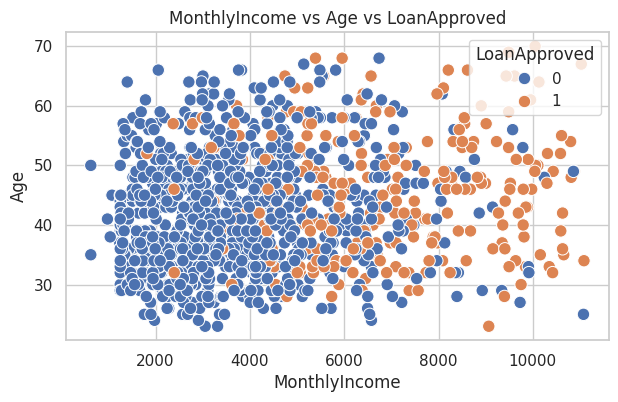

Mann–Whitney U on MonthlyIncome vs LoanApproved: Stat = 43247.0000, P-value = 0.0000 → ✅ Significant
Mann–Whitney U on Age vs LoanApproved: Stat = 142451.5000, P-value = 0.0000 → ✅ Significant


In [ ]:
# plot
plt.figure(figsize=(7, 4))
sns.scatterplot(x = data['MonthlyIncome'] , y = data['Age'] , hue = data['LoanApproved'] , data=data, s=80)
plt.title('MonthlyIncome vs Age vs LoanApproved')
plt.xlabel('MonthlyIncome')
plt.ylabel('Age')
plt.legend(title='LoanApproved')
plt.grid(True)
plt.show()

# descriptive
descriptive_stats_monthly = data.groupby('LoanApproved')['MonthlyIncome'].describe()
descriptive_stats_age = data.groupby('LoanApproved')['Age'].describe()

combined_stats = pd.concat(
    [descriptive_stats_monthly, descriptive_stats_age],
    keys=['MonthlyIncome', 'Age'],
    axis=1
)

styled_table = combined_stats.style \
    .set_caption("descriptive statistics for 2 continuous variables") \
    .background_gradient(cmap='Blues', subset=['MonthlyIncome', 'Age']) \
    .highlight_max(color='lightgreen', axis=1) \
    .highlight_min(color='pink', axis=1) \
    .format(precision=2, thousands=",")

styled_table

print(run_ttest(data, "MonthlyIncome", "LoanApproved"))
print(run_ttest(data, "Age", "LoanApproved"))

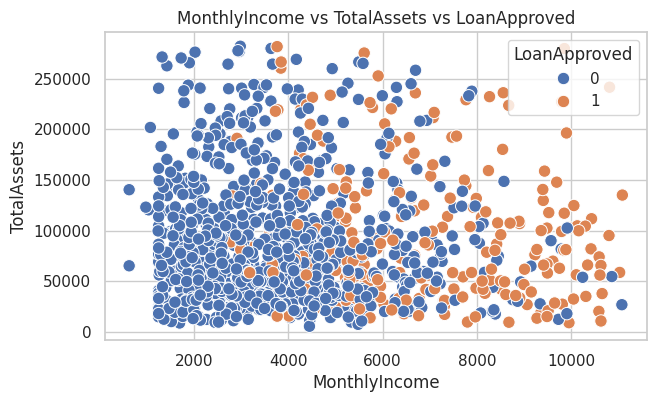

Mann–Whitney U on MonthlyIncome vs LoanApproved: Stat = 43247.0000, P-value = 0.0000 → ✅ Significant
Mann–Whitney U on TotalAssets vs LoanApproved: Stat = 132498.0000, P-value = 0.0253 → ✅ Significant


In [ ]:
# plot
plt.figure(figsize=(7, 4))
sns.scatterplot(x = data['MonthlyIncome'] , y = data['TotalAssets'] , hue = data['LoanApproved'] , data=data, s=80)
plt.title('MonthlyIncome vs TotalAssets vs LoanApproved')
plt.xlabel('MonthlyIncome')
plt.ylabel('TotalAssets')
plt.legend(title='LoanApproved')
plt.grid(True)
plt.show()

# descriptive
descriptive_stats_monthly = data.groupby('LoanApproved')['MonthlyIncome'].describe()
descriptive_stats_TotalAssets = data.groupby('LoanApproved')['TotalAssets'].describe()

combined_stats2 = pd.concat(
    [descriptive_stats_monthly, descriptive_stats_TotalAssets],
    keys=['MonthlyIncome', 'TotalAssets'],
    axis=1
)

styled_table2 = combined_stats2.style \
    .set_caption("descriptive statistics for 2 continuous variables") \
    .background_gradient(cmap='Blues', subset=['MonthlyIncome', 'TotalAssets']) \
    .highlight_max(color='lightgreen', axis=1) \
    .highlight_min(color='pink', axis=1) \
    .format(precision=2, thousands=",")

styled_table2

print(run_ttest(data, "MonthlyIncome", "LoanApproved"))
print(run_ttest(data, "TotalAssets", "LoanApproved"))

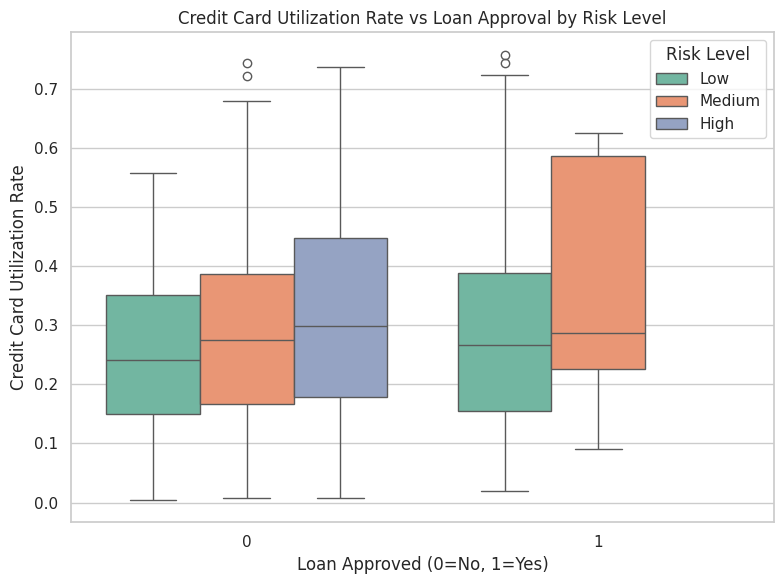

Mann–Whitney U on CreditCardUtilizationRate vs LoanApproved: Stat = 174934.0000, P-value = 0.3886 → ❌ Not Significant
Chi-square on RiskLevel vs LoanApproved: Stat = 790.9754, P-value = 0.0000 → ✅ Significant


In [ ]:
columns_needed = ["CreditCardUtilizationRate", "RiskScore", "LoanApproved"]
plot_df = data[columns_needed].dropna().copy()

plot_df['RiskLevel'] = pd.qcut(plot_df['RiskScore'], q=3, labels=['Low','Medium','High'])

plt.figure(figsize=(8, 6))
sns.boxplot(
    data=plot_df,
    x="LoanApproved",
    y="CreditCardUtilizationRate",
    hue="RiskLevel",
    palette="Set2"
)
plt.title("Credit Card Utilization Rate vs Loan Approval by Risk Level")
plt.xlabel("Loan Approved (0=No, 1=Yes)")
plt.ylabel("Credit Card Utilization Rate")
plt.legend(title="Risk Level")
plt.tight_layout()
plt.show()

print(run_ttest(plot_df, "CreditCardUtilizationRate", "LoanApproved"))
print(run_chi2(plot_df, "RiskLevel", "LoanApproved"))

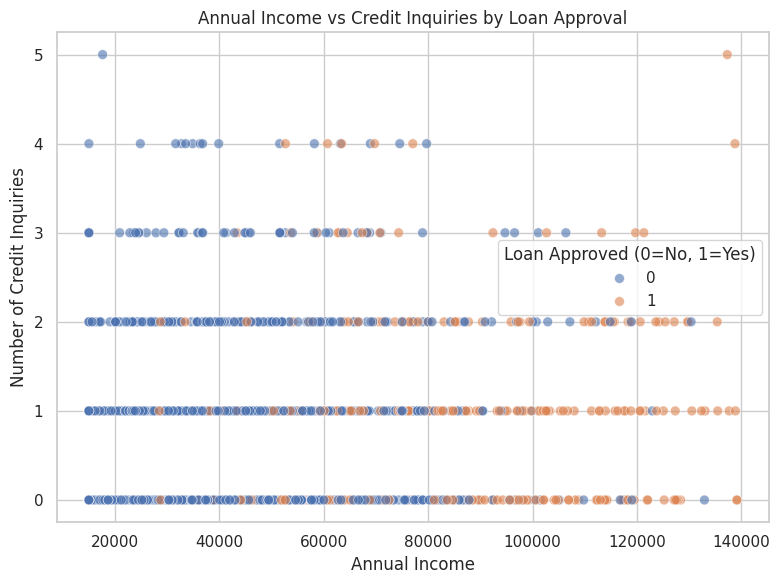

Mann–Whitney U on AnnualIncome vs LoanApproved: Stat = 40073.0000, P-value = 0.0000 → ✅ Significant
Mann–Whitney U on NumberOfCreditInquiries vs LoanApproved: Stat = 133831.5000, P-value = 0.4069 → ❌ Not Significant
Chi-square on NumberOfCreditInquiries vs LoanApproved: Stat = 1.8079, P-value = 0.8750 → ❌ Not Significant


In [ ]:
# Hypothesis: تعداد استعلام‌های اعتباری زیاد => حتی با درآمد بالا احتمال رد شدن وام بیشتر است
# Viz: Scatterplot (AnnualIncome vs NumberOfCreditInquiries) with LoanApproved color

columns_needed = ["AnnualIncome", "NumberOfCreditInquiries", "LoanApproved"]

plot_df = data[columns_needed].dropna()

plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=plot_df,
    x="AnnualIncome",
    y="NumberOfCreditInquiries",
    hue="LoanApproved",
    alpha=0.6,
    s=50
)
plt.title("Annual Income vs Credit Inquiries by Loan Approval")
plt.xlabel("Annual Income")
#plt.xscale("log")
plt.ylabel("Number of Credit Inquiries")
plt.legend(title="Loan Approved (0=No, 1=Yes)")
plt.tight_layout()
plt.show()

print(run_ttest(plot_df, "AnnualIncome", "LoanApproved"))
print(run_ttest(plot_df, "NumberOfCreditInquiries", "LoanApproved"))
print(run_chi2(plot_df, "NumberOfCreditInquiries", "LoanApproved"))

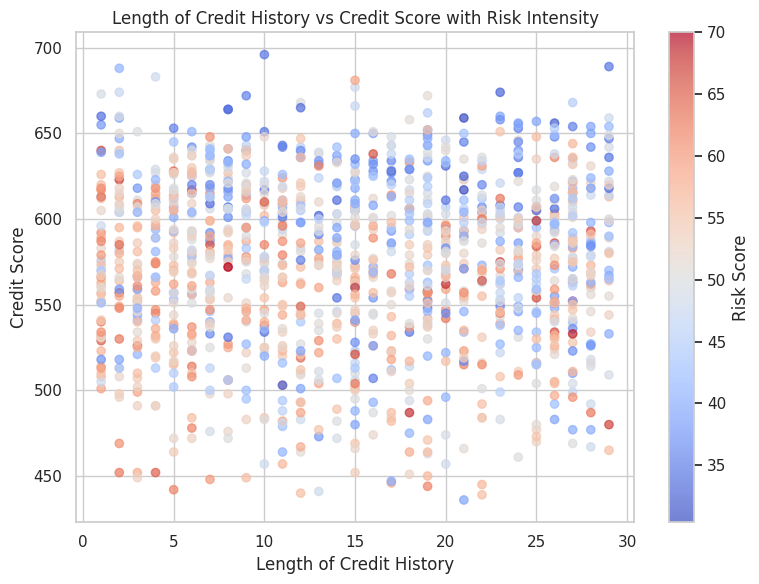

Mann–Whitney U on LengthOfCreditHistory vs LoanApproved: Stat = 149964.0000, P-value = 0.0002 → ✅ Significant
Mann–Whitney U on CreditScore vs LoanApproved: Stat = 134936.5000, P-value = 0.0000 → ✅ Significant
Chi-square on LengthOfCreditHistory vs LoanApproved: Stat = 35.6429, P-value = 0.1519 → ❌ Not Significant


In [ ]:
# Hypothesis: متقاضیانی که طول سابقه اعتباری کوتاه دارند ⇒ ریسک بیشتری برای وام دادن دارند
# Viz: Scatterplot (LengthOfCreditHistory vs CreditScore) with RiskScore intensity

columns_needed = ["LengthOfCreditHistory", "CreditScore", "RiskScore"]

plot_df = data[columns_needed].dropna()

plt.figure(figsize=(8, 6))
scatter = plt.scatter(
    plot_df["LengthOfCreditHistory"],
    plot_df["CreditScore"],
    c=plot_df["RiskScore"],       # شدت رنگ بر اساس RiskScore
    cmap="coolwarm",
    alpha=0.7
)
plt.colorbar(scatter, label="Risk Score")
plt.title("Length of Credit History vs Credit Score with Risk Intensity")
plt.xlabel("Length of Credit History")
plt.ylabel("Credit Score")
plt.tight_layout()
plt.show()

print(run_ttest(data, "LengthOfCreditHistory", "LoanApproved"))
print(run_ttest(data, "CreditScore", "LoanApproved"))
print(run_chi2(data, "LengthOfCreditHistory", "LoanApproved"))


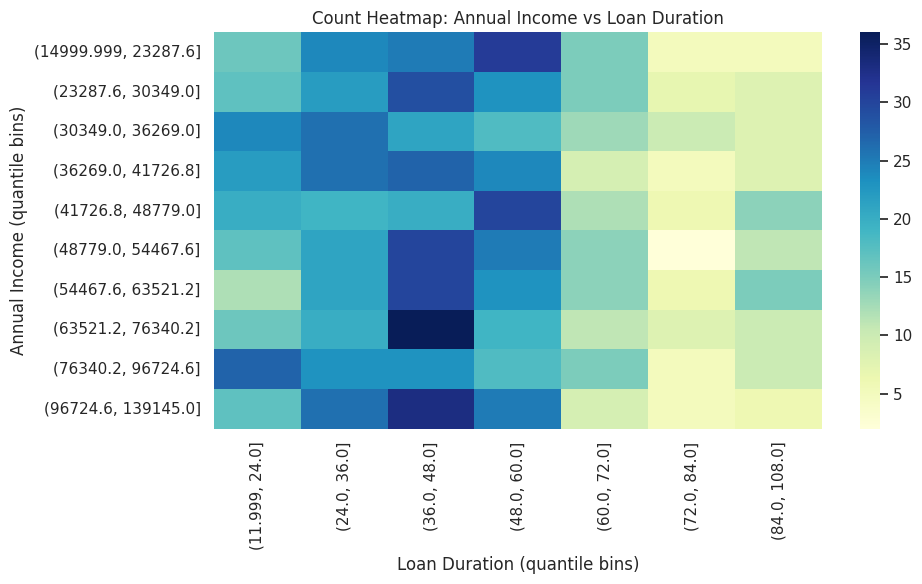

In [ ]:
# Hypothesis: درآمد بالاتر => وام‌های با طول مدت بالاتر
# Viz: Heatmap (AnnualIncome vs LoanDuration)
columns_needed = ["AnnualIncome", "LoanDuration"]
plot_df = data[columns_needed].apply(pd.to_numeric, errors="coerce").dropna()

income_bins   = pd.qcut(plot_df["AnnualIncome"], q=10, duplicates="drop")
duration_bins = pd.qcut(plot_df["LoanDuration"], q=10, duplicates="drop")

pivot_table = pd.crosstab(income_bins, duration_bins)

plt.figure(figsize=(10,6))
sns.heatmap(pivot_table, cmap="YlGnBu")
plt.title("Count Heatmap: Annual Income vs Loan Duration")
plt.xlabel("Loan Duration (quantile bins)")
plt.ylabel("Annual Income (quantile bins)")
plt.tight_layout()
plt.show()

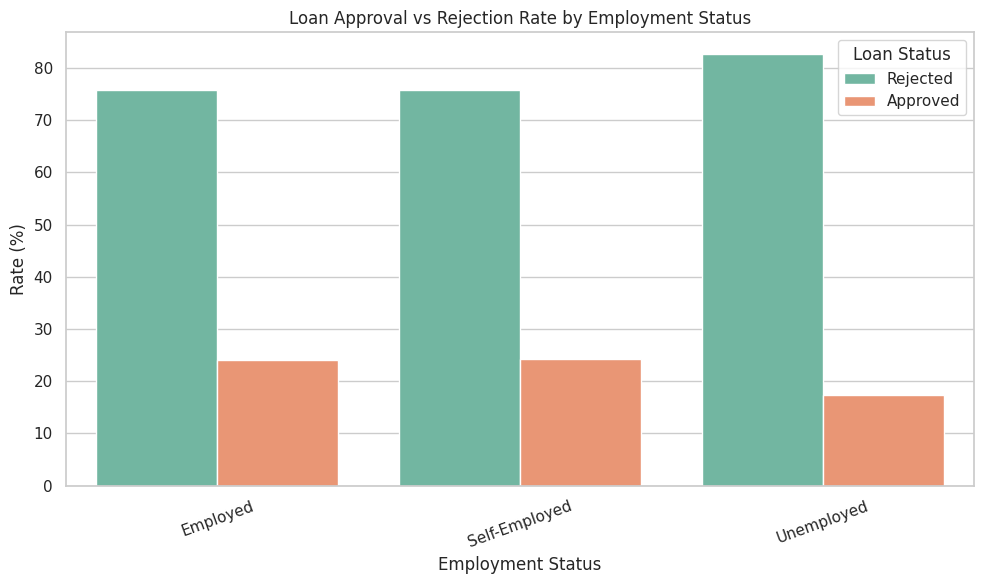

In [ ]:
# Hypothesis: تاثیر EmploymentStatus بر قبول شدن وام
# Viz: Barchart (EmploymentStatus vs Approval / Rejection Rate)

columns_needed = ["EmploymentStatus", "AnnualIncome", "LoanApproved"]
plot_df = data[columns_needed].dropna()

approval_rate = (
    plot_df.groupby("EmploymentStatus")["LoanApproved"]
    .value_counts(normalize=True)   # درصد هر کلاس در هر EmploymentStatus
    .mul(100)
    .rename("Rate (%)")
    .reset_index()
)

approval_rate["LoanApproved"] = approval_rate["LoanApproved"].map({0:"Rejected", 1:"Approved"})

plt.figure(figsize=(10,6))
sns.barplot(
    data=approval_rate,
    x="EmploymentStatus",
    y="Rate (%)",
    hue="LoanApproved",
    palette="Set2"
)
plt.title("Loan Approval vs Rejection Rate by Employment Status")
plt.ylabel("Rate (%)")
plt.xlabel("Employment Status")
plt.xticks(rotation=20)
plt.legend(title="Loan Status")
plt.tight_layout()
plt.show()



/tmp/ipython-input-238694163.py:23: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[0].legend(title="Loan Approved (0=No, 1=Yes)")
/tmp/ipython-input-238694163.py:36: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[1].legend(title="Loan Approved (0=No, 1=Yes)")


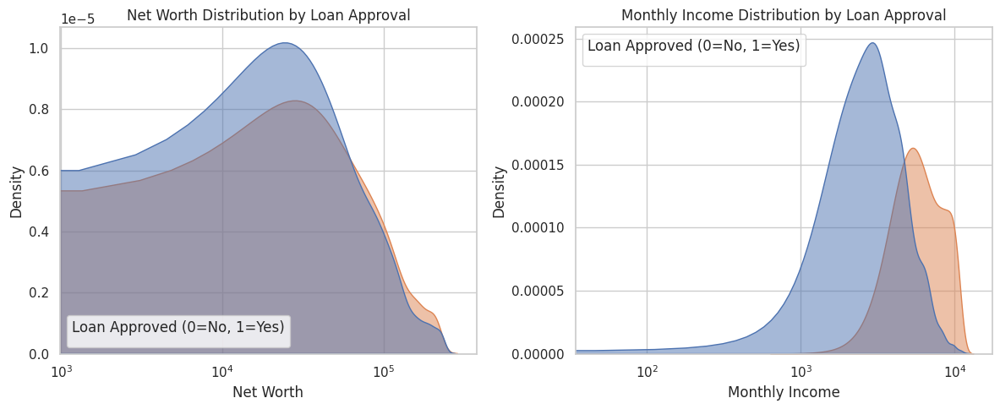

In [ ]:
# Hypothesis: NetWorth پایین‌تر ⇒ نرخ قبولی پایین‌تر حتی با درآمد بالا
# Viz: Dual Density Plots (NetWorth & MonthlyIncome by LoanApproved)

columns_needed = ["NetWorth", "MonthlyIncome", "LoanApproved"]
plot_df = data[columns_needed].apply(pd.to_numeric, errors="coerce").dropna()

import matplotlib.pyplot as plt
import seaborn as sns

fig, axes = plt.subplots(1, 2, figsize=(12, 5))

# 1) NetWorth
sns.kdeplot(
    data=plot_df,
    x="NetWorth",
    hue="LoanApproved",
    fill=True, common_norm=False, alpha=0.5,
    ax=axes[0]
)
axes[0].set_title("Net Worth Distribution by Loan Approval")
axes[0].set_xlabel("Net Worth")
axes[0].set_ylabel("Density")
axes[0].legend(title="Loan Approved (0=No, 1=Yes)")

# 2) MonthlyIncome
sns.kdeplot(
    data=plot_df,
    x="MonthlyIncome",
    hue="LoanApproved",
    fill=True, common_norm=False, alpha=0.5,
    ax=axes[1]
)
axes[1].set_title("Monthly Income Distribution by Loan Approval")
axes[1].set_xlabel("Monthly Income")
axes[1].set_ylabel("Density")
axes[1].legend(title="Loan Approved (0=No, 1=Yes)")
axes[0].set_xscale("log")
axes[1].set_xscale("log")


plt.tight_layout()
plt.show()


/tmp/ipython-input-359189312.py:14: FutureWarning: The default value of observed=False is deprecated and will change to observed=True in a future version of pandas. Specify observed=False to silence this warning and retain the current behavior
  pivot_table = plot_df.pivot_table(


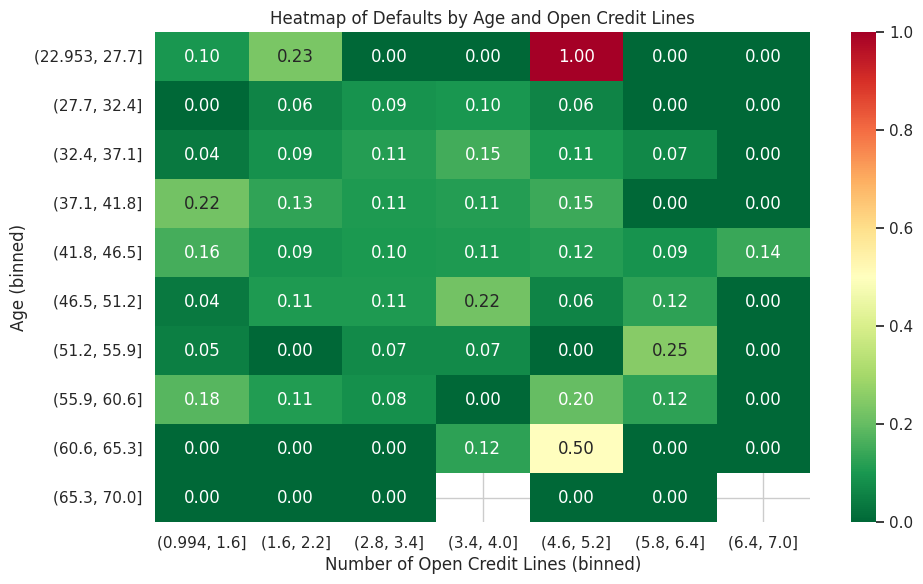

In [ ]:
# Hypothesis:
# 1) سن کمتر ⇒ دیرکرد کمتر
# 2) تعداد حساب‌های بیشتر ⇒ دیرکرد کمتر
# Viz: Heatmap (Age vs NumberOfOpenCreditLines with PreviousLoanDefaults)

columns_needed = ["Age", "NumberOfOpenCreditLines", "PreviousLoanDefaults"]
plot_df = data[columns_needed].apply(pd.to_numeric, errors="coerce").dropna()


age_bins = pd.cut(plot_df["Age"], bins=10)   # 10 بازه سنی
line_bins = pd.cut(plot_df["NumberOfOpenCreditLines"], bins=10)  # 10 بازه برای حساب‌ها

# جدول محوری: میانگین دیرکرد (PreviousLoanDefaults) در هر سلول
pivot_table = plot_df.pivot_table(
    index=age_bins,
    columns=line_bins,
    values="PreviousLoanDefaults",
    aggfunc="mean"
)

plt.figure(figsize=(10, 6))
sns.heatmap(pivot_table, cmap="RdYlGn_r", annot=True, fmt=".2f")
plt.title("Heatmap of Defaults by Age and Open Credit Lines")
plt.xlabel("Number of Open Credit Lines (binned)")
plt.ylabel("Age (binned)")
plt.tight_layout()
plt.show()

# KPI

**Key Performance Indicators (KPIs)** :
KPIs, or Key Performance Indicators, are measurable values that demonstrate how effectively a company is achieving its key business objectives. They help you monitor performance and make better decisions.

**1. Loan-to-Income (LTI) Ratio**

> This ratio measures the loan size relative to the borrower’s income, serving as an affordability indicator.
```
LoanAmount / AnnualIncome
```




=== Analysis for LoanToIncome ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1178.000000,0.563520,0.435720,0.064513,0.271567,0.435452,0.720215,3.084667,2.049596,5.745044,141,66,0.000000,Not Normal (p <= 0.05)


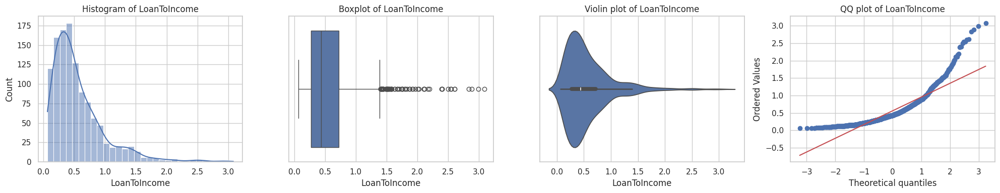

In [ ]:
data_copy = data.copy()
data_copy["LoanToIncome"] = data_copy['LoanAmount']/data_copy['AnnualIncome']
analyze_numeric(data_copy,"LoanToIncome")

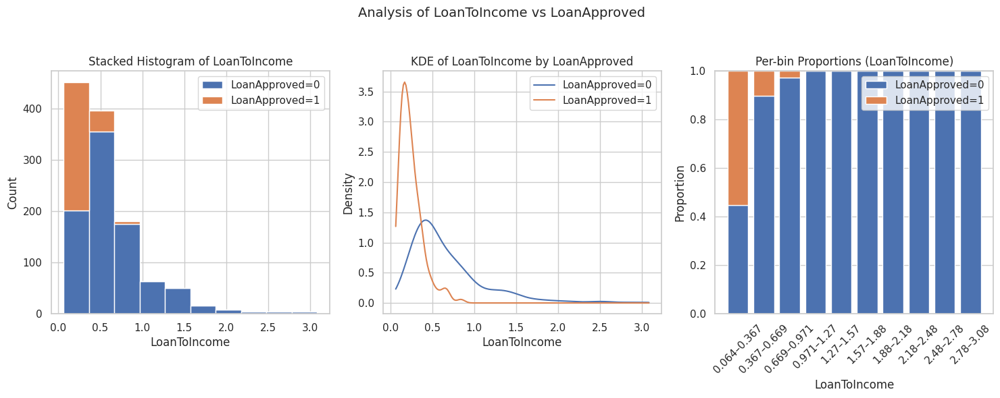

Group sizes — LoanApproved=0: 885, LoanApproved=1: 293
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 4.041603342448801e-86
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data_copy, cont_col="LoanToIncome", target_col="LoanApproved",alpha=0.05)

**2. Net Worth-to-Loan Ratio**
> This ratio measures how well a borrower’s net worth covers the requested loan.
```
NetWorth / LoanAmount
```

=== Analysis for NetWorthToLoan ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1153.000000,3.532436,3.787719,0.022557,1.007341,2.347410,4.844620,35.673988,2.609064,11.299567,166,65,0.000000,Not Normal (p <= 0.05)


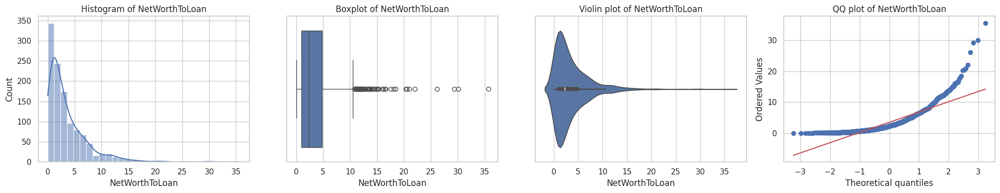

In [ ]:
data_copy["NetWorthToLoan"] = data_copy['NetWorth']/data_copy['LoanAmount']
analyze_numeric(data_copy,"NetWorthToLoan")

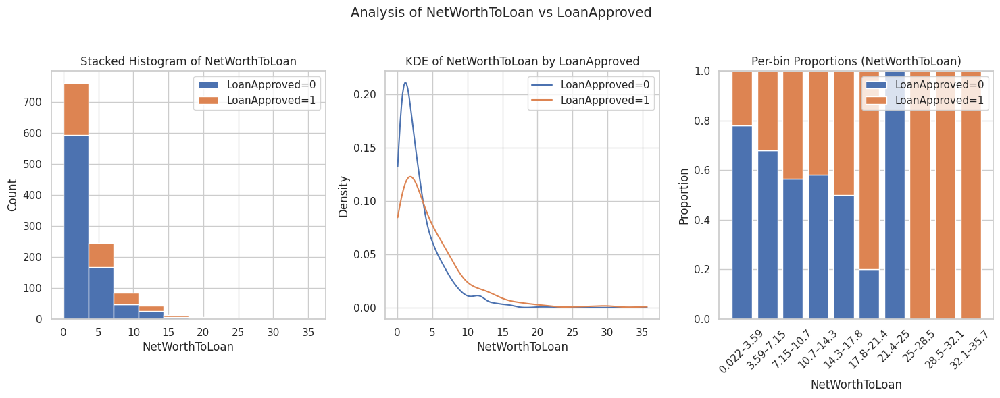

Group sizes — LoanApproved=0: 839, LoanApproved=1: 314
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 4.1323039135407714e-08
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data_copy, cont_col="NetWorthToLoan", target_col="LoanApproved",alpha=0.05)

**3. Interest Rate Spread (IRS)**
> Reflects risk premium charged to the borrower.
```
InterestRate − BaseInterestRate
```

=== Analysis for IRS ===


,count,mean,std,min,25%,50%,75%,max,skewness,kurtosis,missing,outliers,Shapiro-Wilk p-value,Normality Result
0,1293.000000,-0.000241,0.022691,-0.064104,-0.016204,-0.000526,0.015198,0.058087,0.032220,-0.385685,26,1,0.006880,Not Normal (p <= 0.05)


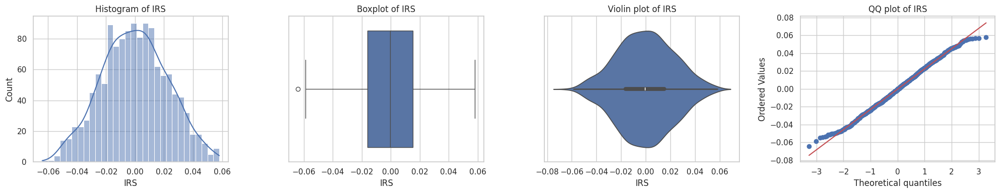

In [ ]:
data_copy["IRS"] = data_copy['InterestRate']-data_copy['BaseInterestRate']
analyze_numeric(data_copy,"IRS")

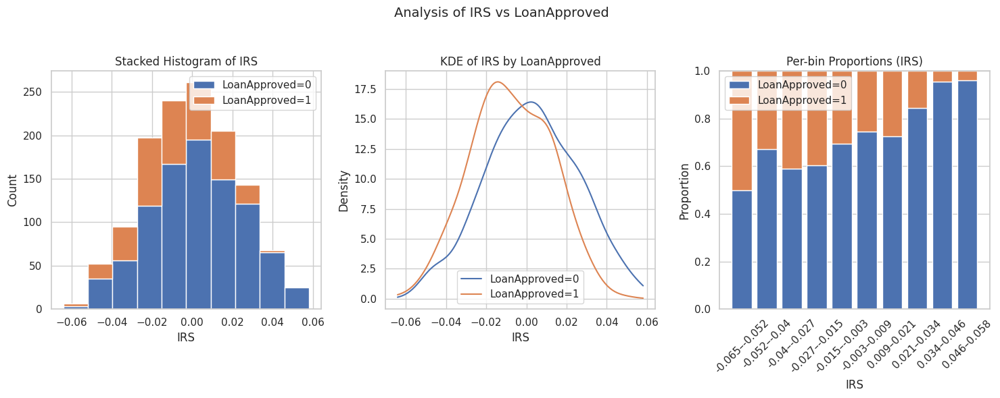

Group sizes — LoanApproved=0: 935, LoanApproved=1: 358
Shapiro–Wilk for LoanApproved=0: p = 0.0068 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.3899 → Normal
Test used: Mann–Whitney U
p-value: 1.4882292404724909e-12
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data_copy, cont_col="IRS", target_col="LoanApproved",alpha=0.05,)

**4. Employment Stability**
> Combination of EmploymentStatus and Experience (years of experience) to create a unified measure of employment stability.
```
currently employed & >2 years Experience
```

=== Analysis for StableEmployment ===


,Unique Categories,Most Frequent,Frequency,Missing
0,2,True,1225,0


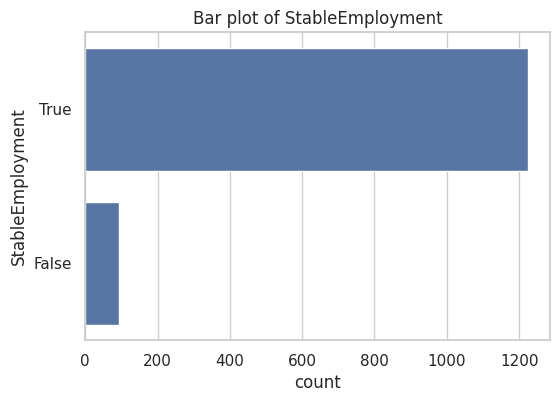

In [ ]:
currently_employed = {'Employed', 'Self-Employed'}
data_copy['StableEmployment'] = ((data_copy['EmploymentStatus'].isin(currently_employed)) & (data_copy['Experience'] >= 2))
analyze_categorical(data_copy,"StableEmployment")

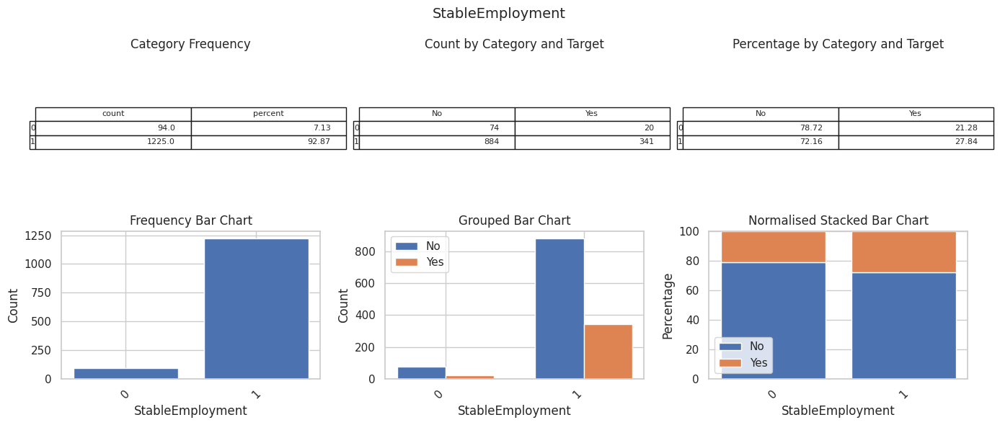

p-value = 0.2095699034627327
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_cat_vs_binary(data_copy, feature_col="StableEmployment", target_col="LoanApproved",alpha=0.05)

**5. Loan Approval Rate** : (Number of Approved Loans / Total Loan Applications) × 100

In [ ]:
approved_loans = data['LoanApproved'].sum()
approval_rate = (approved_loans / len(data)) * 100
print(approval_rate)
# The rate is very low, policies might be too strict.

27.369219105382864


**6. Loan Default Rate** : (Number of Defaulted Loans / Total Approved Loans) × 100


In [ ]:
approved_loans = data[data['LoanApproved'] == 1]
total_approved = len(approved_loans)

defaulted_approved_loans = approved_loans['PreviousLoanDefaults'].sum()
default_rate = (defaulted_approved_loans / total_approved) * 100
print(default_rate)

#A high default rate indicates high lending risk.
#A bank's goal is to optimize the approval rate while keeping the default rate as low as possible.

4.986149584487535


# <span style="color: purple">Hypothesis</span>

#####**Analyze a Categorical variable against target**

- Approval rates differ across employment statuses.

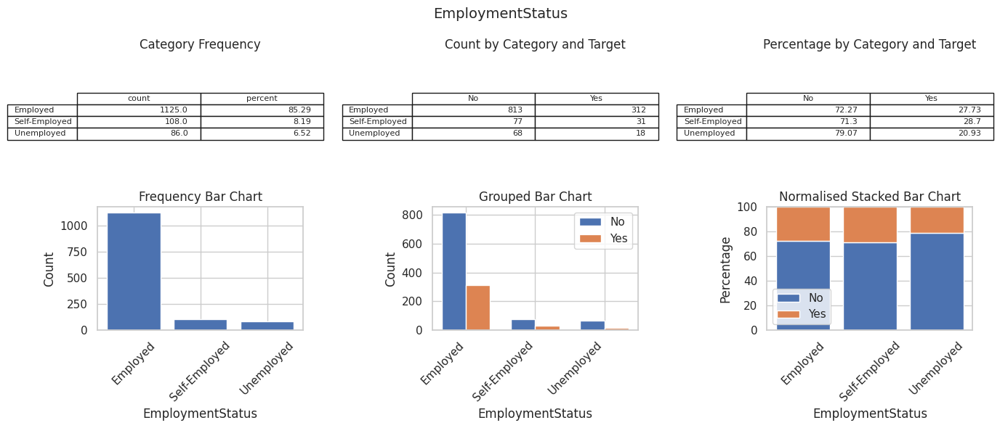

p-value = 0.37428270663051333
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_cat_vs_binary(data, feature_col="EmploymentStatus", target_col="LoanApproved",alpha=0.05)

LoanApproved is **not** significantly associated with EmploymentStatus ( p≈0.374 > 0.05). Approval rates are ~27–29% for employed/self-employed vs ~21% for unemployed—differences aren’t statistically significant.

- Approval rates differ across education levels.

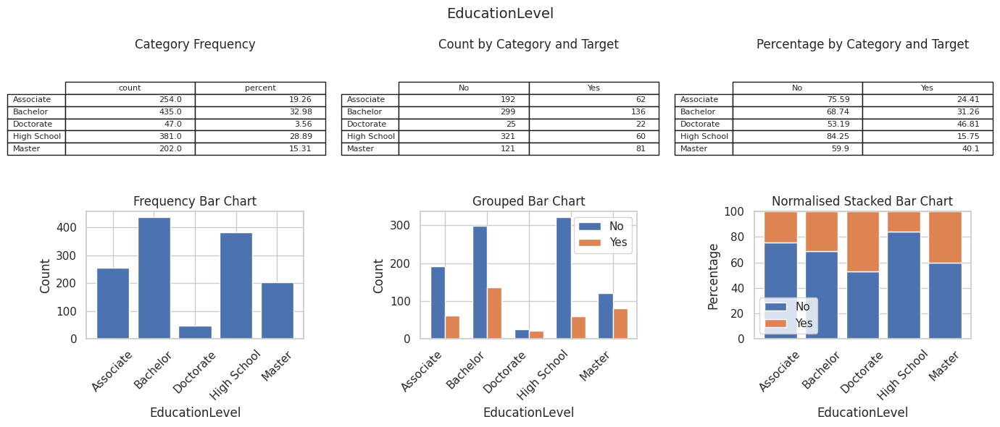

p-value = 2.2891378956958864e-11
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_cat_vs_binary(data, feature_col="EducationLevel", target_col="LoanApproved",alpha=0.05)

Loan approval rates **differ** significantly by education level

---



- Approval rates differ across marital-status groups.

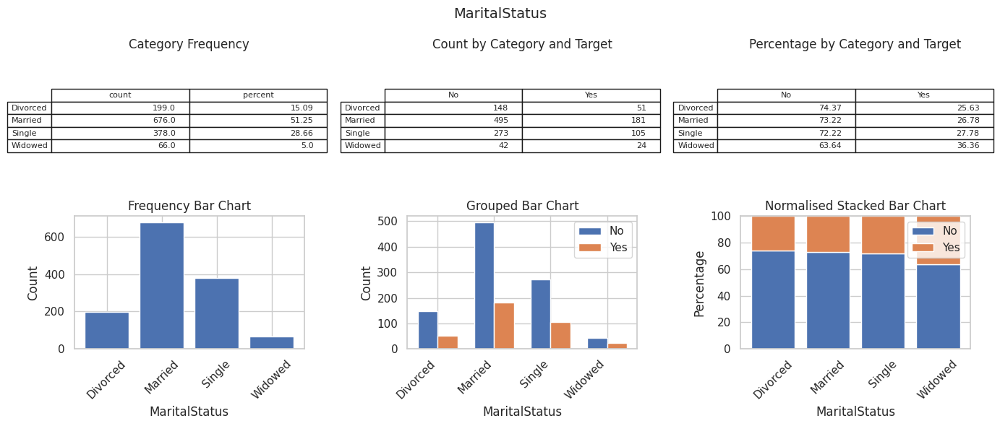

p-value = 0.37035924369519274
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_cat_vs_binary(data, feature_col="MaritalStatus", target_col="LoanApproved",alpha=0.05)

- Approval rates differ across home-ownership types.

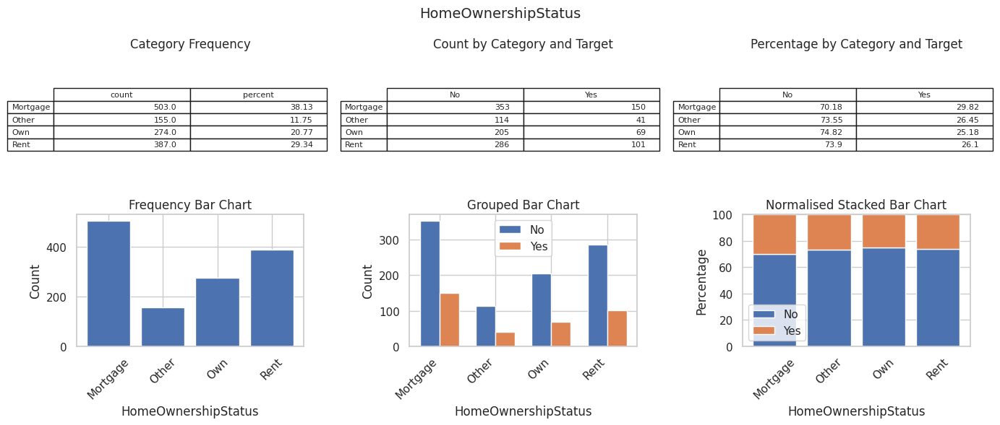

p-value = 0.46446743702253934
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_cat_vs_binary(data, feature_col="HomeOwnershipStatus", target_col="LoanApproved",alpha=0.05)

- Approval rates differ across loan purposes.

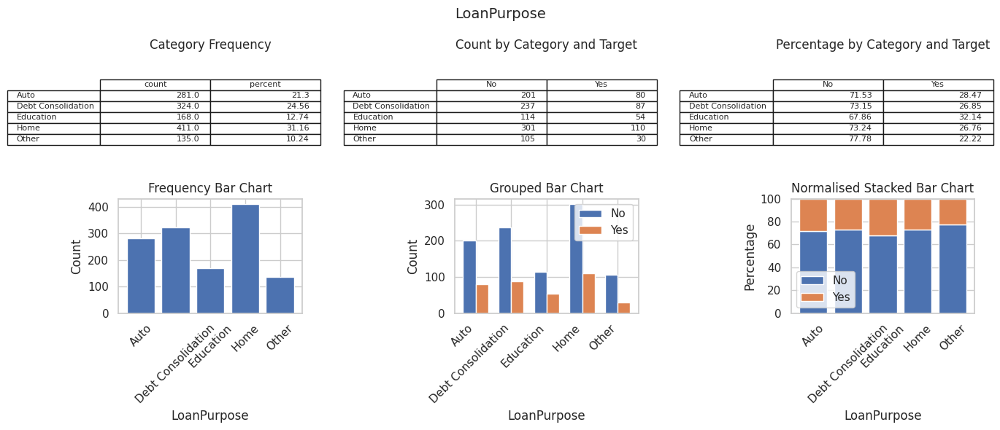

p-value = 0.40390583944913755
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_cat_vs_binary(data, feature_col="LoanPurpose", target_col="LoanApproved",alpha=0.05)

- Approval rates differ across prior-default status.

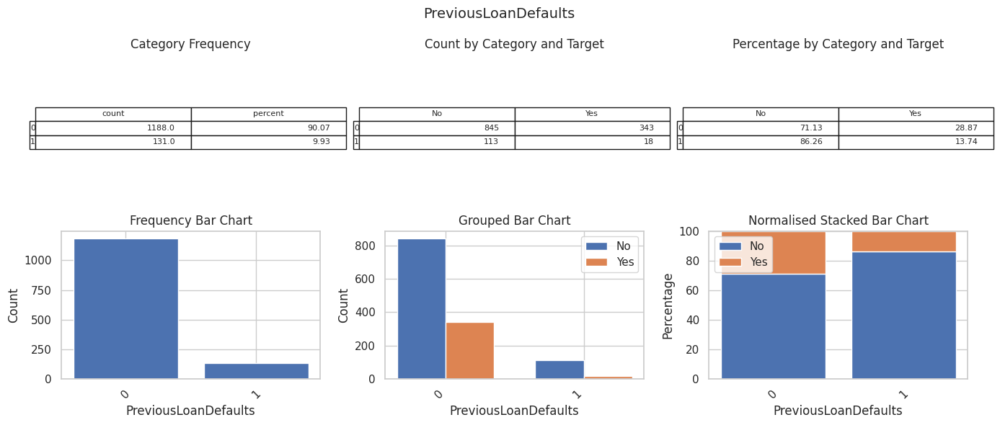

p-value = 0.00033933084317204395
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_cat_vs_binary(data, feature_col="PreviousLoanDefaults", target_col="LoanApproved",alpha=0.05)

- Approval rates differ across bankruptcy-history status.

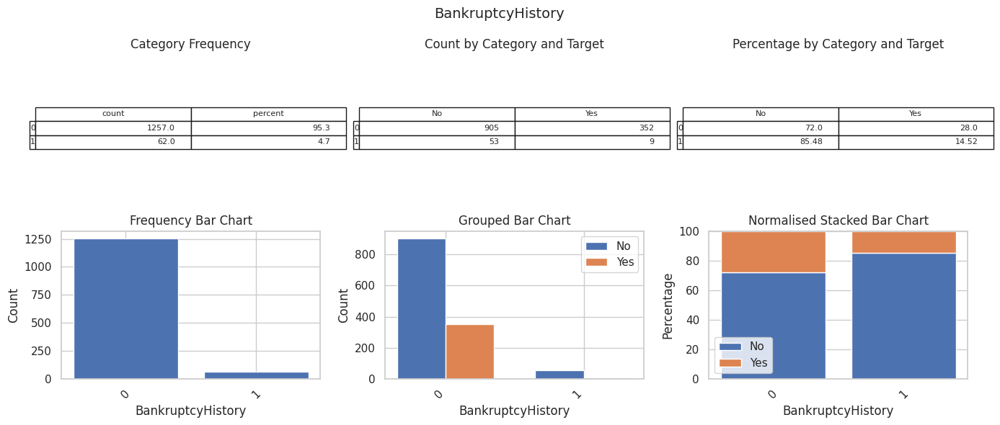

p-value = 0.02930644575830516
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_cat_vs_binary(data, feature_col="BankruptcyHistory", target_col="LoanApproved",alpha=0.05)

#####**Analyze a continuous variable against target**

- The distribution of credit scores differs between approved and rejected applicants.

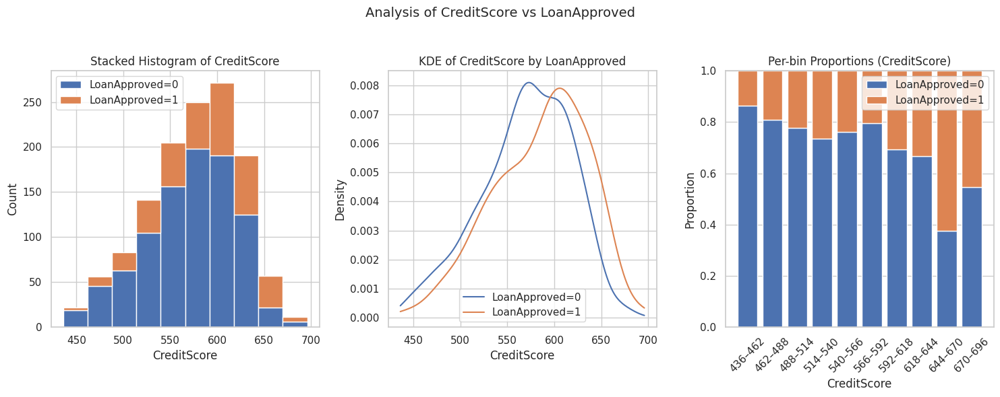

Group sizes — LoanApproved=0: 931, LoanApproved=1: 356
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 2.4574500544549923e-07
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="CreditScore", target_col="LoanApproved",alpha=0.05)

- The distribution of DTI differs between approved and rejected applicants..

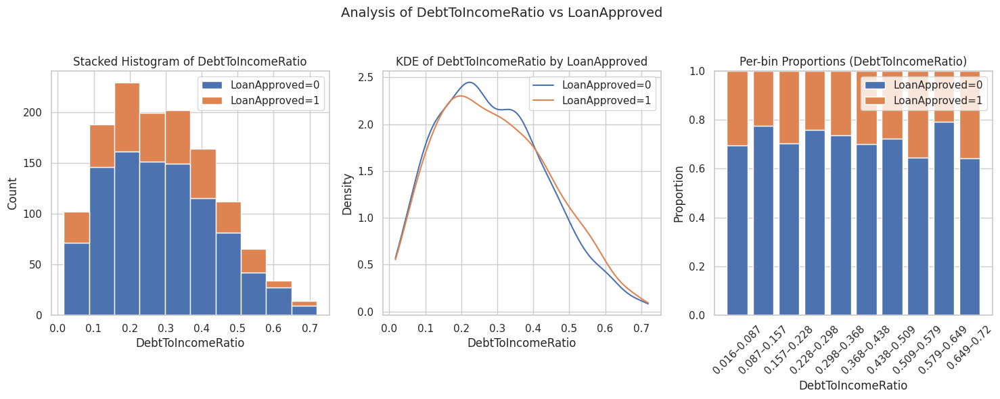

Group sizes — LoanApproved=0: 952, LoanApproved=1: 357
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.38293635975369256
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="DebtToIncomeRatio", target_col="LoanApproved",alpha=0.05)

- The distribution of monthly income differs between approved and rejected applicants.

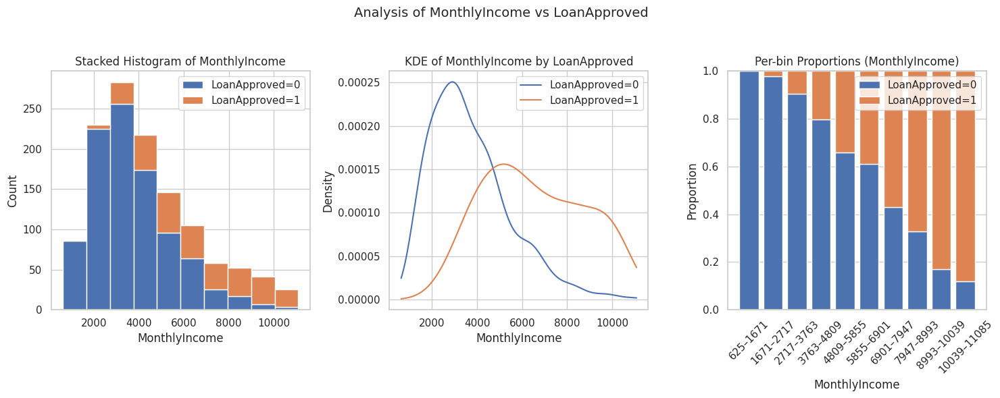

Group sizes — LoanApproved=0: 953, LoanApproved=1: 291
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 8.760121857608976e-71
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="MonthlyIncome", target_col="LoanApproved",alpha=0.05)

- The distribution of credit-history length differs between approved and rejected applicants.

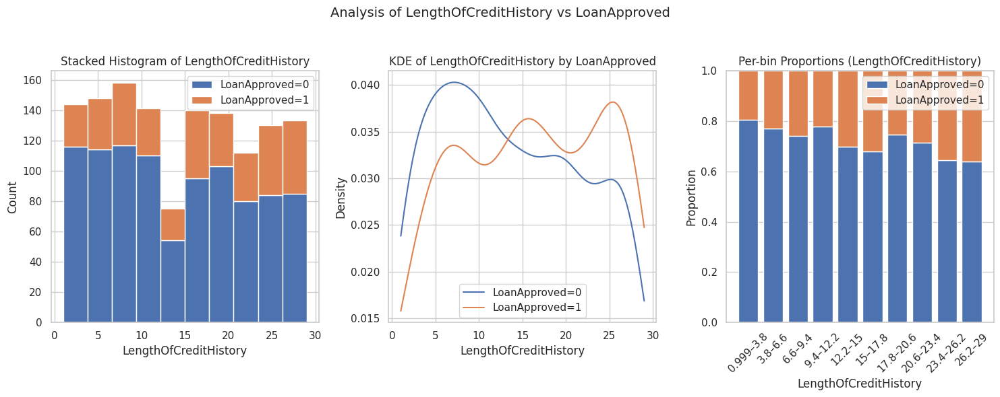

Group sizes — LoanApproved=0: 958, LoanApproved=1: 361
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.0001959960598965325
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="LengthOfCreditHistory", target_col="LoanApproved",alpha=0.05)

- The distribution of savings balances differs between approved and rejected applicants.

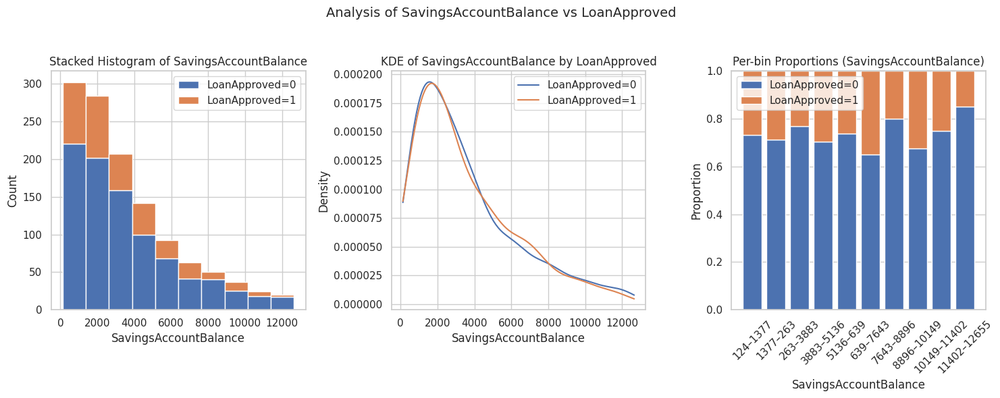

Group sizes — LoanApproved=0: 891, LoanApproved=1: 330
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.9636319983647946
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="SavingsAccountBalance", target_col="LoanApproved",alpha=0.05)

- The distribution of age differs between approved and rejected applicants.

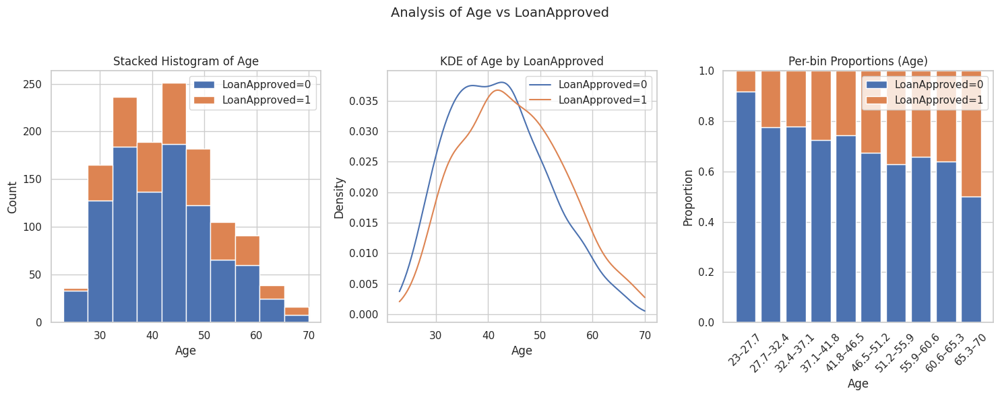

Group sizes — LoanApproved=0: 951, LoanApproved=1: 359
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0005 → Non-normal
Test used: Mann–Whitney U
p-value: 3.6858438620210814e-06
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="Age", target_col="LoanApproved",alpha=0.05)

- The distribution of loan amounts differs between approved and rejected applicants.

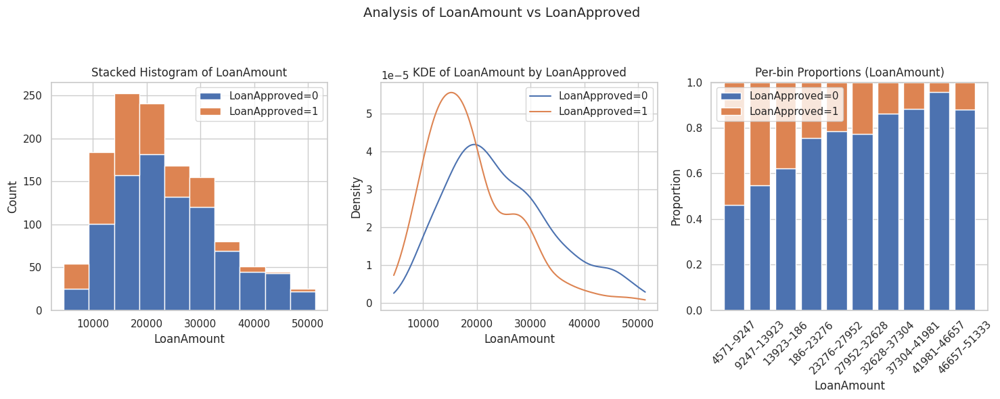

Group sizes — LoanApproved=0: 896, LoanApproved=1: 360
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 1.0898831120579062e-21
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="LoanAmount", target_col="LoanApproved",alpha=0.05)

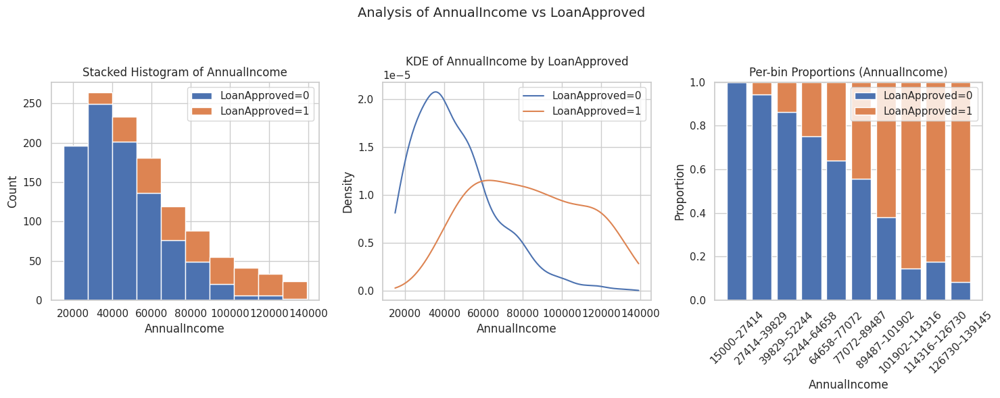

Group sizes — LoanApproved=0: 942, LoanApproved=1: 293
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 2.4160848719841457e-75
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="AnnualIncome", target_col="LoanApproved",alpha=0.05)

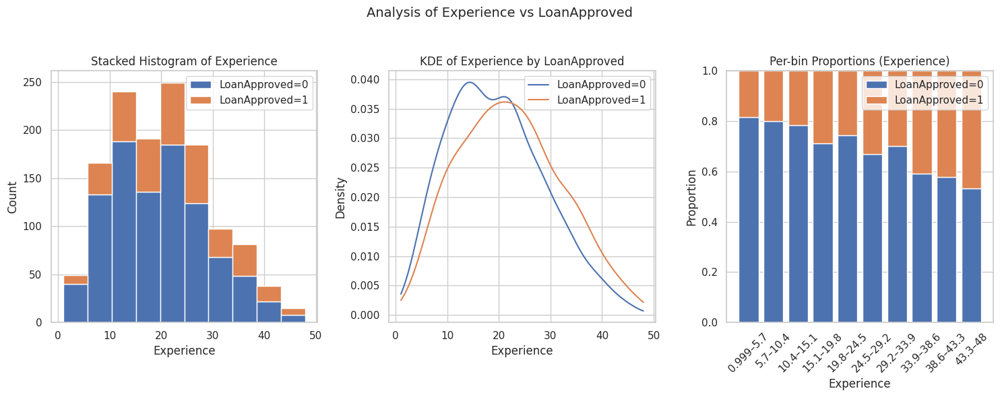

Group sizes — LoanApproved=0: 952, LoanApproved=1: 359
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0002 → Non-normal
Test used: Mann–Whitney U
p-value: 8.12375531280492e-06
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="Experience", target_col="LoanApproved",alpha=0.05)

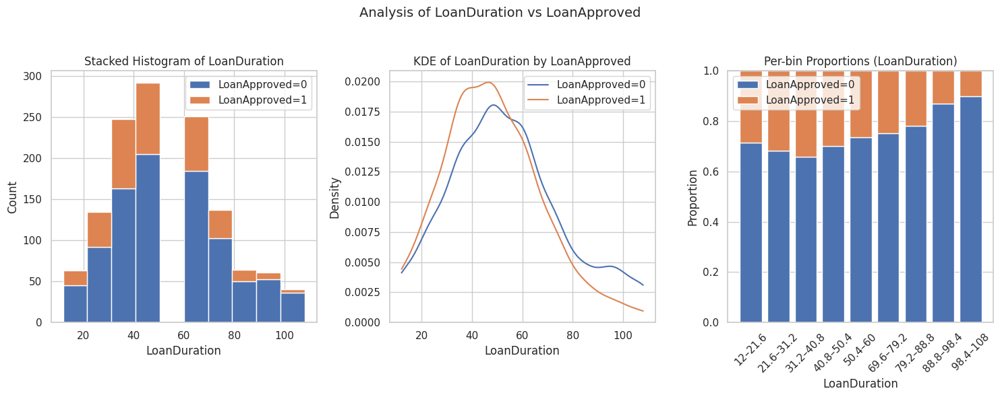

Group sizes — LoanApproved=0: 932, LoanApproved=1: 359
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.00012636261357742003
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="LoanDuration", target_col="LoanApproved",alpha=0.05)

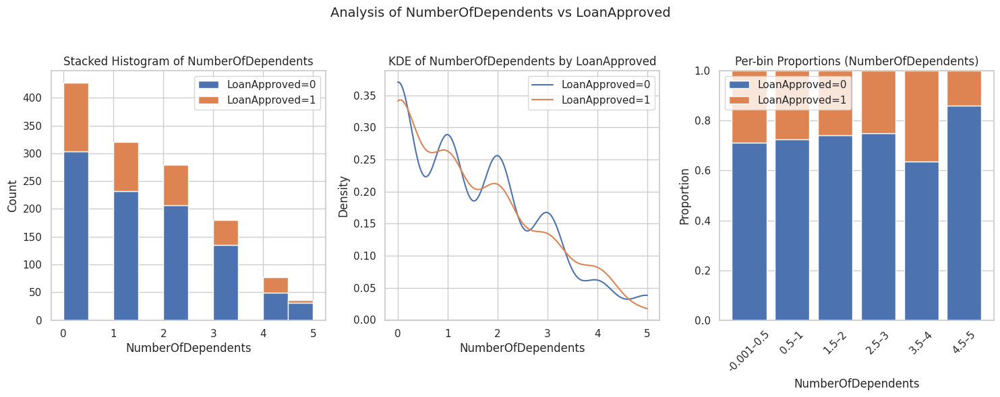

Group sizes — LoanApproved=0: 958, LoanApproved=1: 361
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.42558867780742937
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="NumberOfDependents", target_col="LoanApproved",alpha=0.05)

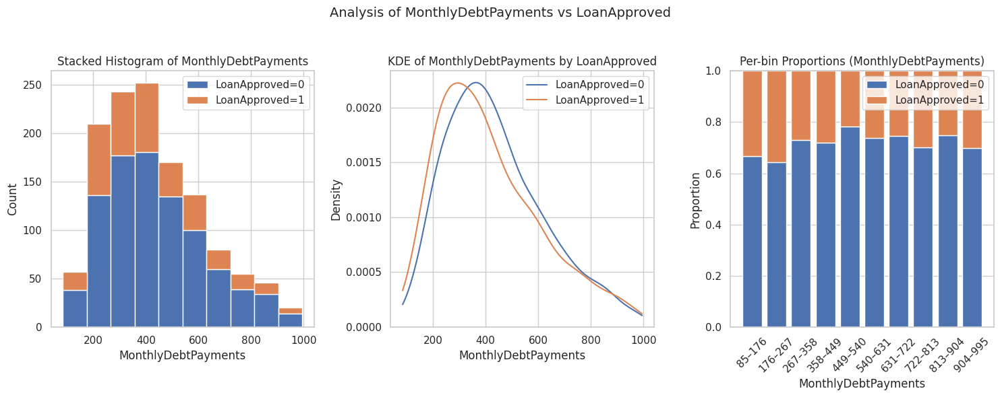

Group sizes — LoanApproved=0: 914, LoanApproved=1: 356
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.015544012589637116
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="MonthlyDebtPayments", target_col="LoanApproved",alpha=0.05)

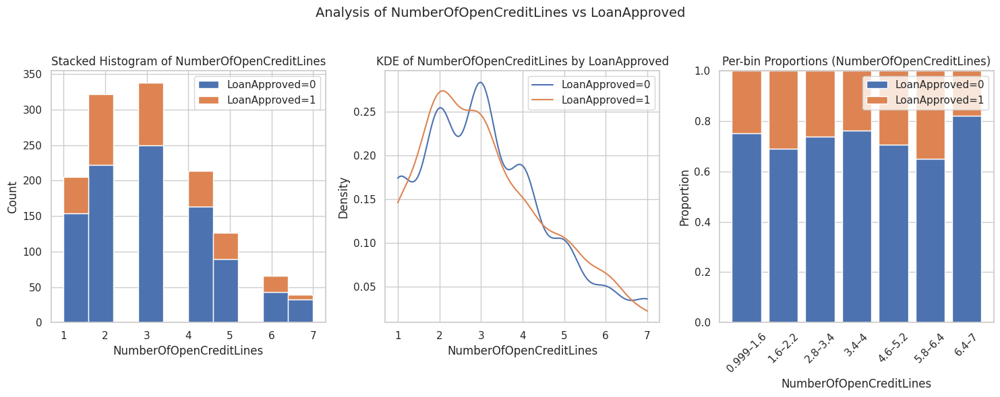

Group sizes — LoanApproved=0: 953, LoanApproved=1: 357
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.8112641718114451
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="NumberOfOpenCreditLines", target_col="LoanApproved",alpha=0.05)

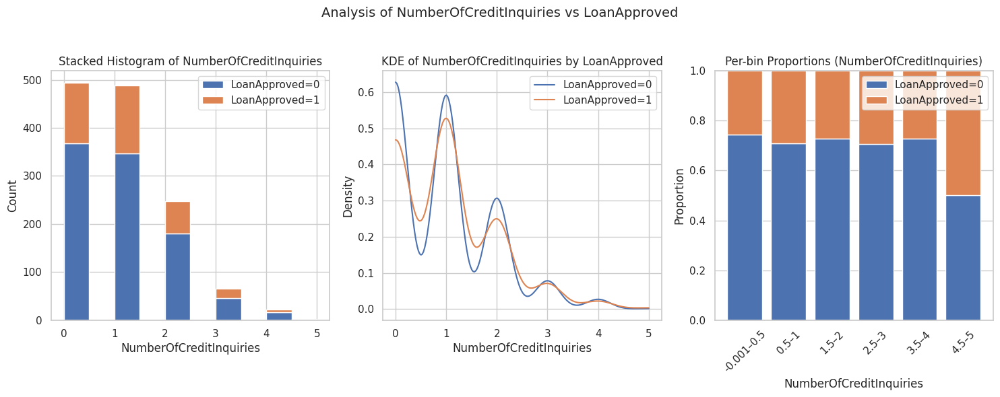

Group sizes — LoanApproved=0: 958, LoanApproved=1: 361
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.3727406518778791
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="NumberOfCreditInquiries", target_col="LoanApproved",alpha=0.05)

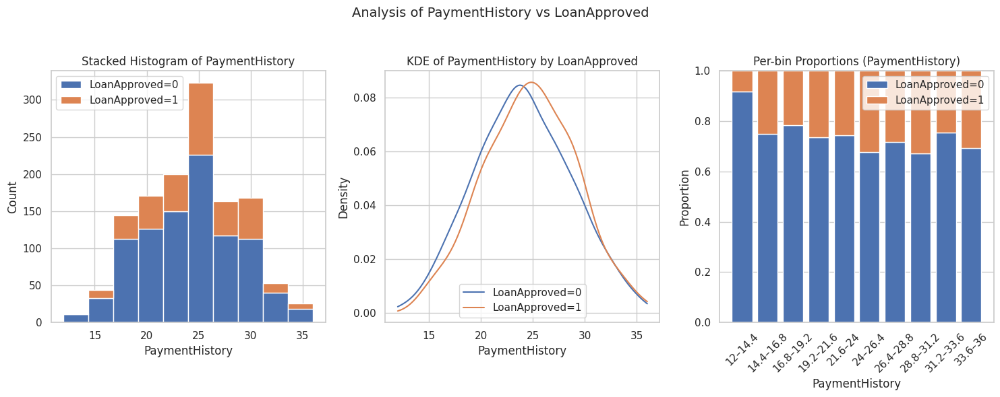

Group sizes — LoanApproved=0: 947, LoanApproved=1: 357
Shapiro–Wilk for LoanApproved=0: p = 0.0001 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0391 → Non-normal
Test used: Mann–Whitney U
p-value: 0.016888662797530176
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="PaymentHistory", target_col="LoanApproved",alpha=0.05)

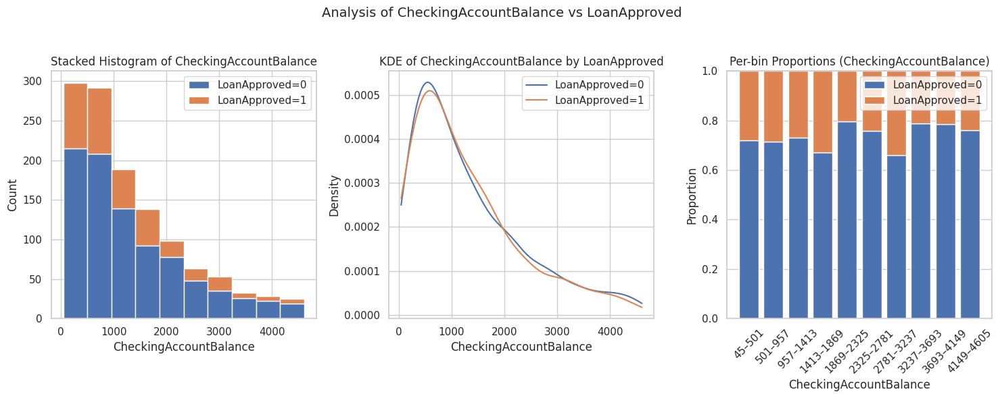

Group sizes — LoanApproved=0: 882, LoanApproved=1: 335
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.568059492955584
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="CheckingAccountBalance", target_col="LoanApproved",alpha=0.05)

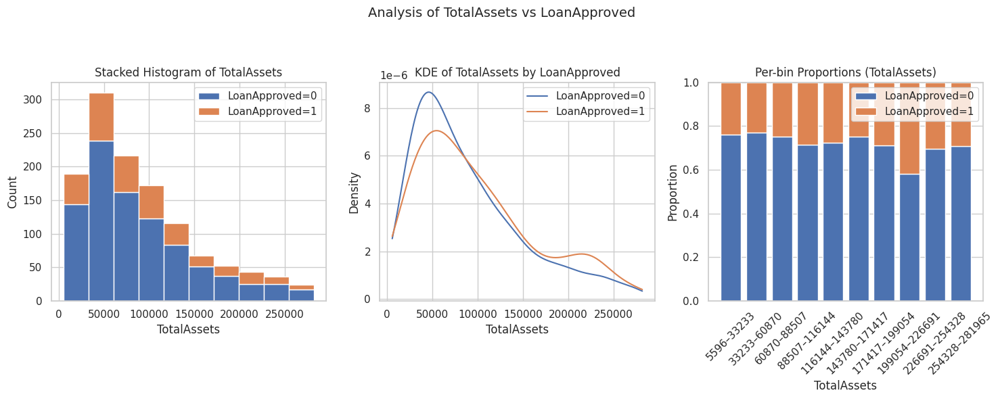

Group sizes — LoanApproved=0: 907, LoanApproved=1: 319
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.025278739988368052
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="TotalAssets", target_col="LoanApproved",alpha=0.05)

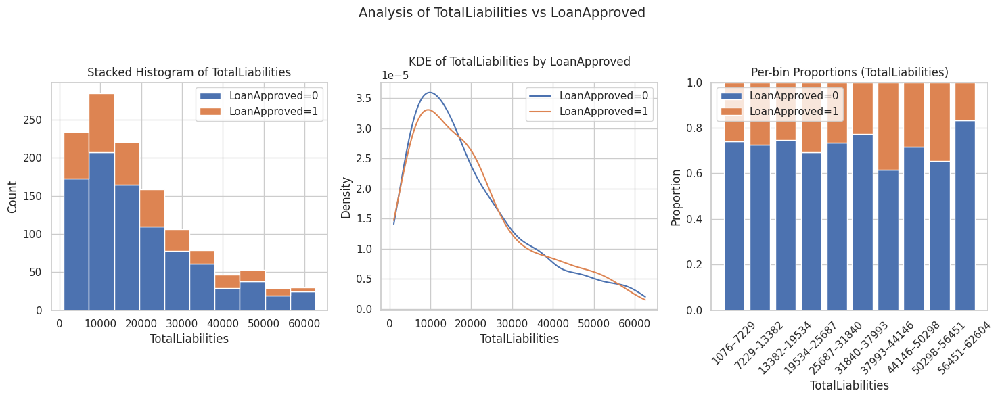

Group sizes — LoanApproved=0: 905, LoanApproved=1: 338
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.7047183136820523
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="TotalLiabilities", target_col="LoanApproved",alpha=0.05)

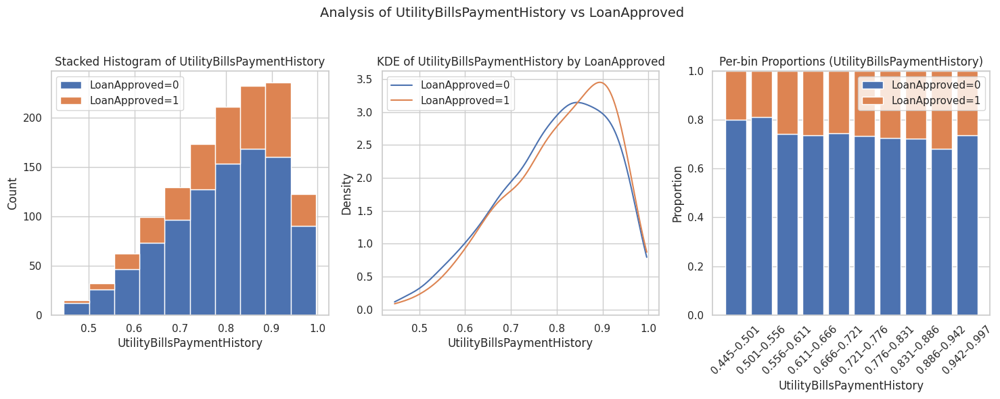

Group sizes — LoanApproved=0: 951, LoanApproved=1: 359
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.12720234040075426
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="UtilityBillsPaymentHistory", target_col="LoanApproved",alpha=0.05)

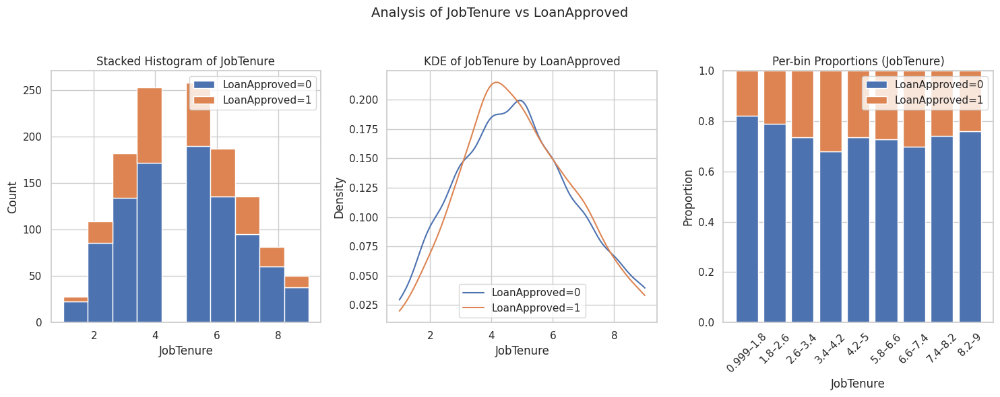

Group sizes — LoanApproved=0: 934, LoanApproved=1: 350
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.5245912107665335
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="JobTenure", target_col="LoanApproved",alpha=0.05)

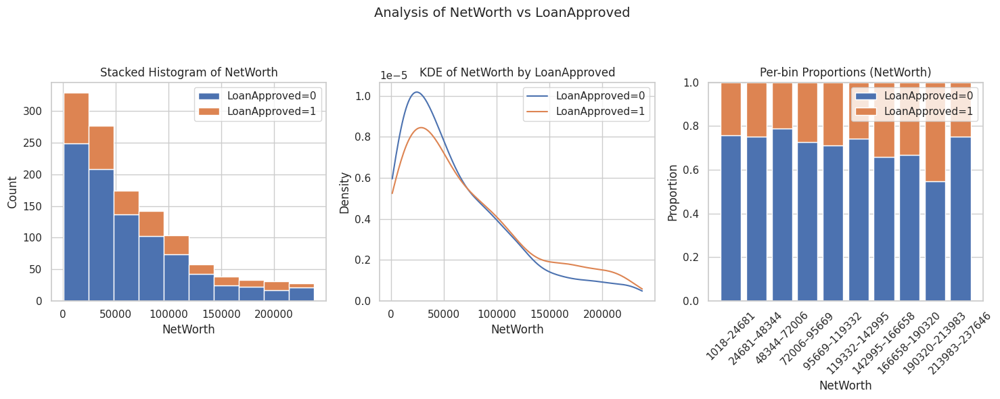

Group sizes — LoanApproved=0: 899, LoanApproved=1: 315
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 0.05691723499841047
  → H0 not rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="NetWorth", target_col="LoanApproved",alpha=0.05)

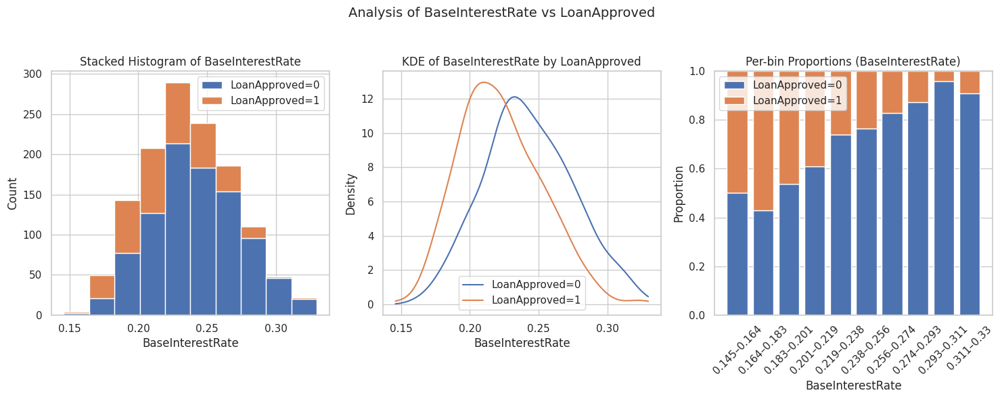

Group sizes — LoanApproved=0: 940, LoanApproved=1: 358
Shapiro–Wilk for LoanApproved=0: p = 0.0021 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0008 → Non-normal
Test used: Mann–Whitney U
p-value: 2.1173071178201207e-23
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="BaseInterestRate", target_col="LoanApproved",alpha=0.05)

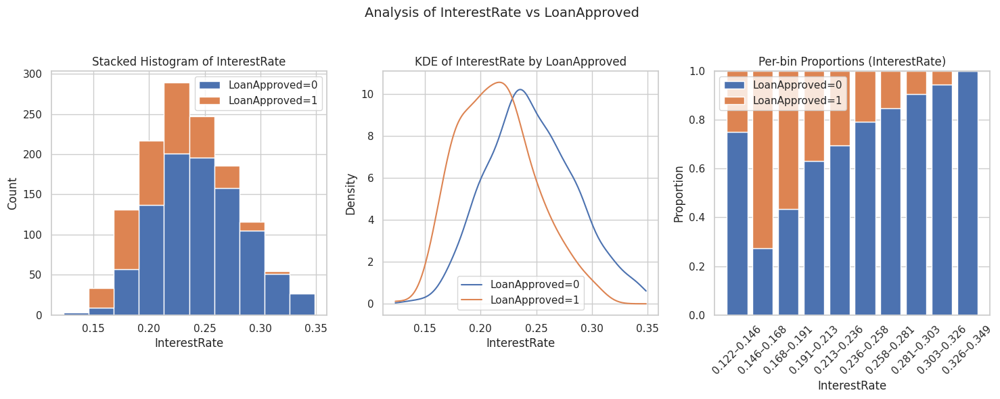

Group sizes — LoanApproved=0: 944, LoanApproved=1: 360
Shapiro–Wilk for LoanApproved=0: p = 0.0005 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0004 → Non-normal
Test used: Mann–Whitney U
p-value: 8.34184633484095e-35
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="InterestRate", target_col="LoanApproved",alpha=0.05)

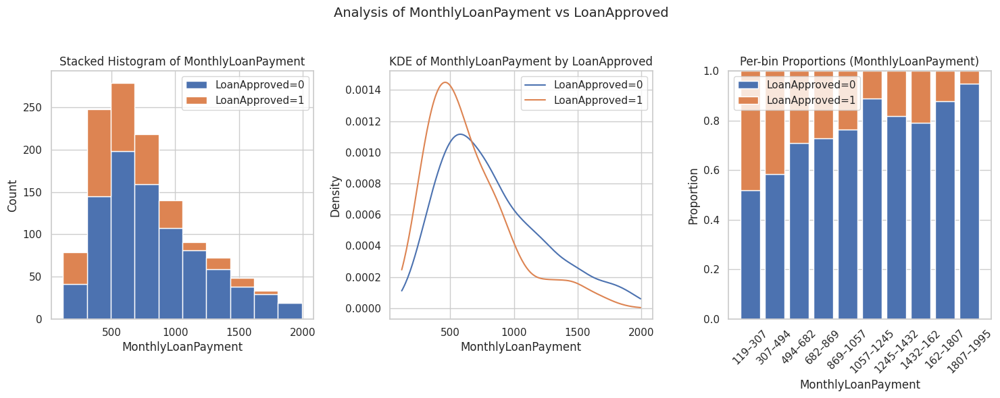

Group sizes — LoanApproved=0: 876, LoanApproved=1: 352
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 9.797105159980659e-15
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="MonthlyLoanPayment", target_col="LoanApproved",alpha=0.05)

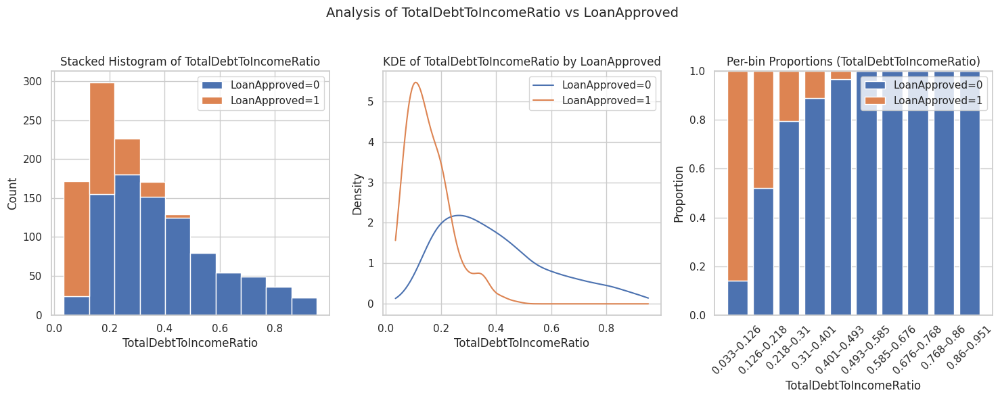

Group sizes — LoanApproved=0: 877, LoanApproved=1: 360
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0000 → Non-normal
Test used: Mann–Whitney U
p-value: 1.5128338274400124e-104
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="TotalDebtToIncomeRatio", target_col="LoanApproved",alpha=0.05)

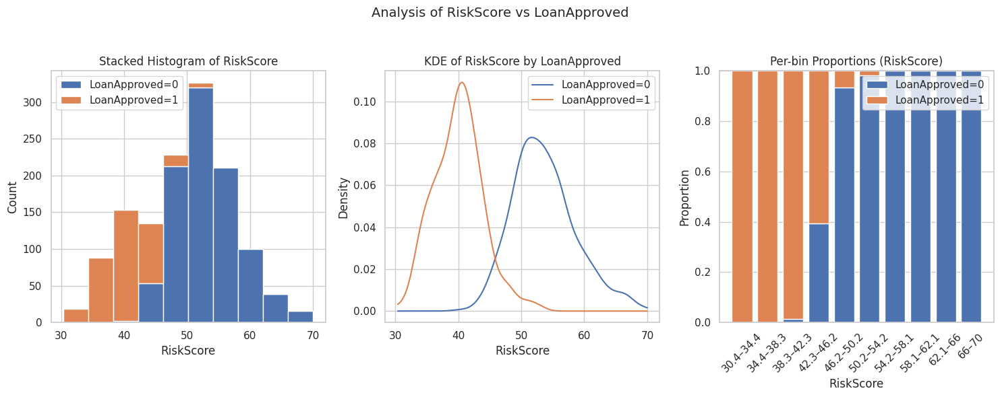

Group sizes — LoanApproved=0: 954, LoanApproved=1: 361
Shapiro–Wilk for LoanApproved=0: p = 0.0000 → Non-normal
Shapiro–Wilk for LoanApproved=1: p = 0.0004 → Non-normal
Test used: Mann–Whitney U
p-value: 3.794403547668987e-164
  → H0 rejected at 5.0% significance level.


In [ ]:
analyze_continuous_vs_binary(data, cont_col="RiskScore", target_col="LoanApproved",alpha=0.05)